# Importing Libraries

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 18.5 MB/s 


In [1]:
import pandas as pd
import numpy as np
import math
import seaborn as sns
import matplotlib.pyplot as plt

# import plotly.graph_objects as go
# import plotly.express as px
# import plotly.io as pio

from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_squared_log_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Lasso, Ridge

# import lightgbm as lgb
import xgboost

import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.layers import LSTM, GRU, Bidirectional
from keras.models import load_model
# import shap
# tf.compat.v1.disable_v2_behavior()

import warnings
warnings.filterwarnings("ignore")

# Reading Data

In [2]:
columns = ['SP500', 'TSX', 'Gold', 'ED', 'BCPI', 'IR', 'PPI', 'M1', 'M3', 'Oil', 'Unemployment', 'IndProd', 'PPP']

In [3]:
freq_col = ['D', 'D', 'D', 'D', 'M', 'M', 'M', 'M', 'M', 'M', 'M', 'M', 'Y']

In [4]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/data/Final Dataset/final_data.csv')
df.head()

,DATE,DEXCAUS,SP500,TSX,Gold,ED,month,year,day,year_month,BCPI,IR,PPI,M1,M3,Oil,Unemployment,IndProd,PPP
0,2009-01-02,1.2101,931.80,9234.099609,869.75,1.41,1,2009,2,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
1,2009-01-05,1.1920,927.45,9285.500000,860.00,1.42,1,2009,5,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
2,2009-01-06,1.1822,934.70,9472.099609,844.00,1.41,1,2009,6,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
3,2009-01-07,1.1850,906.65,9121.299805,864.00,1.40,1,2009,7,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
4,2009-01-08,1.1890,909.73,9221.599609,842.50,1.35,1,2009,8,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244


In [5]:
df['DATE'] = pd.to_datetime(df['DATE'])
df.head()

,DATE,DEXCAUS,SP500,TSX,Gold,ED,month,year,day,year_month,BCPI,IR,PPI,M1,M3,Oil,Unemployment,IndProd,PPP
0,2009-01-02,1.2101,931.80,9234.099609,869.75,1.41,1,2009,2,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
1,2009-01-05,1.1920,927.45,9285.500000,860.00,1.42,1,2009,5,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
2,2009-01-06,1.1822,934.70,9472.099609,844.00,1.41,1,2009,6,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
3,2009-01-07,1.1850,906.65,9121.299805,864.00,1.40,1,2009,7,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
4,2009-01-08,1.1890,909.73,9221.599609,842.50,1.35,1,2009,8,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244


In [6]:
df.iloc[:,[1,2,3,4,5,10,11,12,13,14,15,16,17,18]].describe()

,DEXCAUS,SP500,TSX,Gold,ED,BCPI,IR,PPI,M1,M3,Oil,Unemployment,IndProd,PPP
count,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000
mean,1.185385,2155.147206,14339.022356,1385.192714,0.773272,501.538875,1.025706,101.339372,107.618750,103.995166,68.803332,7.275530,98.098204,1.231986
std,0.138619,922.888723,2486.567409,256.349590,0.752578,111.344929,0.497202,7.903404,37.476721,28.139384,21.835345,1.232692,5.258471,0.022513
min,0.944800,676.530000,7566.899902,813.000000,0.114130,243.700000,0.178375,88.450260,57.678680,66.243840,16.550000,5.400000,74.638040,1.202244
25%,1.035700,1351.770000,12456.500000,1217.700000,0.258100,410.360000,0.740455,97.839420,77.620290,79.485270,49.820000,6.700000,95.677060,1.212304
50%,1.242500,2049.580000,14376.200195,1311.100000,0.360000,480.070000,1.157000,100.080000,99.241960,98.629130,67.730000,7.100000,99.053790,1.230358
75%,1.311700,2747.710000,15807.200195,1598.250000,1.150000,613.720000,1.180000,105.841600,125.191100,122.461100,89.040000,7.700000,101.216300,1.245722
max,1.459200,4793.060000,21768.500000,2061.500000,2.823750,721.830000,2.192631,126.006900,204.289100,163.194200,110.040000,13.400000,107.110800,1.286727


# ADF & KPSS

In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss

#a. ADF Test
adf_test = adfuller(df.DEXCAUS)
print('stat=%.3f, p=%.3f' % adf_test[0:2])
if adf_test[1] > 0.05:
 print('Probably not Stationary')
else:
 print('Probably Stationary')

#b. KPSS Test
kpss_test = kpss(df.DEXCAUS)
print('stat=%.3f, p=%.3f' % kpss_test[0:2])
if kpss_test[1] > 0.05:
    print('Probably Stationary')
else:
    print('Probably not Stationary')

stat=-1.243, p=0.655
Probably not Stationary
stat=7.877, p=0.010
Probably not Stationary


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


# ACF & PACF

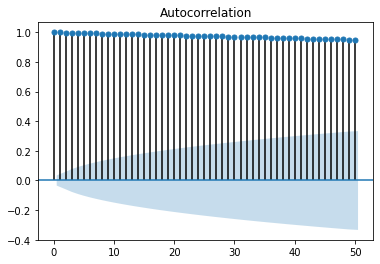

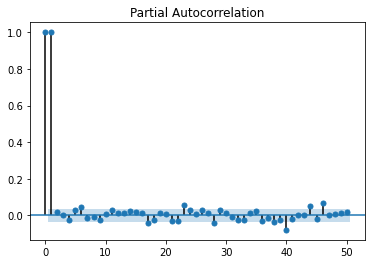

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
date_fx_log_diff = df.DEXCAUS.values.reshape(-1)
plot_acf(date_fx_log_diff, lags=50)
plot_pacf(date_fx_log_diff, lags=50)
plt.show()

# Exploratory Plots

In [7]:
plt.rcParams.update({'font.size': 30})

In [8]:
# freq: D, M, Y
def plot_attr(attr_name, freq, save=False):
  plt.figure(figsize=(15,7))

  if freq == 'D':
    plt.plot(df['DATE'], df[attr_name])
  elif freq == 'M':
    data = df[['year_month', attr_name]]
    data.drop_duplicates(inplace=True)
    plt.plot([pd.to_datetime(str(ym)[:4] + '-' + str(ym)[4:]) for ym in data['year_month'].values], data[attr_name])
  else:
    plt.plot(df['year'], df[attr_name])
  
  plt.ylabel(attr_name)
  plt.xlabel('Year')
  if save:
    plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/data/'+attr_name+'.pdf')
  plt.show()

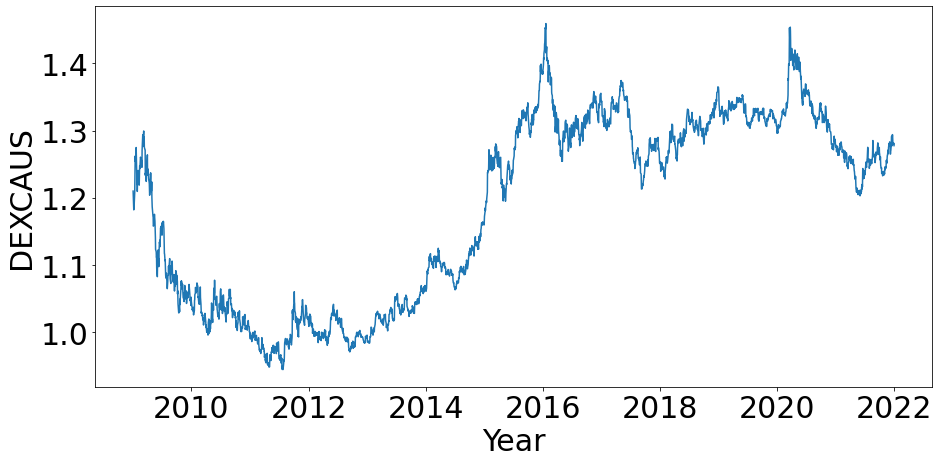

In [9]:
plot_attr('DEXCAUS', 'D', save=True)

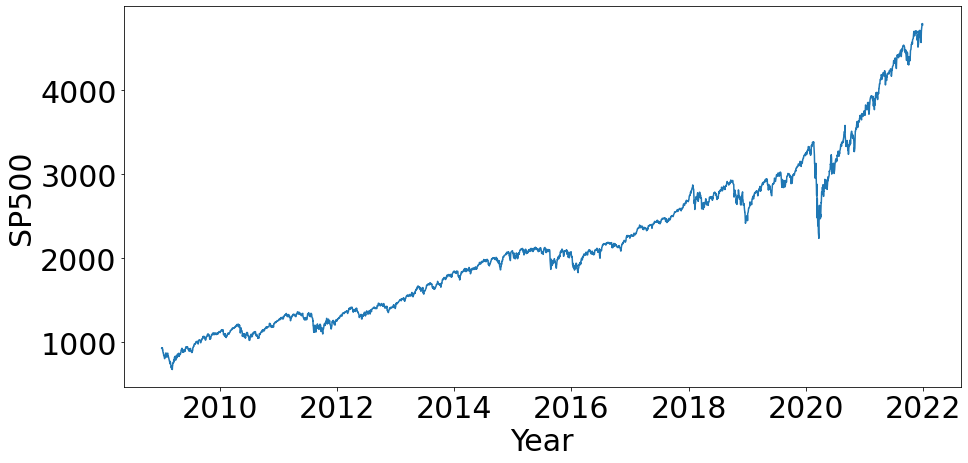

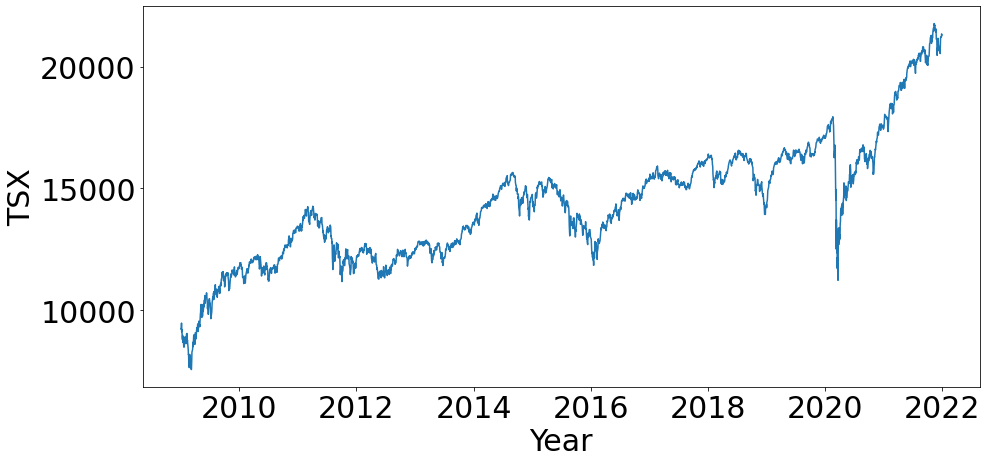

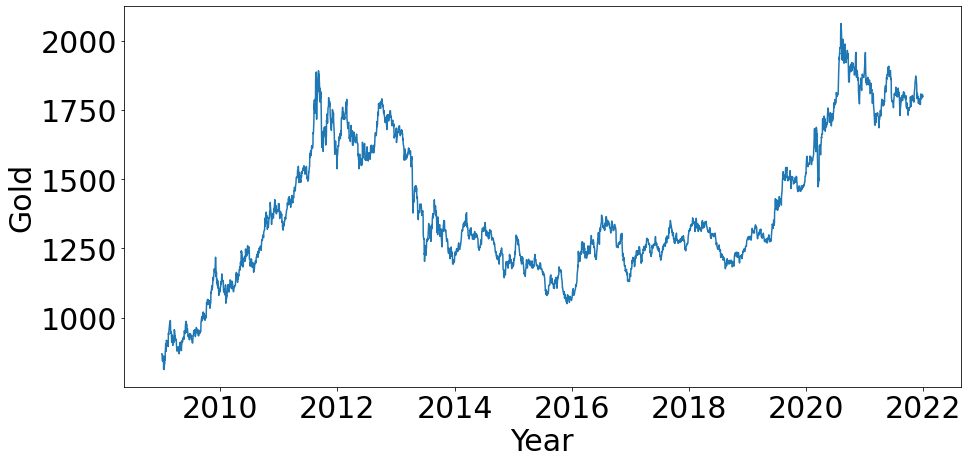

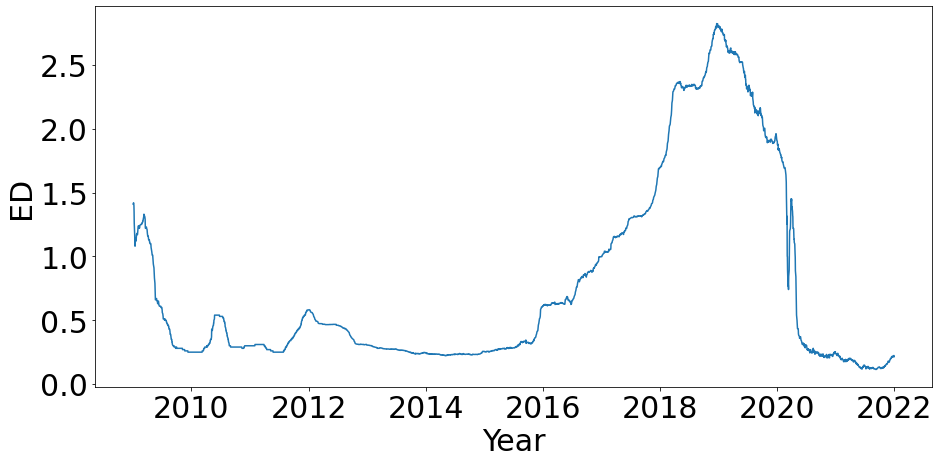

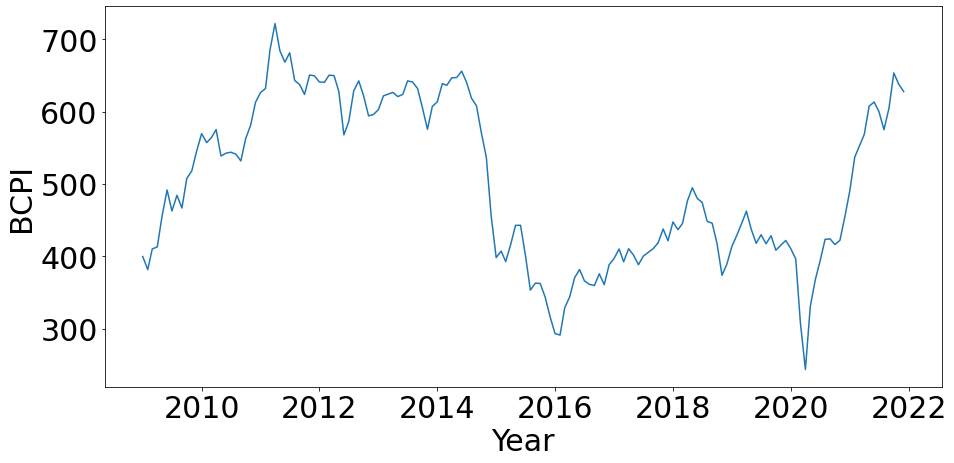

...

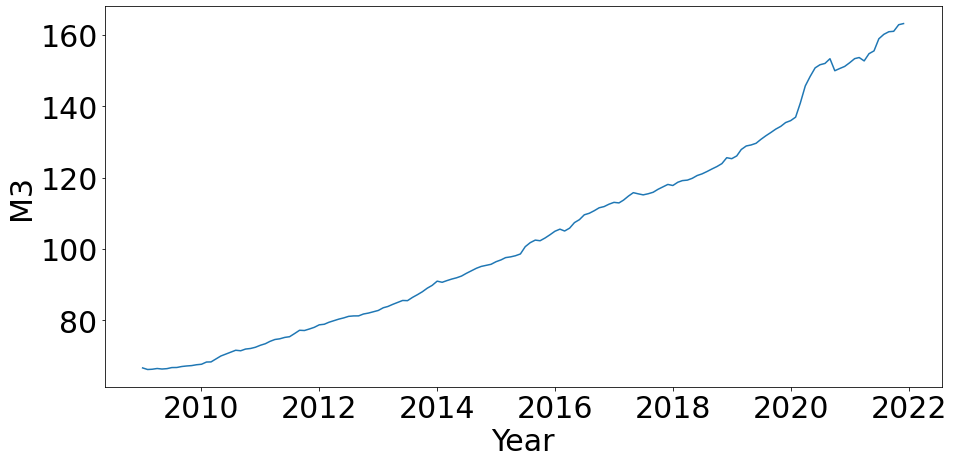

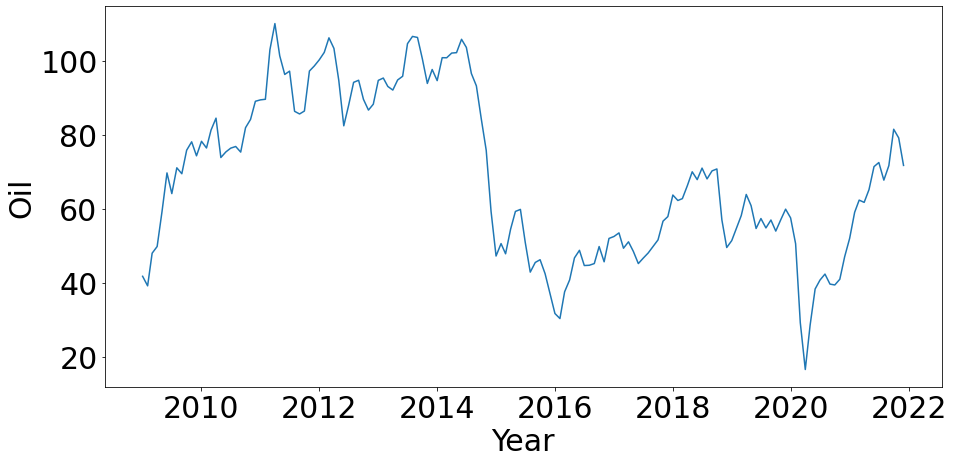

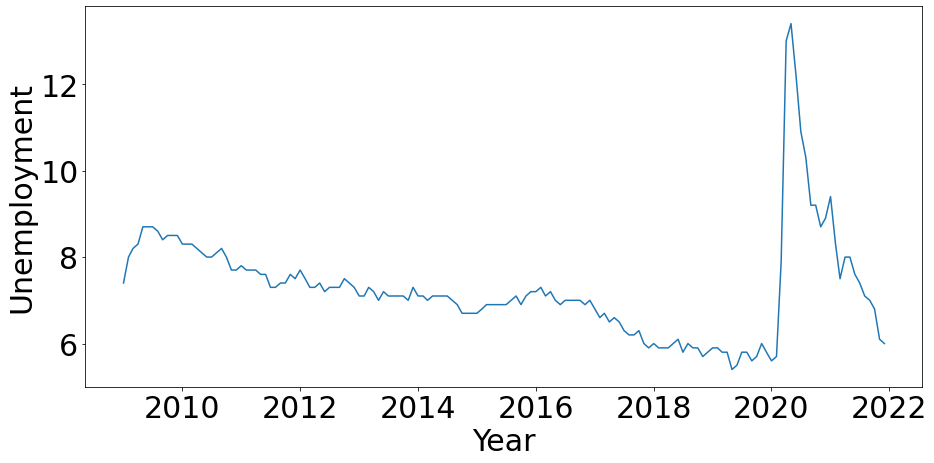

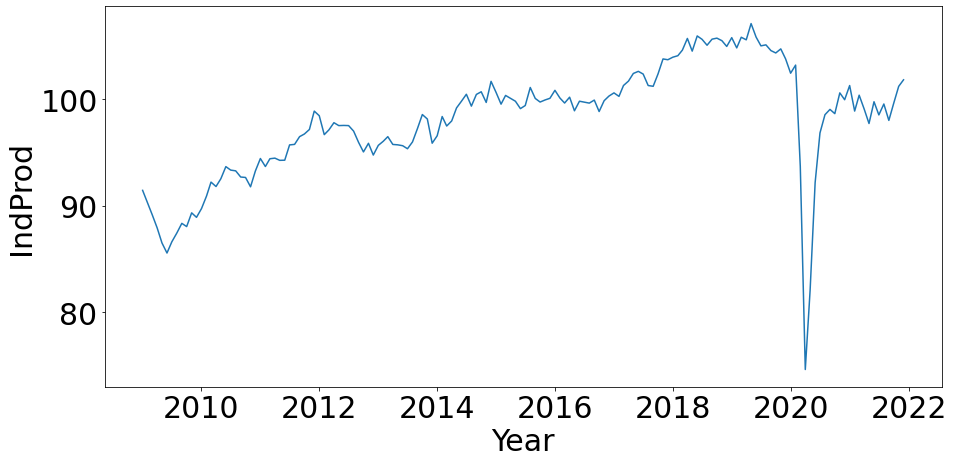

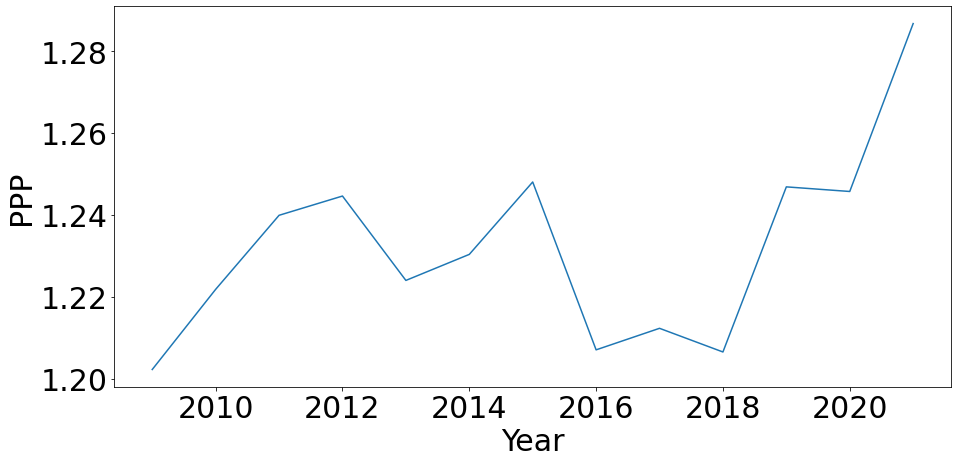

In [10]:
for col, freq in zip(columns, freq_col):
  plot_attr(col, freq, save=True)

In [11]:
df.head()

,DATE,DEXCAUS,SP500,TSX,Gold,ED,month,year,day,year_month,BCPI,IR,PPI,M1,M3,Oil,Unemployment,IndProd,PPP
0,2009-01-02,1.2101,931.80,9234.099609,869.75,1.41,1,2009,2,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
1,2009-01-05,1.1920,927.45,9285.500000,860.00,1.42,1,2009,5,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
2,2009-01-06,1.1822,934.70,9472.099609,844.00,1.41,1,2009,6,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
3,2009-01-07,1.1850,906.65,9121.299805,864.00,1.40,1,2009,7,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244
4,2009-01-08,1.1890,909.73,9221.599609,842.50,1.35,1,2009,8,20091,399.85,1.589048,89.5172,57.67868,66.68929,41.74,7.4,91.45509,1.202244


In [14]:
plt.rcParams.update({'font.size': 21})

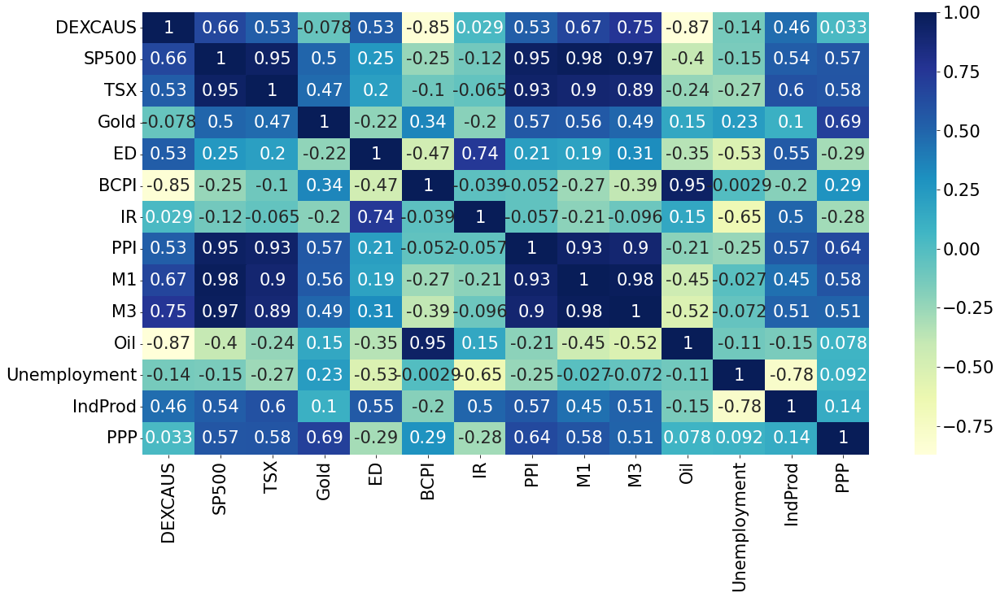

In [16]:
plt.figure(figsize=(20,10))
sns.heatmap(df.iloc[:,[1,2,3,4,5,10,11,12,13,14,15,16,17,18]].corr(), cmap="YlGnBu", annot=True)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/data/corr.pdf')
plt.show()

# Preparing Train Test Samples

In [ ]:
X = df.loc[:, columns]
y = df.iloc[:, 1]
X.shape, y.shape

((3253, 13), (3253,))

In [ ]:
df_copy = df.copy()

In [ ]:
df_time = df['DATE']
df_vars = df[columns]
df_vars.shape

(3253, 13)

In [ ]:
df_target = df['DEXCAUS']

In [ ]:
data_split = 0.85

In [ ]:
data_series = df["DEXCAUS"].copy()
n_train = int(len(df.DEXCAUS) * data_split)
n_test = (len(df) - n_train)
n_train, n_test

(2765, 488)

In [ ]:
# creating target and features for training set
X_train = np.array(df_vars[:-n_test])
y_train = np.array(df_target[:-n_test])
train_dates = df_time[:-n_test]

# creating target and features for test set
X_test = np.array(df_vars[-n_test:])
y_test = np.array(df_target[-n_test:])
test_dates = df_time[-n_test:]

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(2765, 13) (2765,) (488, 13) (488,)


# Models

## RF

In [ ]:
# {'criterion': 'squared_error',
#  'max_depth': 9,
#  'max_features': 'sqrt',
#  'n_estimators': 500}

RF_Model = RandomForestRegressor(n_estimators=400, max_depth=9, max_features='sqrt', random_state=42)

labels = y_train
features = X_train
 
# Fit the RF model with features and labels.
rgr=RF_Model.fit(X_train, y_train)
 
# Now that we've run our models and fit it, let's create
# dataframes to look at the results
predictions_RF=rgr.predict(X_test)

# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=predictions_RF, line_shape='linear', 
              name = 'Prediction'))
fig.show()    

# calculating RMSE metrics
# error = np.sqrt(mean_squared_error(y_test[:-1], y_test[1:]))
# print('Baseline RMSE: %.3f' % error)
# error = np.sqrt(mean_squared_error(predictions_RF, y_test))
# print('Test RMSE: %.3f' % error)
# print(error / np.mean(y_test))

In [ ]:
print(f'MSE: {mean_squared_error(y_test, predictions_RF)}')
print(f'RMSE: {mean_squared_error(y_test, predictions_RF, squared=False)}')
print(f'MAE: {mean_absolute_error(y_test, predictions_RF)}')
print(f'MAPE: {mean_absolute_percentage_error(y_test, predictions_RF)}')
print(f'MSE (Log Error): {mean_squared_log_error(y_test, predictions_RF)}')
print(f'Explained Variance: {round(explained_variance_score(y_test, predictions_RF), 2) * 100}%')

MSE: 0.0028278596929247448
RMSE: 0.05317762398720673
MAE: 0.04426025344728045
MAPE: 0.03355225154355048
MSE (Log Error): 0.0005345377441546263
Explained Variance: 67.0%


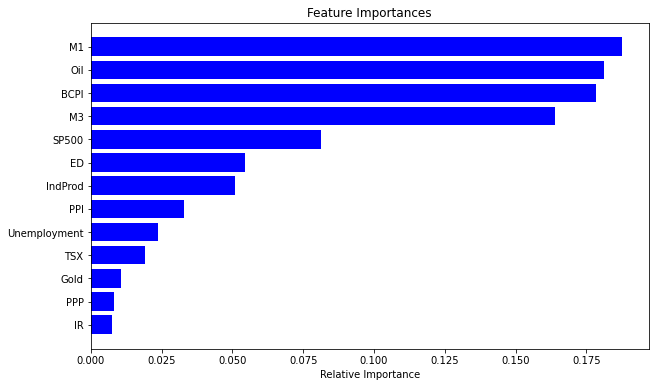

In [ ]:
features = columns
importances = rgr.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(10,6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/RF_feat_imp.pdf')
plt.show()

In [ ]:
# param_grid = { 
#     'n_estimators': [100, 300, 500, 700, 1000, 2000],
#     'max_features': ['sqrt', 'log2'],
#     'max_depth' : [3,4,5,6,7,8,9,10],
#     'criterion' :['squared_error']
# }

In [ ]:
# rfr = RandomForestRegressor(random_state=42)
# CV_rfr = GridSearchCV(estimator=rfr, param_grid=param_grid, cv= 5)
# CV_rfr.fit(X_train, y_train)

In [ ]:
# CV_rfr.best_params_

## ExtraTrees

In [ ]:
# etr = ExtraTreesRegressor(random_state=42)
# CV_etr = GridSearchCV(estimator=etr, param_grid=param_grid, cv= 5, verbose=3)
# CV_etr.fit(X_train, y_train)

In [ ]:
# CV_etr.best_params_

In [ ]:
# {'criterion': 'squared_error',
#  'max_depth': 8,
#  'max_features': 'sqrt',
#  'n_estimators': 300}

ET_Model = ExtraTreesRegressor(n_estimators=300, max_depth=8, max_features='sqrt', random_state=42)

# Fit the ET model with features and labels.
etr=ET_Model.fit(X_train, y_train)
 
# Now that we've run our models and fit it, let's create
# dataframes to look at the results
predictions_ET=etr.predict(X_test)

# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=predictions_ET, line_shape='linear', 
              name = 'Prediction'))
fig.show()    


In [ ]:
print(f'MSE: {mean_squared_error(y_test, predictions_ET)}')
print(f'RMSE: {mean_squared_error(y_test, predictions_ET, squared=False)}')
print(f'MAE: {mean_absolute_error(y_test, predictions_ET)}')
print(f'MAPE: {mean_absolute_percentage_error(y_test, predictions_ET)}')
print(f'MSE (Log Error): {mean_squared_log_error(y_test, predictions_ET)}')
print(f'Explained Variance: {round(explained_variance_score(y_test, predictions_ET), 2) * 100}%')

MSE: 0.0025199360397029176
RMSE: 0.05019896452819438
MAE: 0.036649679867670475
MAPE: 0.027330923387568144
MSE (Log Error): 0.00046440130015171997
Explained Variance: 56.00000000000001%


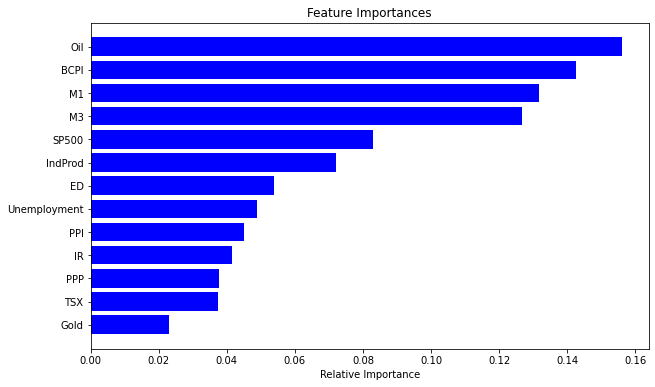

In [ ]:
features = columns
importances = etr.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(10,6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/ET_feat_imp.pdf')
plt.show()

## SVR

In [ ]:
# defining parameter range
# param_grid = {'C': [0.1, 1, 1.5, 2, 5, 10, 100],
#               'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 0.00001],
#               'kernel': ['rbf', 'linear', 'poly'],
#               'epsilon':[0.1,0.2,0.3,0.4,0.5]}

# svr = SVR()
# CV_svr = GridSearchCV(svr, param_grid, refit = True, verbose = 3)
# CV_svr.fit(X_train, y_train)

In [ ]:
# CV_svr.best_params_

In [ ]:
svr_best_params = {'C': 0.1, 'epsilon': 0.1, 'gamma': 1, 'kernel': 'linear'}
SVR_Model = SVR(**svr_best_params)

# Fit the SVR model with features and labels.
svr=SVR_Model.fit(X_train, y_train)
 
# Now that we've run our models and fit it, let's create
# dataframes to look at the results
predictions_SVR=svr.predict(X_test)

# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=predictions_SVR, line_shape='linear', 
              name = 'Prediction'))
fig.show()    


In [ ]:
print(f'MSE: {mean_squared_error(y_test, predictions_SVR)}')
print(f'RMSE: {mean_squared_error(y_test, predictions_SVR, squared=False)}')
print(f'MAE: {mean_absolute_error(y_test, predictions_SVR)}')
print(f'MAPE: {mean_absolute_percentage_error(y_test, predictions_SVR)}')
print(f'MSE (Log Error): {mean_squared_log_error(y_test, predictions_SVR)}')
# print(f'Explained Variance: {round(explained_variance_score(y_test, predictions_SVR), 2) * 100}%')

MSE: 0.007332885664980161
RMSE: 0.08563226999782361
MAE: 0.07214635782214461
MAPE: 0.05690085372616988
MSE (Log Error): 0.0013715789533025702


## Ridge

In [ ]:
# alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000, 2000, 3000, 4000, 5000, 10000]
# param_grid = dict(alpha=alpha)

# ridge = Ridge(random_state=42)

# CV_ridge = GridSearchCV(ridge, param_grid, scoring='r2', verbose=3)
# CV_ridge.fit(X_train, y_train)

In [ ]:
# CV_ridge.best_params_

In [ ]:
Ridge_Model = Ridge(alpha=3000, random_state=42)

# Fit the Ridge model with features and labels.
ridge=Ridge_Model.fit(X_train, y_train)
 
# Now that we've run our models and fit it, let's create
# dataframes to look at the results
predictions_Ridge=ridge.predict(X_test)

# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=predictions_Ridge, line_shape='linear', 
              name = 'Prediction'))
fig.show()    

In [ ]:
print(f'MSE: {mean_squared_error(y_test, predictions_Ridge)}')
print(f'RMSE: {mean_squared_error(y_test, predictions_Ridge, squared=False)}')
print(f'MAE: {mean_absolute_error(y_test, predictions_Ridge)}')
print(f'MAPE: {mean_absolute_percentage_error(y_test, predictions_Ridge)}')
print(f'MSE (Log Error): {mean_squared_log_error(y_test, predictions_Ridge)}')
print(f'Explained Variance: {round(explained_variance_score(y_test, predictions_Ridge), 2) * 100}%')

MSE: 0.0008147842916009653
RMSE: 0.02854442662939589
MAE: 0.023734314160133056
MAPE: 0.01818318405863816
MSE (Log Error): 0.00015251320375464682
Explained Variance: 77.0%


## Lasso

In [ ]:
# alpha = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 2000, 3000, 4000, 5000, 10000]
# param_grid = dict(alpha=alpha)

# lasso = Lasso(random_state=42)

# CV_lasso = GridSearchCV(lasso, param_grid, scoring='r2', verbose=3)
# CV_lasso.fit(X_train, y_train)

In [ ]:
# CV_lasso.best_params_

In [ ]:
Lasso_Model = Lasso(alpha=0.01, random_state=42)

# Fit the Lasso model with features and labels.
lasso=Lasso_Model.fit(X_train, y_train)
 
# Now that we've run our models and fit it, let's create
# dataframes to look at the results
predictions_Lasso=lasso.predict(X_test)

# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=predictions_Lasso, line_shape='linear', 
              name = 'Prediction'))
fig.show()    

In [ ]:
print(f'MSE: {mean_squared_error(y_test, predictions_Lasso)}')
print(f'RMSE: {mean_squared_error(y_test, predictions_Lasso, squared=False)}')
print(f'MAE: {mean_absolute_error(y_test, predictions_Lasso)}')
print(f'MAPE: {mean_absolute_percentage_error(y_test, predictions_Lasso)}')
print(f'MSE (Log Error): {mean_squared_log_error(y_test, predictions_Lasso)}')
print(f'Explained Variance: {round(explained_variance_score(y_test, predictions_Lasso), 2) * 100}%')

MSE: 0.0006618508529914471
RMSE: 0.025726462115717486
MAE: 0.020051782616108835
MAPE: 0.015354783970397244
MSE (Log Error): 0.00012137201652231359
Explained Variance: 79.0%


## XGBoost

In [ ]:
# params = { 'max_depth': [3,5,7,9],
#            'learning_rate': [0.01, 0.05, 0.1, 0.15],
#            'n_estimators': [100, 300, 500, 700, 1000],
#            'colsample_bytree': [0.3, 0.5, 0.7]}

# xgbr = xgboost.XGBRegressor(seed = 20, random_state=123)
# clf = GridSearchCV(estimator=xgbr, 
#                    param_grid=params,
#                    scoring='neg_mean_squared_error', 
#                    verbose=3)

# clf.fit(X_train, y_train)
# print("Best parameters:", clf.best_params_)
# print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

In [ ]:
# Best parameters: {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 1000}

XGB_Model = xgboost.XGBRegressor(n_estimators=1000, max_depth=3, colsample_bytree=0.5, learning_rate=0.1, random_state=42)

labels = y_train
features = X_train
 
# Fit the XGB model with features and labels.
xgbr=XGB_Model.fit(X_train, y_train)
 
# Now that we've run our models and fit it, let's create
# dataframes to look at the results
predictions_XGB=xgbr.predict(X_test)

# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=predictions_XGB, line_shape='linear', 
              name = 'Prediction'))
fig.show()    

# calculating RMSE metrics
# error = np.sqrt(mean_squared_error(y_test[:-1], y_test[1:]))
# print('Baseline RMSE: %.3f' % error)
# error = np.sqrt(mean_squared_error(predictions_RF, y_test))
# print('Test RMSE: %.3f' % error)
# print(error / np.mean(y_test))

[00:10:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
print(f'MSE: {mean_squared_error(y_test, predictions_XGB)}')
print(f'RMSE: {mean_squared_error(y_test, predictions_XGB, squared=False)}')
print(f'MAE: {mean_absolute_error(y_test, predictions_XGB)}')
print(f'MAPE: {mean_absolute_percentage_error(y_test, predictions_XGB)}')
print(f'MSE (Log Error): {mean_squared_log_error(y_test, predictions_XGB)}')
print(f'Explained Variance: {round(explained_variance_score(y_test, predictions_XGB), 2) * 100}%')

MSE: 0.00469202944395167
RMSE: 0.06849839008291851
MAE: 0.05643071002999291
MAPE: 0.0434346079348862
MSE (Log Error): 0.0009289401996233994
Explained Variance: 45.0%


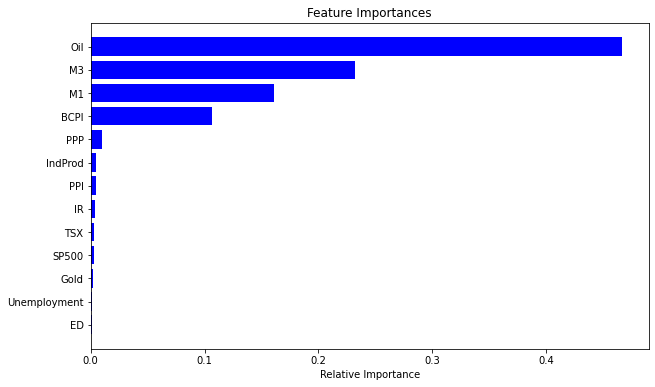

In [ ]:
features = columns
importances = xgbr.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(10,6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/XGB_feat_imp.pdf')
plt.show()

## LSTM

### 1 Step

In [ ]:
X_scaler = MinMaxScaler()
Y_scaler = MinMaxScaler()
X_data = X_scaler.fit_transform(X)
Y_data = Y_scaler.fit_transform(y.to_numpy().reshape(-1,1))

In [ ]:
X_train_LSTM = X_data[:-n_test]
y_train_LSTM = Y_data[:-n_test]

# creating target and features for test set
X_test_LSTM = X_data[-n_test:]
y_test_LSTM = Y_data[-n_test:]

In [ ]:
X_train_LSTM = X_train_LSTM.reshape(X_train_LSTM.shape[0], X_train_LSTM.shape[1], 1)
X_train_LSTM.shape

(2765, 13, 1)

In [ ]:
X_test_LSTM = X_test_LSTM.reshape(X_test_LSTM.shape[0], X_test_LSTM.shape[1], 1)
X_test_LSTM.shape

(488, 13, 1)

In [ ]:
batch_size = 256
buffer_size = 150
train_data = tf.data.Dataset.from_tensor_slices((X_train_LSTM, y_train_LSTM))
train_data = train_data.cache().shuffle(buffer_size).batch(batch_size).repeat()
val_data = tf.data.Dataset.from_tensor_slices((X_test_LSTM, y_test_LSTM))
val_data = val_data.batch(batch_size).repeat() 

In [ ]:
model = Sequential()
model.add(LSTM(500, activation='relu', return_sequences=True, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
model.add(LSTM(250, activation='relu', return_sequences=True))
model.add(LSTM(125, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 13, 500)           1004000   
                                                                 
 lstm_9 (LSTM)               (None, 13, 250)           751000    
                                                                 
 lstm_10 (LSTM)              (None, 125)               188000    
                                                                 
 dense_4 (Dense)             (None, 1)                 126       
                                                                 
Total params: 1,943,126
Trainable params: 1,943,126
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_Multivariate_No_Lag.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data,epochs=100,steps_per_epoch=100,validation_data=val_data,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 12s 91ms/step - loss: 0.0892 - val_loss: 0.0438
Epoch 2/100
100/100 [==============================] - 8s 82ms/step - loss: 0.0804 - val_loss: 0.0357
Epoch 3/100
100/100 [==============================] - 8s 83ms/step - loss: 0.0668 - val_loss: 0.0418
Epoch 4/100
100/100 [==============================] - 8s 82ms/step - loss: 0.0400 - val_loss: 0.0431
Epoch 5/100
100/100 [==============================] - 8s 80ms/step - loss: 0.0278 - val_loss: 0.0788
Epoch 6/100
100/100 [==============================] - 8s 80ms/step - loss: 0.0202 - val_loss: 0.0553
Epoch 7/100
100/100 [==============================] - 8s 84ms/step - loss: 0.0117 - val_loss: 0.0574
Epoch 8/100
100/100 [==============================] - 8s 81ms/step - loss: 0.0068 - val_loss: 0.0516
Epoch 9/100
100/100 [==============================] - 8s 80ms/step - loss: 0.0059 - val_loss: 0.0468
Epoch 10/100
100/100 [==============================] - 8s 81ms/step - loss: 0.00

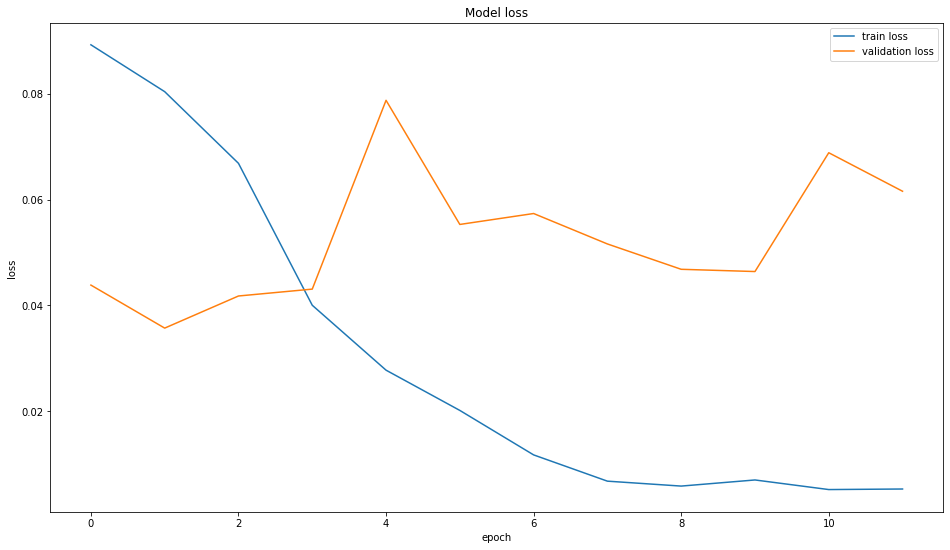

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM, y_test_LSTM)

16/16 [==============================] - 1s 8ms/step - loss: 0.0616


0.061569470912218094

In [ ]:
y_pred_LSTM = model.predict(X_test_LSTM)
pred_Inverse_LSTM = Y_scaler.inverse_transform(np.reshape(y_pred_LSTM, (y_pred_LSTM.shape[0], y_pred_LSTM.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=pred_Inverse_LSTM.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### 5 Step

In [ ]:
target_var = 'DEXCAUS'

In [ ]:
# data_cols = list(columns)
# data_cols.append('DEXCAUS')
# data_cols

In [ ]:
df_5step = df.loc[:,['DATE', 'DEXCAUS']]
df_5step.head()

,DATE,DEXCAUS
0,2009-01-02,1.2101
1,2009-01-05,1.1920
2,2009-01-06,1.1822
3,2009-01-07,1.1850
4,2009-01-08,1.1890


In [ ]:
X_scaler = MinMaxScaler()
y_scaler = MinMaxScaler()

scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df_5step[:-n_test].loc[:,[target_var]])
scaled_df.shape

(2765, 1)

In [ ]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
 X, y = list(), list()
 for i in range(len(sequences)):
  # find the end of this pattern
  end_ix = i + n_steps_in
  out_end_ix = end_ix + n_steps_out-1
  # check if we are beyond the dataset
  if out_end_ix > len(sequences):
   break
  # gather input and output parts of the pattern
  seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix-1:out_end_ix, :]
  X.append(seq_x)
  y.append(seq_y)
 return np.array(X), np.array(y)

In [ ]:
n_past = 15
n_future = 5 
n_features = 1

X_5step, y_5step = split_sequences(scaled_df, n_past, n_future)
X_5step.shape, y_5step.shape

((2747, 15, 1), (2747, 5, 1))

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2334, 15, 1), (2334, 5, 1), (413, 15, 1), (413, 5, 1))

In [ ]:
model = Sequential()
model.add(LSTM(500, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(LSTM(250, activation='relu', return_sequences=True))
model.add(LSTM(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 15, 500)           1004000   
                                                                 
 lstm_1 (LSTM)               (None, 15, 250)           751000    
                                                                 
 lstm_2 (LSTM)               (None, 125)               188000    
                                                                 
 dense (Dense)               (None, 5)                 630       
                                                                 
Total params: 1,943,630
Trainable params: 1,943,630
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_Multivariate_No_Lag_5step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 0.1398WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


10/10 [==============================] - 7s 165ms/step - loss: 0.1398 - val_loss: 0.0204
Epoch 2/100
10/10 [==============================] - 1s 98ms/step - loss: 0.0175
Epoch 3/100
10/10 [==============================] - 1s 99ms/step - loss: 0.0076
Epoch 4/100
10/10 [==============================] - 1s 98ms/step - loss: 0.0028
Epoch 5/100
10/10 [==============================] - 1s 98ms/step - loss: 0.0017
Epoch 6/100
10/10 [==============================] - 1s 97ms/step - loss: 0.0015
Epoch 7/100
10/10 [==============================] - 1s 98ms/step - loss: 0.0015
Epoch 8/100
10/10 [==============================] - 1s 107ms/step - loss: 0.0015
Epoch 9/100
10/10 [==============================] - 1s 101ms/step - loss: 0.0014
Epoch 10/100
10/10 [==============================] - 1s 99ms/step - loss: 0.0014
Epoch 11/100
10/10 [==============================] - 1s 91ms/step - loss: 0.0014
Epoch 12/100
10/10 [==============================] - 1s 88ms/step - loss: 0.0014
Epoch 13/100
10

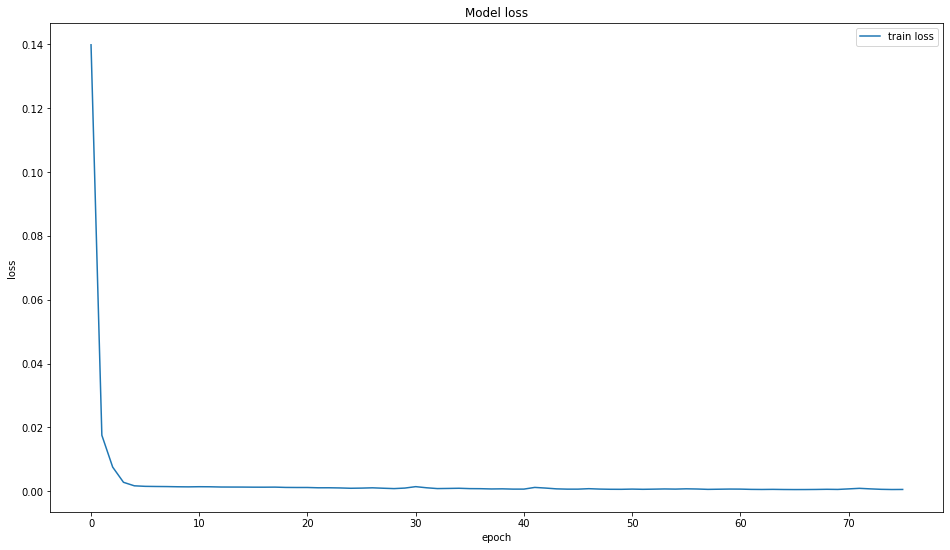

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
def prep_data(X_test, y_test, pos, sc):
    test_X_new = X_test[pos]
    test_X_new = test_X_new.reshape(1,n_past,n_features)
    # print(test_X_new.shape)

    y_pred = model.predict(test_X_new)
    y_pred_inv = sc.inverse_transform(y_pred)
    # print(y_pred.shape, y_pred_inv.shape)
    
    return y_pred_inv

In [ ]:
preds_5step = []
actual_5step = []
for i in range(len(test_X)):
  preds_5step.append(prep_data(test_X, test_y, i, scaler))
  actual_5step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(preds_5step), len(actual_5step)

(413, 413)

In [ ]:
Mape_5step = []
Mae_5step= []
Rmse_5step = []
Nrmse_5step = []

for pred,actual in zip(preds_5step, actual_5step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_5step.append(mape)
  Mae_5step.append(mae)
  Rmse_5step.append(rmse)
  Nrmse_5step.append(nrmse)

In [ ]:
return_metrics(Mape_5step, Mae_5step, Rmse_5step, Nrmse_5step)

('0.005 +- 0.003', '0.006 +- 0.004', '0.006 +- 0.004', '0.005 +- 0.003')

### 10 Step

In [ ]:
target_var = 'DEXCAUS'

In [ ]:
# data_cols = list(columns)
# data_cols.append('DEXCAUS')
# data_cols

In [ ]:
df_10step = df.loc[:,['DATE', 'DEXCAUS']]
df_10step.head()

,DATE,DEXCAUS
0,2009-01-02,1.2101
1,2009-01-05,1.1920
2,2009-01-06,1.1822
3,2009-01-07,1.1850
4,2009-01-08,1.1890


In [ ]:
X_scaler = MinMaxScaler()
y_scaler = MinMaxScaler()

scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df_10step[:-n_test].loc[:,[target_var]])
scaled_df.shape

(2765, 1)

In [ ]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
 X, y = list(), list()
 for i in range(len(sequences)):
  # find the end of this pattern
  end_ix = i + n_steps_in
  out_end_ix = end_ix + n_steps_out-1
  # check if we are beyond the dataset
  if out_end_ix > len(sequences):
   break
  # gather input and output parts of the pattern
  seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix-1:out_end_ix, :]
  X.append(seq_x)
  y.append(seq_y)
 return np.array(X), np.array(y)

In [ ]:
n_past = 30
n_future = 10
n_features = 1

X_10step, y_10step = split_sequences(scaled_df, n_past, n_future)
X_10step.shape, y_10step.shape

((2727, 30, 1), (2727, 10, 1))

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2317, 30, 1), (2317, 10, 1), (410, 30, 1), (410, 10, 1))

In [ ]:
model = Sequential()
model.add(LSTM(500, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(LSTM(250, activation='relu', return_sequences=True))
model.add(LSTM(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 30, 500)           1004000   
                                                                 
 lstm_4 (LSTM)               (None, 30, 250)           751000    
                                                                 
 lstm_5 (LSTM)               (None, 125)               188000    
                                                                 
 dense_1 (Dense)             (None, 10)                1260      
                                                                 
Total params: 1,944,260
Trainable params: 1,944,260
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_Multivariate_No_Lag_10step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 0.1403WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


10/10 [==============================] - 5s 246ms/step - loss: 0.1403 - val_loss: 0.2589
Epoch 2/100
10/10 [==============================] - 2s 185ms/step - loss: 0.0834
Epoch 3/100
10/10 [==============================] - 2s 182ms/step - loss: 0.0189
Epoch 4/100
10/10 [==============================] - 2s 179ms/step - loss: 0.0064
Epoch 5/100
10/10 [==============================] - 2s 181ms/step - loss: 0.0027
Epoch 6/100
10/10 [==============================] - 2s 185ms/step - loss: 0.0025
Epoch 7/100
10/10 [==============================] - 3s 316ms/step - loss: 0.0023
Epoch 8/100
10/10 [==============================] - 4s 406ms/step - loss: 0.0022
Epoch 9/100
10/10 [==============================] - 4s 364ms/step - loss: 0.0021
Epoch 10/100
10/10 [==============================] - 5s 451ms/step - loss: 0.0022
Epoch 11/100
10/10 [==============================] - 4s 380ms/step - loss: 0.0022
Epoch 12/100
10/10 [==============================] - 2s 193ms/step - loss: 0.0021
Epoch 

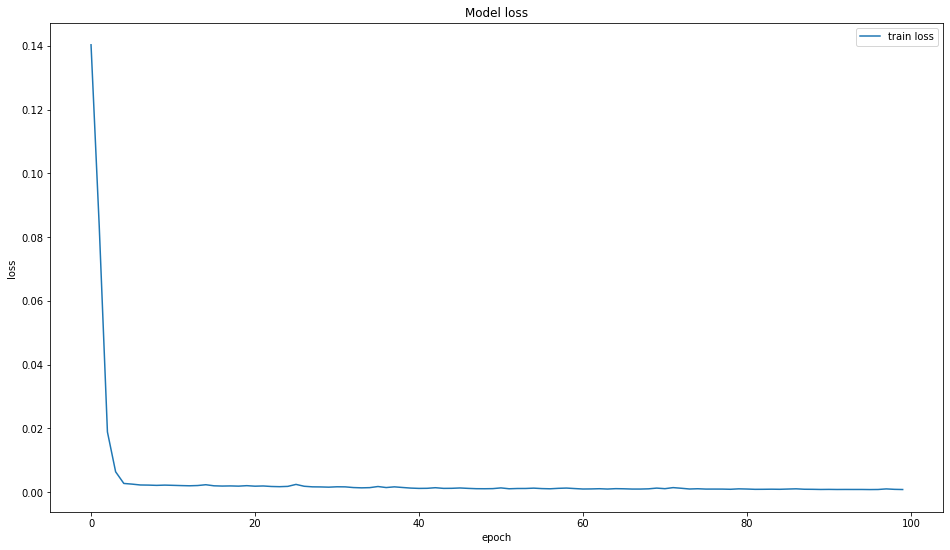

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
def prep_data(X_test, y_test, pos, sc):
    test_X_new = X_test[pos]
    test_X_new = test_X_new.reshape(1,n_past,n_features)
    # print(test_X_new.shape)

    y_pred = model.predict(test_X_new)
    y_pred_inv = sc.inverse_transform(y_pred)
    # print(y_pred.shape, y_pred_inv.shape)
    
    return y_pred_inv

In [ ]:
preds_10step = []
actual_10step = []
for i in range(len(test_X)):
  preds_10step.append(prep_data(test_X, test_y, i, scaler))
  actual_10step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(preds_10step), len(actual_10step)

(410, 410)

In [ ]:
Mape_10step = []
Mae_10step= []
Rmse_10step = []
Nrmse_10step = []

for pred,actual in zip(preds_10step, actual_10step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_10step.append(mape)
  Mae_10step.append(mae)
  Rmse_10step.append(rmse)
  Nrmse_10step.append(nrmse)

In [ ]:
return_metrics(Mape_10step, Mae_10step, Rmse_10step, Nrmse_10step)

('0.006 +- 0.004', '0.008 +- 0.005', '0.008 +- 0.005', '0.006 +- 0.004')

## GRU

### 1 Step

In [ ]:
model = Sequential()
model.add(GRU(1000, activation='relu', return_sequences=True, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
model.add(GRU(500, activation='relu', return_sequences=True))
model.add(GRU(250, activation='relu', return_sequences=True))
model.add(GRU(125, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 13, 1000)          3009000   
                                                                 
 gru_5 (GRU)                 (None, 13, 500)           2253000   
                                                                 
 gru_6 (GRU)                 (None, 13, 250)           564000    
                                                                 
 gru_7 (GRU)                 (None, 125)               141375    
                                                                 
 dense_3 (Dense)             (None, 1)                 126       
                                                                 
Total params: 5,967,501
Trainable params: 5,967,501
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'GRU_Multivariate_No_Lag.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data,epochs=100,steps_per_epoch=100,validation_data=val_data,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 20s 151ms/step - loss: 0.0950 - val_loss: 0.0601
Epoch 2/100
100/100 [==============================] - 14s 144ms/step - loss: 0.0813 - val_loss: 0.0523
Epoch 3/100
100/100 [==============================] - 14s 141ms/step - loss: 0.0794 - val_loss: 0.0565
Epoch 4/100
100/100 [==============================] - 14s 141ms/step - loss: 0.0524 - val_loss: 0.0362
Epoch 5/100
100/100 [==============================] - 14s 139ms/step - loss: 0.0269 - val_loss: 0.0547
Epoch 6/100
100/100 [==============================] - 14s 139ms/step - loss: 0.0093 - val_loss: 0.0827
Epoch 7/100
100/100 [==============================] - 16s 158ms/step - loss: 0.0080 - val_loss: 0.0953
Epoch 8/100
100/100 [==============================] - 14s 140ms/step - loss: 0.0077 - val_loss: 0.1103
Epoch 9/100
100/100 [==============================] - 14s 139ms/step - loss: 0.0080 - val_loss: 0.1483
Epoch 10/100
100/100 [==============================] - 14s 139m

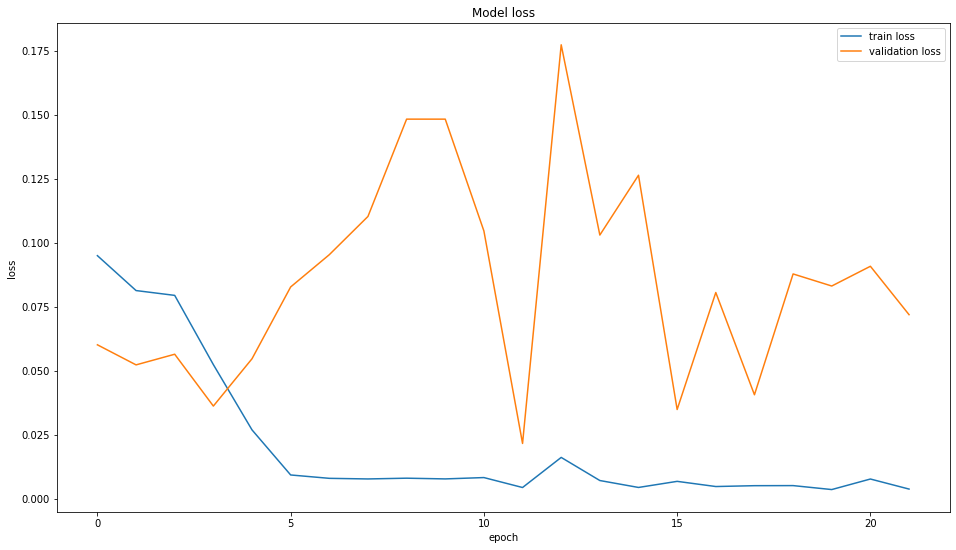

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM, y_test_LSTM)

16/16 [==============================] - 1s 13ms/step - loss: 0.0719


0.07191041111946106

In [ ]:
y_pred_GRU = model.predict(X_test_LSTM)
pred_Inverse_GRU = Y_scaler.inverse_transform(np.reshape(y_pred_GRU, (y_pred_GRU.shape[0], y_pred_GRU.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=pred_Inverse_GRU.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### 5 Step

In [ ]:
n_past = 15
n_future = 5
n_features = 1

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
model = Sequential()
model.add(GRU(1000, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(GRU(500, activation='relu', return_sequences=True))
model.add(GRU(250, activation='relu', return_sequences=True))
model.add(GRU(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 15, 1000)          3009000   
                                                                 
 gru_5 (GRU)                 (None, 15, 500)           2253000   
                                                                 
 gru_6 (GRU)                 (None, 15, 250)           564000    
                                                                 
 gru_7 (GRU)                 (None, 125)               141375    
                                                                 
 dense_3 (Dense)             (None, 5)                 630       
                                                                 
Total params: 5,968,005
Trainable params: 5,968,005
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'GRU_Multivariate_No_Lag_5step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 0.0981WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


10/10 [==============================] - 11s 357ms/step - loss: 0.0981 - val_loss: 0.0578
Epoch 2/100
10/10 [==============================] - 6s 582ms/step - loss: 0.0110
Epoch 3/100
10/10 [==============================] - 4s 383ms/step - loss: 0.0021
Epoch 4/100
10/10 [==============================] - 3s 271ms/step - loss: 0.0011
Epoch 5/100
10/10 [==============================] - 3s 307ms/step - loss: 9.1416e-04
Epoch 6/100
10/10 [==============================] - 4s 408ms/step - loss: 8.8452e-04
Epoch 7/100
10/10 [==============================] - 3s 263ms/step - loss: 8.5243e-04
Epoch 8/100
10/10 [==============================] - 3s 258ms/step - loss: 8.7297e-04
Epoch 9/100
10/10 [==============================] - 3s 279ms/step - loss: 8.6830e-04
Epoch 10/100
10/10 [==============================] - 4s 401ms/step - loss: 8.6100e-04
Epoch 11/100
10/10 [==============================] - 4s 363ms/step - loss: 8.9927e-04
Epoch 12/100
10/10 [==============================] - 3s 301

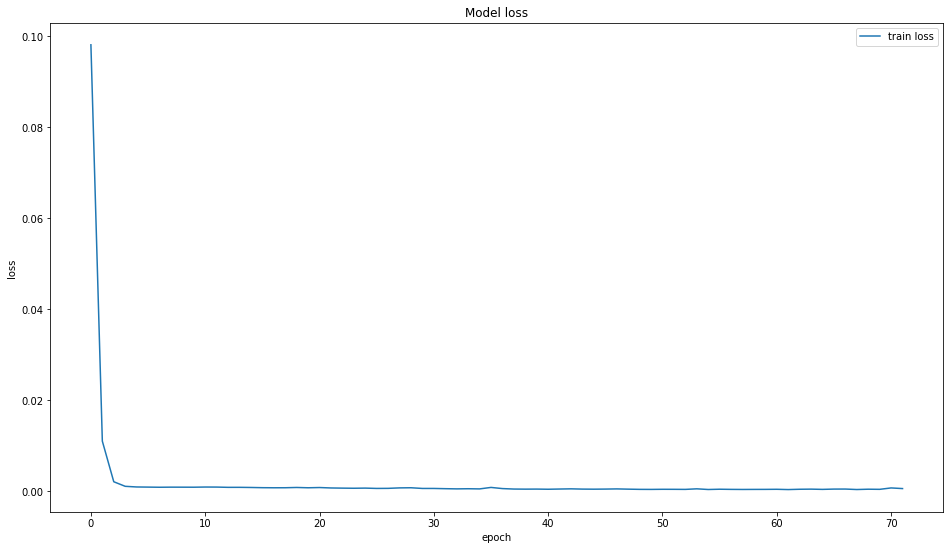

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
gru_preds_5step = []
gru_actual_5step = []
for i in range(len(test_X)):
  gru_preds_5step.append(prep_data(test_X, test_y, i, scaler))
  gru_actual_5step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(gru_preds_5step), len(gru_actual_5step)

(413, 413)

In [ ]:
Mape_5step = []
Mae_5step= []
Rmse_5step = []
Nrmse_5step = []

for pred,actual in zip(gru_preds_5step, gru_actual_5step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_5step.append(mape)
  Mae_5step.append(mae)
  Rmse_5step.append(rmse)
  Nrmse_5step.append(nrmse)

In [ ]:
return_metrics(Mape_5step, Mae_5step, Rmse_5step, Nrmse_5step)

('0.009 +- 0.004', '0.012 +- 0.005', '0.012 +- 0.005', '0.009 +- 0.004')

### 10 Step

In [ ]:
n_past = 30
n_future = 10
n_features = 1

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
model = Sequential()
model.add(GRU(1000, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(GRU(500, activation='relu', return_sequences=True))
model.add(GRU(250, activation='relu', return_sequences=True))
model.add(GRU(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_8 (GRU)                 (None, 30, 1000)          3009000   
                                                                 
 gru_9 (GRU)                 (None, 30, 500)           2253000   
                                                                 
 gru_10 (GRU)                (None, 30, 250)           564000    
                                                                 
 gru_11 (GRU)                (None, 125)               141375    
                                                                 
 dense_4 (Dense)             (None, 10)                1260      
                                                                 
Total params: 5,968,635
Trainable params: 5,968,635
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'GRU_Multivariate_No_Lag_10step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 0.1156WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


10/10 [==============================] - 8s 400ms/step - loss: 0.1156 - val_loss: 0.2212
Epoch 2/100
10/10 [==============================] - 7s 773ms/step - loss: 0.0570
Epoch 3/100
10/10 [==============================] - 7s 665ms/step - loss: 0.0091
Epoch 4/100
10/10 [==============================] - 7s 630ms/step - loss: 0.0036
Epoch 5/100
10/10 [==============================] - 3s 314ms/step - loss: 0.0022
Epoch 6/100
10/10 [==============================] - 3s 309ms/step - loss: 0.0015
Epoch 7/100
10/10 [==============================] - 3s 307ms/step - loss: 0.0013
Epoch 8/100
10/10 [==============================] - 3s 321ms/step - loss: 0.0012
Epoch 9/100
10/10 [==============================] - 3s 322ms/step - loss: 0.0012
Epoch 10/100
10/10 [==============================] - 3s 322ms/step - loss: 0.0011
Epoch 11/100
10/10 [==============================] - 3s 314ms/step - loss: 0.0011
Epoch 12/100
10/10 [==============================] - 3s 305ms/step - loss: 0.0011
Epoch 

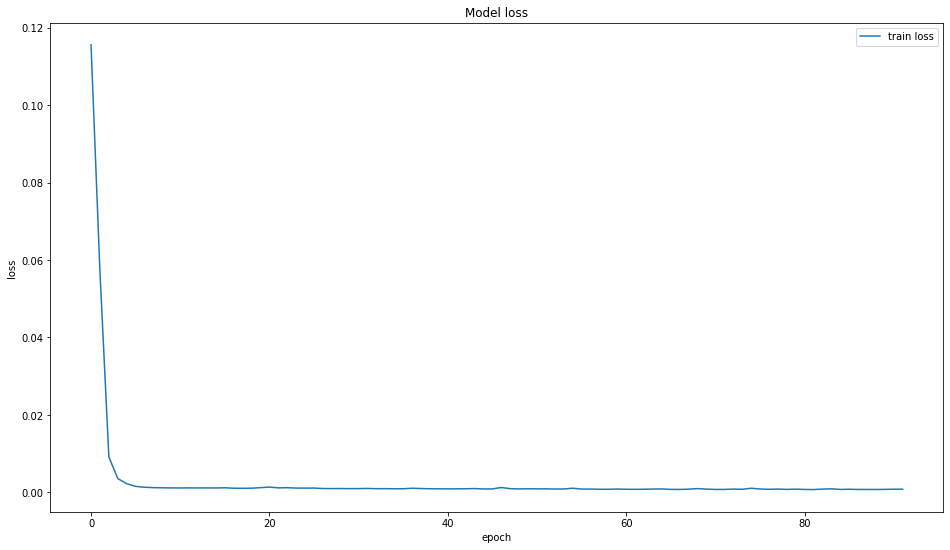

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
gru_preds_10step = []
gru_actual_10step = []
for i in range(len(test_X)):
  gru_preds_10step.append(prep_data(test_X, test_y, i, scaler))
  gru_actual_10step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(gru_preds_10step), len(gru_actual_10step)

(410, 410)

In [ ]:
Mape_10step = []
Mae_10step= []
Rmse_10step = []
Nrmse_10step = []

for pred,actual in zip(gru_preds_10step, gru_actual_10step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_10step.append(mape)
  Mae_10step.append(mae)
  Rmse_10step.append(rmse)
  Nrmse_10step.append(nrmse)

In [ ]:
return_metrics(Mape_10step, Mae_10step, Rmse_10step, Nrmse_10step)

('0.007 +- 0.004', '0.01 +- 0.005', '0.01 +- 0.005', '0.007 +- 0.004')

## GRU-LSTM

### 1 Step

In [ ]:
model = Sequential()
model.add(GRU(512, activation='relu', return_sequences=True, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
model.add(LSTM(256, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 13, 512)           791040    
                                                                 
 lstm_4 (LSTM)               (None, 256)               787456    
                                                                 
 dense_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 1,578,753
Trainable params: 1,578,753
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_GRU_Multivariate_No_Lag.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data,epochs=100,steps_per_epoch=100,validation_data=val_data,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 20s 146ms/step - loss: 0.0979 - val_loss: 0.0439
Epoch 2/100
100/100 [==============================] - 6s 65ms/step - loss: 0.0817 - val_loss: 0.0389
Epoch 3/100
100/100 [==============================] - 7s 73ms/step - loss: 0.0754 - val_loss: 0.0253
Epoch 4/100
100/100 [==============================] - 6s 63ms/step - loss: 0.0338 - val_loss: 0.0182
Epoch 5/100
100/100 [==============================] - 6s 63ms/step - loss: 0.0107 - val_loss: 0.0146
Epoch 6/100
100/100 [==============================] - 6s 60ms/step - loss: 0.0079 - val_loss: 0.0114
Epoch 7/100
100/100 [==============================] - 6s 61ms/step - loss: 0.0131 - val_loss: 0.0416
Epoch 8/100
100/100 [==============================] - 6s 60ms/step - loss: 0.0080 - val_loss: 0.0266
Epoch 9/100
100/100 [==============================] - 6s 59ms/step - loss: 0.0057 - val_loss: 0.0333
Epoch 10/100
100/100 [==============================] - 6s 60ms/step - loss: 0.0

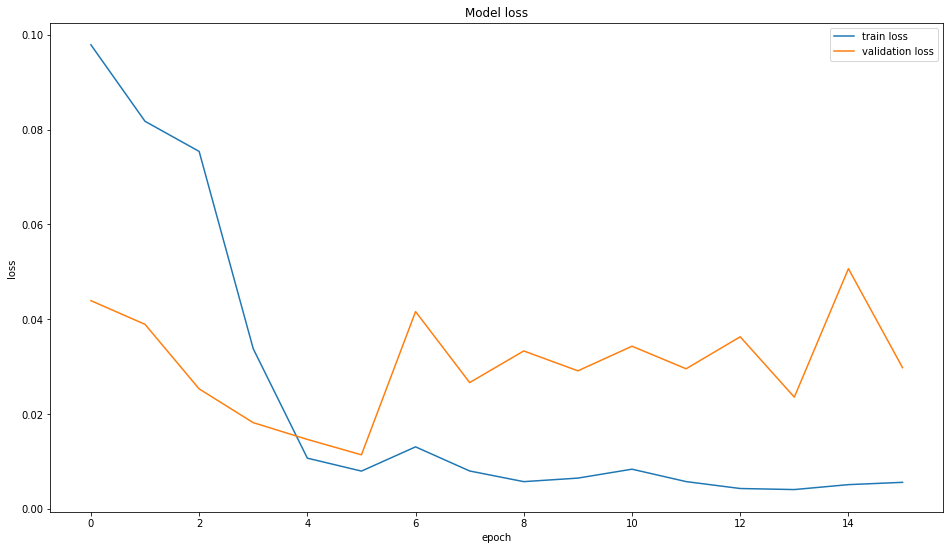

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM, y_test_LSTM)

16/16 [==============================] - 0s 8ms/step - loss: 0.0298


0.029761232435703278

In [ ]:
y_pred_LSTM_GRU = model.predict(X_test_LSTM)
pred_Inverse_LSTM_GRU = Y_scaler.inverse_transform(np.reshape(y_pred_LSTM_GRU, (y_pred_LSTM_GRU.shape[0], y_pred_LSTM_GRU.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates, y=y_test, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates, y=pred_Inverse_LSTM_GRU.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### 5 Step

In [ ]:
n_past = 15
n_future = 5
n_features = 1

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
model = Sequential()
model.add(GRU(512, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(LSTM(256, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_12 (GRU)                (None, 15, 512)           791040    
                                                                 
 lstm_6 (LSTM)               (None, 256)               787456    
                                                                 
 dense_5 (Dense)             (None, 5)                 1285      
                                                                 
Total params: 1,579,781
Trainable params: 1,579,781
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_GRU_Multivariate_No_Lag_5step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 0.1144WARNING:tensorflow:5 out of the last 9 calls to <function Model.make_test_function.<locals>.test_function at 0x7f0c5d7a7e60> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


10/10 [==============================] - 5s 164ms/step - loss: 0.1144 - val_loss: 0.0014
Epoch 2/100
10/10 [==============================] - 1s 136ms/step - loss: 0.0173
Epoch 3/100
10/10 [==============================] - 1s 92ms/step - loss: 0.0033
Epoch 4/100
10/10 [==============================] - 1s 135ms/step - loss: 0.0015
Epoch 5/100
10/10 [==============================] - 1s 153ms/step - loss: 0.0012
Epoch 6/100
10/10 [==============================] - 2s 164ms/step - loss: 9.5710e-04
Epoch 7/100
10/10 [==============================] - 2s 154ms/step - loss: 8.9614e-04
Epoch 8/100
10/10 [==============================] - 1s 103ms/step - loss: 8.6575e-04
Epoch 9/100
10/10 [==============================] - 1s 93ms/step - loss: 8.5994e-04
Epoch 10/100
10/10 [==============================] - 1s 143ms/step - loss: 8.6183e-04
Epoch 11/100
10/10 [==============================] - 1s 148ms/step - loss: 8.3835e-04
Epoch 12/100
10/10 [==============================] - 1s 121ms/step

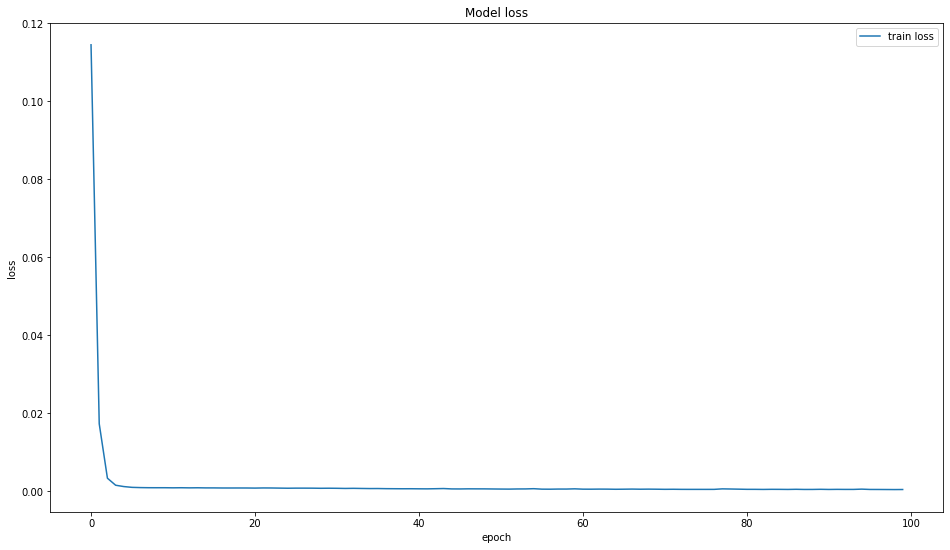

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lstm_gru_preds_5step = []
lstm_gru_actual_5step = []
for i in range(len(test_X)):
  lstm_gru_preds_5step.append(prep_data(test_X, test_y, i, scaler))
  lstm_gru_actual_5step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(lstm_gru_preds_5step), len(lstm_gru_actual_5step)

(413, 413)

In [ ]:
Mape_5step = []
Mae_5step= []
Rmse_5step = []
Nrmse_5step = []

for pred,actual in zip(lstm_gru_preds_5step, lstm_gru_actual_5step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_5step.append(mape)
  Mae_5step.append(mae)
  Rmse_5step.append(rmse)
  Nrmse_5step.append(nrmse)

In [ ]:
return_metrics(Mape_5step, Mae_5step, Rmse_5step, Nrmse_5step)

('0.006 +- 0.003', '0.008 +- 0.004', '0.008 +- 0.004', '0.006 +- 0.003')

### 10 Step

In [ ]:
n_past = 30
n_future = 10
n_features = 1

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
model = Sequential()
model.add(GRU(512, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(LSTM(256, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_13 (GRU)                (None, 30, 512)           791040    
                                                                 
 lstm_7 (LSTM)               (None, 256)               787456    
                                                                 
 dense_6 (Dense)             (None, 10)                2570      
                                                                 
Total params: 1,581,066
Trainable params: 1,581,066
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_GRU_Multivariate_No_Lag_10step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 0.1422WARNING:tensorflow:6 out of the last 11 calls to <function Model.make_test_function.<locals>.test_function at 0x7f0c5bf7c3b0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


10/10 [==============================] - 6s 219ms/step - loss: 0.1422 - val_loss: 0.0357
Epoch 2/100
10/10 [==============================] - 1s 142ms/step - loss: 0.0546
Epoch 3/100
10/10 [==============================] - 1s 138ms/step - loss: 0.0351
Epoch 4/100
10/10 [==============================] - 1s 143ms/step - loss: 0.0063
Epoch 5/100
10/10 [==============================] - 1s 132ms/step - loss: 0.0025
Epoch 6/100
10/10 [==============================] - 1s 134ms/step - loss: 0.0016
Epoch 7/100
10/10 [==============================] - 1s 134ms/step - loss: 0.0015
Epoch 8/100
10/10 [==============================] - 1s 134ms/step - loss: 0.0014
Epoch 9/100
10/10 [==============================] - 1s 134ms/step - loss: 0.0014
Epoch 10/100
10/10 [==============================] - 1s 123ms/step - loss: 0.0014
Epoch 11/100
10/10 [==============================] - 1s 126ms/step - loss: 0.0014
Epoch 12/100
10/10 [==============================] - 1s 134ms/step - loss: 0.0013
Epoch 

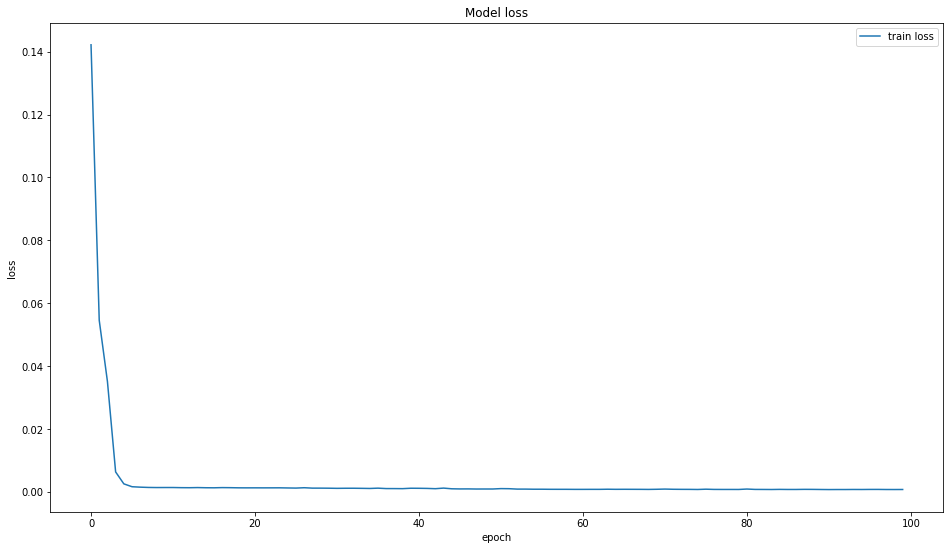

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lstm_gru_preds_10step = []
lstm_gru_actual_10step = []
for i in range(len(test_X)):
  lstm_gru_preds_10step.append(prep_data(test_X, test_y, i, scaler))
  lstm_gru_actual_10step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(lstm_gru_preds_10step), len(lstm_gru_actual_10step)

(410, 410)

In [ ]:
Mape_10step = []
Mae_10step= []
Rmse_10step = []
Nrmse_10step = []

for pred,actual in zip(lstm_gru_preds_10step, lstm_gru_actual_10step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_10step.append(mape)
  Mae_10step.append(mae)
  Rmse_10step.append(rmse)
  Nrmse_10step.append(nrmse)

In [ ]:
return_metrics(Mape_10step, Mae_10step, Rmse_10step, Nrmse_10step)

('0.005 +- 0.003', '0.007 +- 0.004', '0.007 +- 0.004', '0.005 +- 0.003')

## Load Models

In [ ]:
lstm_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_No_Lag.h5')
gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_No_Lag.h5')
lstm_gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_No_Lag.h5')

lstm_model_5step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_No_Lag_5step.h5')
gru_model_5step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_No_Lag_5step.h5')
lstm_gru_model_5step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_No_Lag_5step.h5')

lstm_model_10step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_No_Lag_10step.h5')
gru_model_10step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_No_Lag_10step.h5')
lstm_gru_model_10step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_No_Lag_10step.h5')

### 1 Step

In [ ]:
X_scaler = MinMaxScaler()
Y_scaler = MinMaxScaler()
X_data = X_scaler.fit_transform(X)
Y_data = Y_scaler.fit_transform(y.to_numpy().reshape(-1,1))

In [ ]:
X_train_LSTM = X_data[:-n_test]
y_train_LSTM = Y_data[:-n_test]

# creating target and features for test set
X_test_LSTM = X_data[-n_test:]
y_test_LSTM = Y_data[-n_test:]

In [ ]:
X_train_LSTM = X_train_LSTM.reshape(X_train_LSTM.shape[0], X_train_LSTM.shape[1], 1)
X_train_LSTM.shape

(2765, 13, 1)

In [ ]:
X_test_LSTM = X_test_LSTM.reshape(X_test_LSTM.shape[0], X_test_LSTM.shape[1], 1)
X_test_LSTM.shape

(488, 13, 1)

In [ ]:
y_pred_LSTM = lstm_model.predict(X_test_LSTM)
pred_Inverse_LSTM = Y_scaler.inverse_transform(np.reshape(y_pred_LSTM, (y_pred_LSTM.shape[0], y_pred_LSTM.shape[1])))

In [ ]:
y_pred_GRU = gru_model.predict(X_test_LSTM)
pred_Inverse_GRU = Y_scaler.inverse_transform(np.reshape(y_pred_GRU, (y_pred_GRU.shape[0], y_pred_GRU.shape[1])))

In [ ]:
y_pred_LSTM_GRU = lstm_gru_model.predict(X_test_LSTM)
pred_Inverse_LSTM_GRU = Y_scaler.inverse_transform(np.reshape(y_pred_LSTM_GRU, (y_pred_LSTM_GRU.shape[0], y_pred_LSTM_GRU.shape[1])))

### Multistep

In [ ]:
# split a multivariate sequence into samples
def split_sequences(sequences, date_list, n_steps_in, n_steps_out):
  X, y, dates = list(), list(), list()
  for i in range(len(sequences)):
    # find the end of this pattern
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out-1
    # check if we are beyond the dataset
    if out_end_ix > len(sequences):
      break
    # gather input and output parts of the pattern
    seq_x, seq_y, seq_d = sequences[i:end_ix, :], sequences[end_ix-1:out_end_ix, :], date_list[end_ix-1:out_end_ix]
    X.append(seq_x)
    y.append(seq_y)
    dates.append(seq_d)
  return np.array(X), np.array(y), np.array(dates)

In [ ]:
def prep_data(model, X_test, y_test, pos, sc):
  test_X_new = X_test[pos]
  test_X_new = test_X_new.reshape(1,n_past,n_features)
  # print(test_X_new.shape)

  y_pred = model.predict(test_X_new)
  y_pred_inv = sc.inverse_transform(y_pred)
  # print(y_pred.shape, y_pred_inv.shape)
  
  return y_pred_inv

In [ ]:
target_var = 'DEXCAUS'

#### 5 Step

In [ ]:
df_5step = df.loc[:,['DATE', 'DEXCAUS']]
df_5step.head()

,DATE,DEXCAUS
0,2009-01-02,1.2101
1,2009-01-05,1.1920
2,2009-01-06,1.1822
3,2009-01-07,1.1850
4,2009-01-08,1.1890


In [ ]:
dates_5step = df_5step[:-n_test]['DATE']
dates_5step.shape

(2765,)

In [ ]:
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df_5step[:-n_test].loc[:,[target_var]])
scaled_df.shape

(2765, 1)

In [ ]:
n_past = 15
n_future = 5 
n_features = 1

X_5step, y_5step, dates_5step = split_sequences(scaled_df, dates_5step, n_past, n_future)
X_5step.shape, y_5step.shape, dates_5step.shape

((2747, 15, 1), (2747, 5, 1), (2747, 5))

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
test_dates_5step = dates_5step[split_point:]
test_dates_5step.shape

(413, 5)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2334, 15, 1), (2334, 5, 1), (413, 15, 1), (413, 5, 1))

In [ ]:
actual_5step = []

lstm_preds_5step = []
gru_preds_5step = []
lstm_gru_preds_5step = []

for i in range(len(test_X)):
  lstm_preds_5step.append(prep_data(lstm_model_5step, test_X, test_y, i, scaler))
  gru_preds_5step.append(prep_data(gru_model_5step, test_X, test_y, i, scaler))
  lstm_gru_preds_5step.append(prep_data(lstm_gru_model_5step, test_X, test_y, i, scaler))
  actual_5step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(lstm_preds_5step), len(gru_preds_5step), len(lstm_gru_preds_5step), len(actual_5step)

(413, 413, 413, 413)

#### 10 Step

In [ ]:
df_10step = df.loc[:,['DATE', 'DEXCAUS']]
df_10step.head()

,DATE,DEXCAUS
0,2009-01-02,1.2101
1,2009-01-05,1.1920
2,2009-01-06,1.1822
3,2009-01-07,1.1850
4,2009-01-08,1.1890


In [ ]:
dates_10step = df_10step[:-n_test]['DATE']
dates_10step.shape

(2765,)

In [ ]:
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df_10step[:-n_test].loc[:,[target_var]])
scaled_df.shape

(2765, 1)

In [ ]:
n_past = 30
n_future = 10 
n_features = 1

X_10step, y_10step, dates_10step = split_sequences(scaled_df, dates_10step, n_past, n_future)
X_10step.shape, y_10step.shape

((2727, 30, 1), (2727, 10, 1))

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
test_dates_10step = dates_10step[split_point:]
test_dates_10step.shape

(410, 10)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2317, 30, 1), (2317, 10, 1), (410, 30, 1), (410, 10, 1))

In [ ]:
actual_10step = []

lstm_preds_10step = []
gru_preds_10step = []
lstm_gru_preds_10step = []

for i in range(len(test_X)):
  lstm_preds_10step.append(prep_data(lstm_model_10step, test_X, test_y, i, scaler))
  gru_preds_10step.append(prep_data(gru_model_10step, test_X, test_y, i, scaler))
  lstm_gru_preds_10step.append(prep_data(lstm_gru_model_10step, test_X, test_y, i, scaler))
  actual_10step.append(scaler.inverse_transform(test_y[i]).reshape(1,n_future))

In [ ]:
len(lstm_preds_10step), len(gru_preds_10step), len(lstm_gru_preds_10step), len(actual_10step)

(410, 410, 410, 410)

# Metrics

In [ ]:
def calc_metrics(y_true, y_pred): 
    mae = mean_absolute_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    nrmse = rmse / (np.mean(y_true))
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return mae, mape, rmse, nrmse

def return_metrics(Mape, Mae, Rmse, Nrmse, prec=5):
  mape = str(round(np.mean(Mape), prec))+' +- '+str(round(np.std(Mape), prec)) 
  mae = str(round(np.mean(Mae), prec)) + ' +- ' + str(round(np.std(Mae), prec))
  rmse = str(round(np.mean(Rmse), prec)) + ' +- ' + str(round(np.std(Rmse), prec))
  nrmse = str(round(np.mean(Nrmse), prec)) + ' +- ' + str(round(np.std(Nrmse), prec))
  return mape, mae, rmse, nrmse

def generateValSet(test_size, sample_size):
  val_set = []
  i = 0
  while i < test_size:
    i += sample_size
    if i > test_size:
      i = test_size
      val_set.append(i)
      break
    val_set.append(i)
  return val_set

In [ ]:
df_res = pd.DataFrame(columns=['Model', 'Day(s)', 'MAE', 'ND', 'RMSE', 'NRMSE'])
df_res = df_res.astype(dtype= {"Model":"string",
        "Day(s)":"int","ND":"string", "MAE":"string", "RMSE":"string", "NRMSE":"string"})
pred_days = [1,5,10]

for days in pred_days:
  for model_name in ['Lasso', 'Ridge', 'SVR', 'ExtraTrees', 'RF', 'XGB', 'LSTM', 'GRU', 'GRU-LSTM']:
    Mape = []
    Mae = []
    Rmse = []
    Nrmse = []
    
    val_set = generateValSet(len(y_test), days)
    ground_truth = y_test

    if model_name == 'RF':  
      holdout = predictions_RF
    elif model_name == 'Lasso':
      holdout = predictions_Lasso
    elif model_name == 'Ridge':
      holdout = predictions_Ridge
    elif model_name == 'SVR':
      holdout = predictions_SVR
    elif model_name == 'ExtraTrees':
      holdout = predictions_ET
    elif model_name == 'XGB':
      holdout = predictions_XGB
      
    elif model_name == 'LSTM':
      if days==1:
        holdout = pred_Inverse_LSTM.flatten()
      elif days==5:
        for pred,actual in zip(lstm_preds_5step, actual_5step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue
      elif days==10:
        for pred,actual in zip(lstm_preds_10step, actual_10step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue

    elif model_name == 'GRU':
      if days==1:
        holdout = pred_Inverse_GRU.flatten()
      elif days==5:
        for pred,actual in zip(gru_preds_5step, actual_5step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue
      elif days==10:
        for pred,actual in zip(gru_preds_10step, actual_10step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue

    elif model_name == 'GRU-LSTM':
      if days==1:
        holdout = pred_Inverse_LSTM_GRU.flatten()
      elif days==5:
        for pred,actual in zip(lstm_gru_preds_5step, actual_5step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue
      elif days==10:
        for pred,actual in zip(lstm_gru_preds_10step, actual_10step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue

    else:
      break
  
    for val in val_set:
      forecast = holdout[:val]
      pred = forecast[-days:]
      true = ground_truth[:val]
      actual = true[-days:]
      mae, mape, rmse, nrmse = calc_metrics(actual, pred)
      Mape.append(mape)
      Mae.append(mae)
      Rmse.append(rmse)
      Nrmse.append(nrmse)
      
    metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
    df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)

In [ ]:
df_res

,Model,Day(s),MAE,ND,RMSE,NRMSE
0,Lasso,1,0.02005 +- 0.01612,0.01535 +- 0.01201,0.02005 +- 0.01612,0.01535 +- 0.01201
1,Ridge,1,0.02373 +- 0.01586,0.01818 +- 0.01184,0.02373 +- 0.01586,0.01818 +- 0.01184
2,SVR,1,0.07215 +- 0.04613,0.0569 +- 0.03746,0.07215 +- 0.04613,0.0569 +- 0.03746
3,ExtraTrees,1,0.03665 +- 0.0343,0.02733 +- 0.02428,0.03665 +- 0.0343,0.02733 +- 0.02428
4,RF,1,0.04426 +- 0.02948,0.03355 +- 0.02146,0.04426 +- 0.02948,0.03355 +- 0.02146
5,XGB,1,0.05643 +- 0.03883,0.04343 +- 0.03015,0.05643 +- 0.03883,0.04343 +- 0.03015
6,LSTM,1,0.07213 +- 0.06515,0.05374 +- 0.04642,0.07213 +- 0.06515,0.05374 +- 0.04642
7,GRU,1,0.05872 +- 0.04764,0.04409 +- 0.03372,0.05872 +- 0.04764,0.04409 +- 0.03372
8,GRU-LSTM,1,0.04154 +- 0.03584,0.03162 +- 0.02589,0.04154 +- 0.03584,0.03162 +- 0.02589
9,Lasso,5,0.02009 +- 0.01482,0.01539 +- 0.01103,0.02098 +- 0.01493,0.01606 +- 0.01107


In [ ]:
df_res.to_csv('no_lag_results.csv', index=False)

# Saving Results

In [ ]:
def get_sample_dict(total_len, multistep_val):
  res = {}
  num_samp = total_len // multistep_val if total_len % multistep_val == 0 else total_len // (multistep_val-1)

  c = 0
  for i in range(total_len):
    if c <= num_samp:
      if i % multistep_val == 0:
        c += 1
      res[i] = c

  return res

In [ ]:
def save_results(model_name, dates, actual, preds, multistep_val=0):
  assert len(dates) == len(actual) == len(preds)

  if not multistep_val:
    df_res = pd.DataFrame(columns=['Date', 'Actual', 'Predicted'])

    for d,a,p in zip(dates, actual, preds):
      df_res = df_res.append({'Date':d, 'Actual':a, 'Predicted':p}, ignore_index=True)

    df_res.to_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_results.csv', index=False)
    # return df_res

  else:
    df_res = pd.DataFrame(columns=['Sample', 'Date', 'Actual', 'Predicted'])
    
    if model_name not in ['LSTM', 'GRU', 'GRU-LSTM']:
      s_dict = get_sample_dict(len(actual), multistep_val)
      for i, (d,a,p) in enumerate(zip(dates, actual, preds)):
        df_res = df_res.append({'Sample': s_dict[i], 'Date':d, 'Actual':a, 'Predicted':p}, ignore_index=True)
    else:
      for i, (d,a,p) in enumerate(zip(dates, actual, preds)):
        for j, (d1,a1,p1) in enumerate(zip(d,a[0],p[0])):
          df_res = df_res.append({'Sample': i+1, 'Date':d1, 'Actual':a1, 'Predicted':p1}, ignore_index=True)
    
    df_res.to_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_'+str(multistep_val)+'step_results.csv', index=False)
    # return df_res

In [ ]:
save_results('RF', test_dates, y_test, predictions_RF)
save_results('RF', test_dates, y_test, predictions_RF, 5)
save_results('RF', test_dates, y_test, predictions_RF, 10)

In [ ]:
save_results('ExtraTrees', test_dates, y_test, predictions_ET)
save_results('ExtraTrees', test_dates, y_test, predictions_ET, 5)
save_results('ExtraTrees', test_dates, y_test, predictions_ET, 10)

In [ ]:
save_results('SVR', test_dates, y_test, predictions_SVR)
save_results('SVR', test_dates, y_test, predictions_SVR, 5)
save_results('SVR', test_dates, y_test, predictions_SVR, 10)

In [ ]:
save_results('Ridge', test_dates, y_test, predictions_Ridge)
save_results('Ridge', test_dates, y_test, predictions_Ridge, 5)
save_results('Ridge', test_dates, y_test, predictions_Ridge, 10)

In [ ]:
save_results('Lasso', test_dates, y_test, predictions_Lasso)
save_results('Lasso', test_dates, y_test, predictions_Lasso, 5)
save_results('Lasso', test_dates, y_test, predictions_Lasso, 10)

In [ ]:
save_results('XGB', test_dates, y_test, predictions_XGB)
save_results('XGB', test_dates, y_test, predictions_XGB, 5)
save_results('XGB', test_dates, y_test, predictions_XGB, 10)

In [ ]:
save_results('LSTM', test_dates, y_test, pred_Inverse_LSTM.flatten())
save_results('LSTM', test_dates_5step, actual_5step, lstm_preds_5step, 5)
save_results('LSTM', test_dates_10step, actual_10step, lstm_preds_10step, 10)

In [ ]:
save_results('GRU', test_dates, y_test, pred_Inverse_GRU.flatten())
save_results('GRU', test_dates_5step, actual_5step, gru_preds_5step, 5)
save_results('GRU', test_dates_10step, actual_10step, gru_preds_10step, 10)

In [ ]:
save_results('GRU-LSTM', test_dates, y_test, pred_Inverse_LSTM_GRU.flatten())
save_results('GRU-LSTM', test_dates_5step, actual_5step, lstm_gru_preds_5step, 5)
save_results('GRU-LSTM', test_dates_10step, actual_10step, lstm_gru_preds_10step, 10)

# Plots

In [ ]:
# models = ['Lasso', 'Ridge', 'SVR', 'ExtraTrees', 'RF', 'XGB', 'LSTM', 'GRU', 'GRU-LSTM']
# true_vals = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+models[0]+'_results.csv')['Actual']
# for m in models:
#   pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+m+'_results.csv')['Predicted']

## 1 Step

In [ ]:
!pip install -U kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import plotly
plotly.__version__

'5.3.1'

In [ ]:
import matplotlib.dates as mdates
import datetime

def plot_single_step_forecast(model_name, sample_size, save=False):
  if model_name != 'All':
    data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_results.csv')

    true = data['Actual'][:sample_size]
    preds = data['Predicted'][:sample_size]
    dates = data['Date'][:sample_size]

    # fig = go.Figure()
    # fig.add_trace(go.Scatter(x=dates, y=true, mode='lines', line=dict(color='green'),
    #               name = 'Ground Truth'))
    # fig.add_trace(go.Scatter(x=dates, y=preds, mode='lines', line=dict(color='blue'),
    #               name = model_name))
    
    # fig.show()
    # plt.figure(figsize=(100,20))
    # myFmt = mdates.DateFormatter('%d')
    # ax.xaxis.set_major_formatter(myFmt)
    # plt.plot(dates, true, color='green', label = 'Ground Truth')
    # plt.plot(dates, preds, color='blue', label = model_name)
    # plt.legend(loc="upper right")
    # if save:
    #   plt.savefig("/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/"+model_name+".pdf")
    # plt.show()

    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    yearsFmt = mdates.DateFormatter('%m-%Y')
    fig, ax = plt.subplots(figsize=(60,20))
    ax.plot(pd.to_datetime(dates), true, color='green', label = 'Ground Truth')
    ax.plot(pd.to_datetime(dates), preds, color='blue', label = model_name)

    # format the ticks
    # ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    ax.xaxis.set_minor_locator(months)
    # datemin = datetime.date(min(pd.to_datetime(dates)))
    # datemax = datetime.date(max(pd.to_datetime(dates)))
    # ax.set_xlim(datemin, datemax)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    # ax.grid(True)

    # rotates and right aligns the x labels, and moves the bottom of the
    # axes up to make room for them
    fig.autofmt_xdate()

    plt.show()


  else:
    models = ['Lasso', 'Ridge', 'SVR', 'ExtraTrees', 'RF', 'XGB', 'LSTM', 'GRU', 'GRU-LSTM']
    colors = ['blue', 'yellow', 'orange', 'purple', 'silver', 'pink', 'red', 'gray', 'brown']

    data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+models[0]+'_results.csv')
    true = data['Actual'][:sample_size]
    dates = data['Date'][:sample_size]

    # fig = go.Figure()
    # fig.add_trace(go.Scatter(x=dates, y=true, mode='lines', line=dict(color='green'),
    #               name = 'Ground Truth'))
    # for m,c in zip(models, colors):
    #   fig.add_trace(go.Scatter(x=dates, y=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+m+'_results.csv')['Predicted'][:sample_size], mode='lines', line=dict(color=c),
    #               name = m))
    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    yearsFmt = mdates.DateFormatter('%m-%Y')
    fig, ax = plt.subplots(figsize=(80,30))
    ax.plot(pd.to_datetime(dates), true, color='green', label = 'Ground Truth', linewidth=4.0)
    for m,c in zip(models, colors):
      ax.plot(pd.to_datetime(dates), pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+m+'_results.csv')['Predicted'][:sample_size], color=c, label = m, linewidth=4.0)
    
    # format the ticks
    # ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    ax.xaxis.set_minor_locator(months)
    # datemin = datetime.date(min(pd.to_datetime(dates)))
    # datemax = datetime.date(max(pd.to_datetime(dates)))
    # ax.set_xlim(datemin, datemax)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    ax.grid(True)

    # rotates and right aligns the x labels, and moves the bottom of the
    # axes up to make room for them
    fig.autofmt_xdate()
    plt.legend(loc='upper right')
    if save:
      plt.savefig("/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/"+model_name+".pdf")
    plt.show()
    # fig.show()
  
  # fig.write_image("/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/"+model_name+".pdf", engine="kaleido", width=1000)

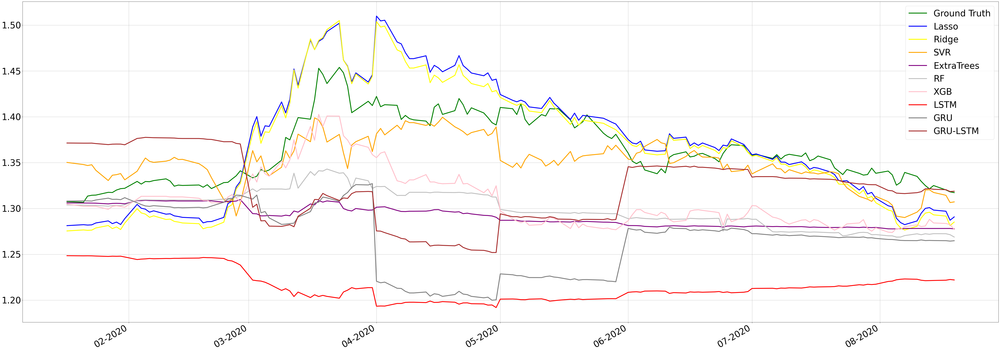

In [ ]:
plot_single_step_forecast('All', 150, save=True)

In [ ]:
plot_single_step_forecast('Ridge', 150)

In [ ]:
plot_single_step_forecast('RF', 150)

In [ ]:
plot_single_step_forecast('ExtraTrees', 150)

In [ ]:
plot_single_step_forecast('SVR', 150)

In [ ]:
plot_single_step_forecast('XGB', 150)

In [ ]:
plot_single_step_forecast('All', 150)

## Multistep

In [ ]:
def get_best_plots(model_name, multistep_val):
  data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_'+str(multistep_val)+'step_results.csv')
  
  errors = {}

  for sample in data['Sample'].unique():
    true = data[data['Sample'] == sample]['Actual']
    preds = data[data['Sample'] == sample]['Predicted']
    errors[sample] = mean_squared_error(true, preds, squared=False)

  return sorted(errors, key=errors.get)[:5]

In [ ]:
plt.rcParams.update({'font.size': 40})

In [ ]:
def plot_multistep_forecast(model_name, sample_num, multistep_val, save=False):

  data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_'+str(multistep_val)+'step_results.csv')
  true = data[data['Sample'] == sample_num]['Actual']
  preds = data[data['Sample'] == sample_num]['Predicted']
  dates = data[data['Sample'] == sample_num]['Date']
  
  # fig = go.Figure()
  # fig.add_trace(go.Scatter(x=dates, y=true, mode='lines', line=dict(color='green'),
  #               name = 'Ground Truth'))
  # fig.add_trace(go.Scatter(x=dates, y=preds, mode='lines', line=dict(color='blue'),
  #               name = model_name))
  # fig.update_xaxes(tickmode = 'array',
  #                tickvals = [str(d) for d in dates],
  #                ticktext= [d.strftime('%Y-%m-%d') for d in dates])
  plt.figure(figsize=(50,12))
  plt.plot(dates, true, color='green', label = 'Ground Truth')
  plt.plot(dates, preds, color='blue', label = model_name)
  plt.legend(loc="upper right")
  if save:
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/"+model_name+'_'+str(multistep_val)+".pdf")
  plt.show()

### DL Models

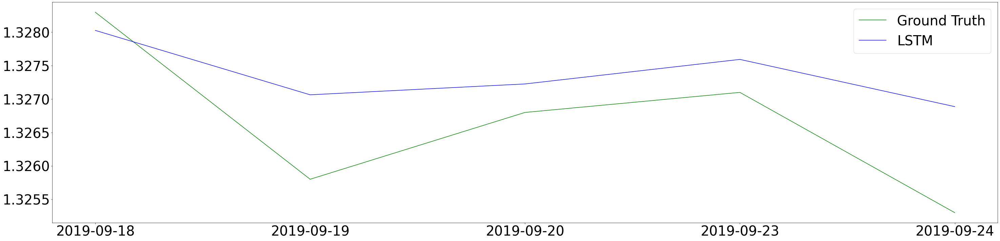

In [ ]:
plot_multistep_forecast('LSTM', 336, 5, save=True)

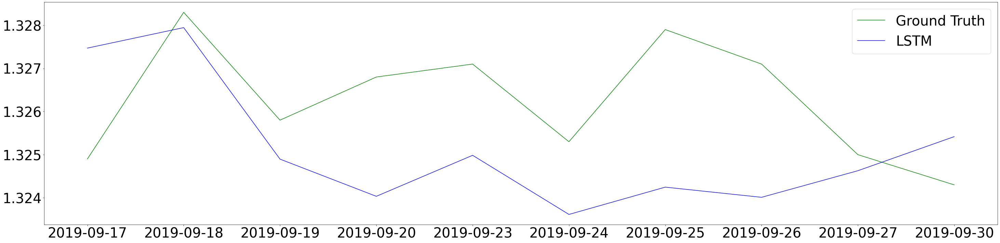

In [ ]:
plot_multistep_forecast('LSTM', 337, 10, save=True)

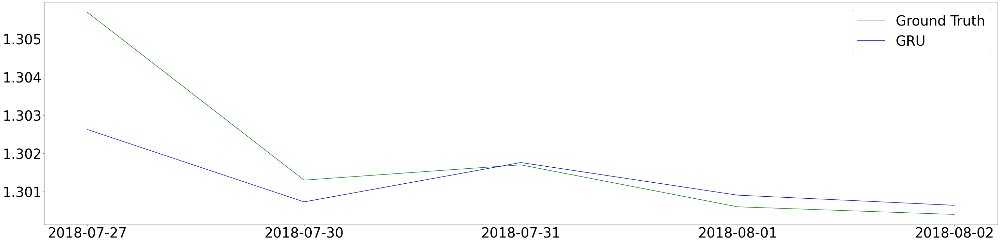

In [ ]:
plot_multistep_forecast('GRU', 53, 5, save=True)

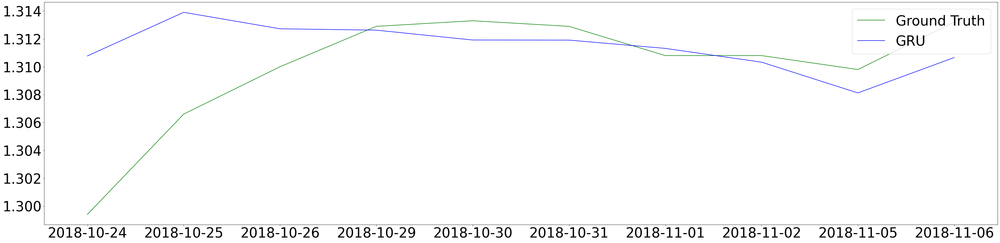

In [ ]:
plot_multistep_forecast('GRU', 116, 10, save=True)

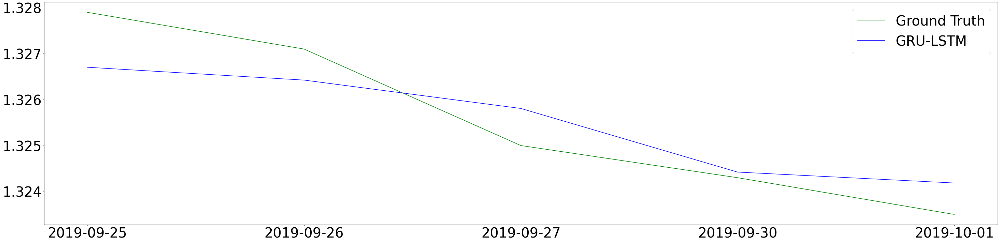

In [ ]:
plot_multistep_forecast('GRU-LSTM', 341, 5, save=True)

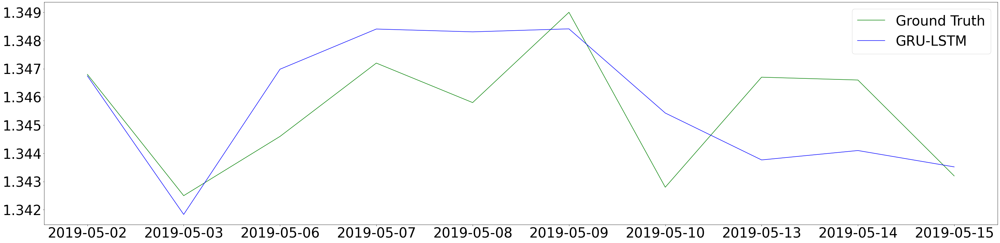

In [ ]:
plot_multistep_forecast('GRU-LSTM', 242, 10, save=True)

### Traditional Models

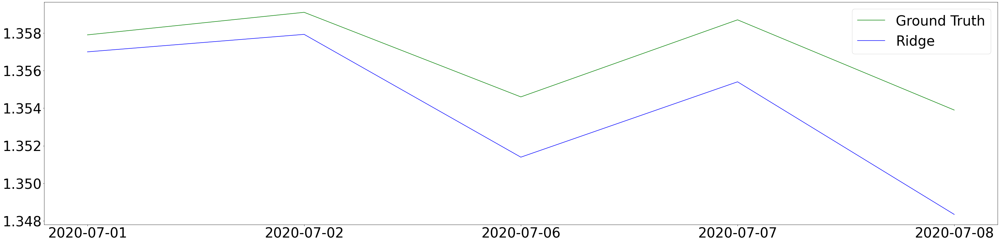

In [ ]:
plot_multistep_forecast('Ridge', 24, 5, save=True)

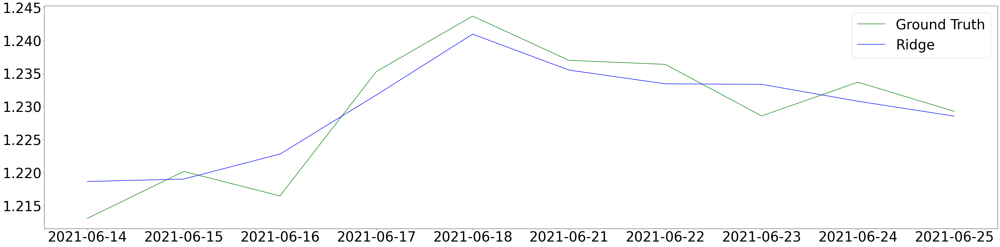

In [ ]:
plot_multistep_forecast('Ridge', 36, 10, save=True)

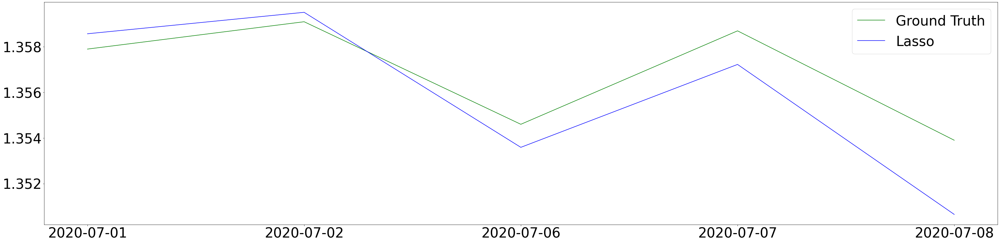

In [ ]:
plot_multistep_forecast('Lasso', 24, 5, save=True)

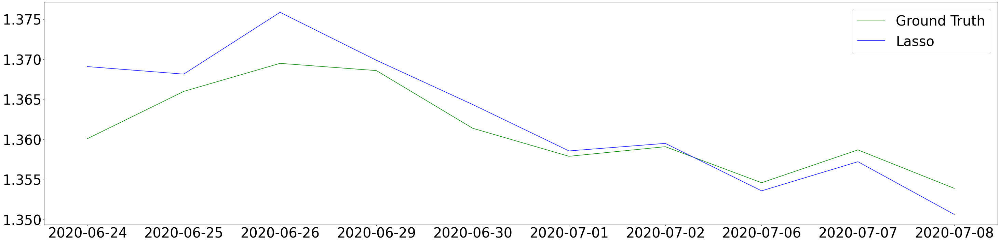

In [ ]:
plot_multistep_forecast('Lasso', 12, 10, save=True)

# Impact of Lag

In [ ]:
df_lag = df.copy()

In [ ]:
lag = 5

for l in range(1,lag+1):
  df_lag['lag_'+str(l)] = df_lag['DEXCAUS'].shift(l)

In [ ]:
df_lag.dropna(inplace=True)

In [ ]:
df_lag.reset_index(drop=True,inplace=True)
df_lag.shape

(3248, 24)

In [ ]:
df_lag.head()

,DATE,DEXCAUS,SP500,TSX,Gold,ED,month,year,day,year_month,...,M3,Oil,Unemployment,IndProd,PPP,lag_1,lag_2,lag_3,lag_4,lag_5
0,2009-01-09,1.1920,890.35,9085.200195,854.00,1.26,1,2009,9,20091,...,66.68929,41.74,7.4,91.45509,1.202244,1.1890,1.1850,1.1822,1.1920,1.2101
1,2009-01-12,1.2075,870.26,8793.299805,848.50,1.16,1,2009,12,20091,...,66.68929,41.74,7.4,91.45509,1.202244,1.1920,1.1890,1.1850,1.1822,1.1920
2,2009-01-13,1.2255,871.79,8961.599609,815.50,1.09,1,2009,13,20091,...,66.68929,41.74,7.4,91.45509,1.202244,1.2075,1.1920,1.1890,1.1850,1.1822
3,2009-01-14,1.2373,842.62,8688.400391,827.25,1.08,1,2009,14,20091,...,66.68929,41.74,7.4,91.45509,1.202244,1.2255,1.2075,1.1920,1.1890,1.1850
4,2009-01-15,1.2623,843.74,8879.599609,813.00,1.09,1,2009,15,20091,...,66.68929,41.74,7.4,91.45509,1.202244,1.2373,1.2255,1.2075,1.1920,1.1890


In [ ]:
list(df_lag.columns[-lag:])

['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5']

In [ ]:
lag_columns = columns + list(df_lag.columns[-lag:])
lag_columns

['SP500',
 'TSX',
 'Gold',
 'ED',
 'BCPI',
 'IR',
 'PPI',
 'M1',
 'M3',
 'Oil',
 'Unemployment',
 'IndProd',
 'PPP',
 'lag_1',
 'lag_2',
 'lag_3',
 'lag_4',
 'lag_5']

In [ ]:
X_lag = df_lag.loc[:, lag_columns]
y_lag = df_lag.iloc[:, 1]
X_lag.shape, y_lag.shape

((3248, 18), (3248,))

In [ ]:
df_lag_time = df_lag['DATE']
df_lag_vars = df_lag[lag_columns]
df_lag_vars.shape

(3248, 18)

In [ ]:
df_lag_target = df_lag['DEXCAUS']

In [ ]:
data_split = 0.85

In [ ]:
data_series_lag = df_lag["DEXCAUS"].copy()
n_train_lag = int(len(df_lag.DEXCAUS) * data_split)
n_test_lag = (len(df_lag) - n_train_lag)
n_train_lag, n_test_lag

(2760, 488)

In [ ]:
# creating target and features for training set
X_train_lag = np.array(df_lag_vars[:-n_test_lag])
y_train_lag = np.array(df_lag_target[:-n_test_lag])
train_dates_lag = df_lag_time[:-n_test_lag]

# creating target and features for test set
X_test_lag = np.array(df_lag_vars[-n_test_lag:])
y_test_lag = np.array(df_lag_target[-n_test_lag:])
test_dates_lag = df_lag_time[-n_test_lag:]

print(X_train_lag.shape, y_train_lag.shape, X_test_lag.shape, y_test_lag.shape)

(2760, 18) (2760,) (488, 18) (488,)


## LSTM

### 1 Step

In [ ]:
X_scaler_lag = MinMaxScaler()
Y_scaler_lag = MinMaxScaler()
X_data_lag = X_scaler_lag.fit_transform(X_lag)
Y_data_lag = Y_scaler_lag.fit_transform(y_lag.to_numpy().reshape(-1,1))

In [ ]:
X_train_LSTM_lag = X_data_lag[:-n_test_lag]
y_train_LSTM_lag = Y_data_lag[:-n_test_lag]

# creating target and features for test set
X_test_LSTM_lag = X_data_lag[-n_test_lag:]
y_test_LSTM_lag = Y_data_lag[-n_test_lag:]

In [ ]:
X_train_LSTM_lag = X_train_LSTM_lag.reshape(X_train_LSTM_lag.shape[0], X_train_LSTM_lag.shape[1], 1)
X_train_LSTM_lag.shape

(2760, 18, 1)

In [ ]:
X_test_LSTM_lag = X_test_LSTM_lag.reshape(X_test_LSTM_lag.shape[0], X_test_LSTM_lag.shape[1], 1)
X_test_LSTM_lag.shape

(488, 18, 1)

In [ ]:
batch_size = 256
buffer_size = 150
train_data_lag = tf.data.Dataset.from_tensor_slices((X_train_LSTM_lag, y_train_LSTM_lag))
train_data_lag = train_data_lag.cache().shuffle(buffer_size).batch(batch_size).repeat()
val_data_lag = tf.data.Dataset.from_tensor_slices((X_test_LSTM_lag, y_test_LSTM_lag))
val_data_lag = val_data_lag.batch(batch_size).repeat() 

In [ ]:
model = Sequential()
model.add(LSTM(500, activation='relu', return_sequences=True, input_shape=(X_train_LSTM_lag.shape[1],X_train_LSTM_lag.shape[2])))
model.add(LSTM(250, activation='relu', return_sequences=True))
model.add(LSTM(125, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 18, 500)           1004000   
                                                                 
 lstm_1 (LSTM)               (None, 18, 250)           751000    
                                                                 
 lstm_2 (LSTM)               (None, 125)               188000    
                                                                 
 dense (Dense)               (None, 1)                 126       
                                                                 
Total params: 1,943,126
Trainable params: 1,943,126
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_Multivariate_With_Lag.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data_lag,epochs=100,steps_per_epoch=100,validation_data=val_data_lag,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 29s 237ms/step - loss: 0.0897 - val_loss: 0.0345
Epoch 2/100
100/100 [==============================] - 24s 236ms/step - loss: 0.0625 - val_loss: 0.0192
Epoch 3/100
100/100 [==============================] - 20s 197ms/step - loss: 0.0319 - val_loss: 0.0898
Epoch 4/100
100/100 [==============================] - 12s 115ms/step - loss: 0.0076 - val_loss: 0.0027
Epoch 5/100
100/100 [==============================] - 12s 115ms/step - loss: 0.0025 - val_loss: 0.0016
Epoch 6/100
100/100 [==============================] - 15s 148ms/step - loss: 0.0016 - val_loss: 0.0039
Epoch 7/100
100/100 [==============================] - 24s 242ms/step - loss: 0.0021 - val_loss: 0.0054
Epoch 8/100
100/100 [==============================] - 12s 117ms/step - loss: 0.0030 - val_loss: 0.0011
Epoch 9/100
100/100 [==============================] - 12s 115ms/step - loss: 6.1753e-04 - val_loss: 0.0011
Epoch 10/100
100/100 [==============================] - 12s 

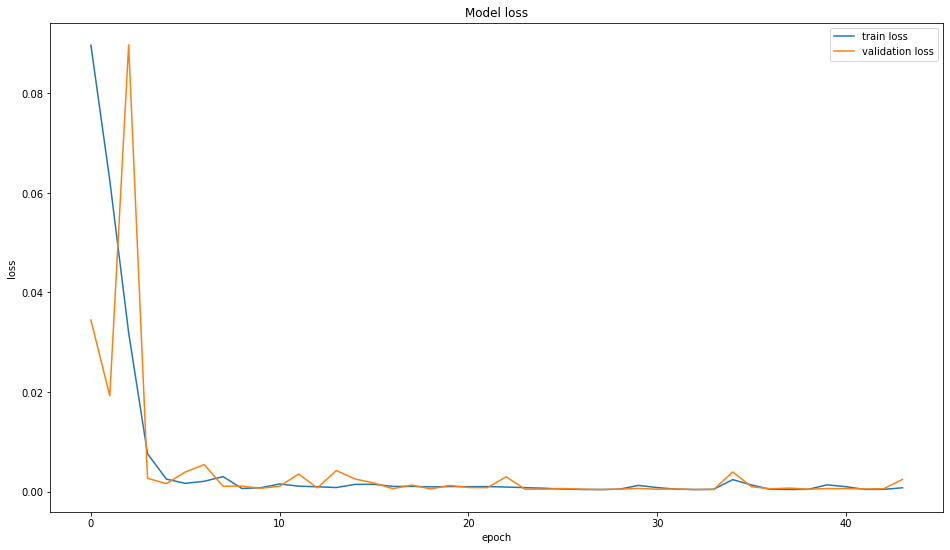

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM_lag, y_test_LSTM_lag)

16/16 [==============================] - 1s 12ms/step - loss: 0.0024


0.0024450449272990227

In [ ]:
y_pred_LSTM_lag = model.predict(X_test_LSTM_lag)
pred_Inverse_LSTM_lag = Y_scaler_lag.inverse_transform(np.reshape(y_pred_LSTM_lag, (y_pred_LSTM_lag.shape[0], y_pred_LSTM_lag.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates_lag, y=y_test_lag, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates_lag, y=pred_Inverse_LSTM_lag.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### 1 Step - Just Lag Values



In [ ]:
X_lag =  df_lag.loc[:, list(df_lag.columns[-lag:])]
X_lag.shape

(3248, 5)

In [ ]:
X_scaler_lag = MinMaxScaler()
Y_scaler_lag = MinMaxScaler()
X_data_lag = X_scaler_lag.fit_transform(X_lag)
Y_data_lag = Y_scaler_lag.fit_transform(y_lag.to_numpy().reshape(-1,1))

In [ ]:
X_train_LSTM_lag = X_data_lag[:-n_test_lag]
y_train_LSTM_lag = Y_data_lag[:-n_test_lag]

# creating target and features for test set
X_test_LSTM_lag = X_data_lag[-n_test_lag:]
y_test_LSTM_lag = Y_data_lag[-n_test_lag:]

In [ ]:
X_train_LSTM_lag = X_train_LSTM_lag.reshape(X_train_LSTM_lag.shape[0], X_train_LSTM_lag.shape[1], 1)
X_train_LSTM_lag.shape

(2760, 5, 1)

In [ ]:
X_test_LSTM_lag = X_test_LSTM_lag.reshape(X_test_LSTM_lag.shape[0], X_test_LSTM_lag.shape[1], 1)
X_test_LSTM_lag.shape

(488, 5, 1)

In [ ]:
batch_size = 256
buffer_size = 150
train_data_lag = tf.data.Dataset.from_tensor_slices((X_train_LSTM_lag, y_train_LSTM_lag))
train_data_lag = train_data_lag.cache().shuffle(buffer_size).batch(batch_size).repeat()
val_data_lag = tf.data.Dataset.from_tensor_slices((X_test_LSTM_lag, y_test_LSTM_lag))
val_data_lag = val_data_lag.batch(batch_size).repeat() 

In [ ]:
model = Sequential()
model.add(LSTM(500, activation='relu', return_sequences=True, input_shape=(X_train_LSTM_lag.shape[1],X_train_LSTM_lag.shape[2])))
model.add(LSTM(250, activation='relu', return_sequences=True))
model.add(LSTM(125, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 5, 500)            1004000   
                                                                 
 lstm_1 (LSTM)               (None, 5, 250)            751000    
                                                                 
 lstm_2 (LSTM)               (None, 125)               188000    
                                                                 
 dense (Dense)               (None, 1)                 126       
                                                                 
Total params: 1,943,126
Trainable params: 1,943,126
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_Multivariate_With_Lag_Only.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data_lag,epochs=100,steps_per_epoch=100,validation_data=val_data_lag,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 13s 47ms/step - loss: 0.0239 - val_loss: 4.0190e-04
Epoch 2/100
100/100 [==============================] - 4s 41ms/step - loss: 4.8622e-04 - val_loss: 0.0016
Epoch 3/100
100/100 [==============================] - 6s 59ms/step - loss: 0.0015 - val_loss: 3.3322e-04
Epoch 4/100
100/100 [==============================] - 4s 41ms/step - loss: 9.2455e-04 - val_loss: 0.0021
Epoch 5/100
100/100 [==============================] - 4s 40ms/step - loss: 7.0218e-04 - val_loss: 0.0064
Epoch 6/100
100/100 [==============================] - 4s 41ms/step - loss: 0.0012 - val_loss: 6.7774e-04
Epoch 7/100
100/100 [==============================] - 4s 40ms/step - loss: 0.0011 - val_loss: 6.9940e-04
Epoch 8/100
100/100 [==============================] - 4s 40ms/step - loss: 0.0011 - val_loss: 3.6754e-04
Epoch 9/100
100/100 [==============================] - 4s 41ms/step - loss: 8.7239e-04 - val_loss: 0.0015
Epoch 10/100
100/100 [=======================

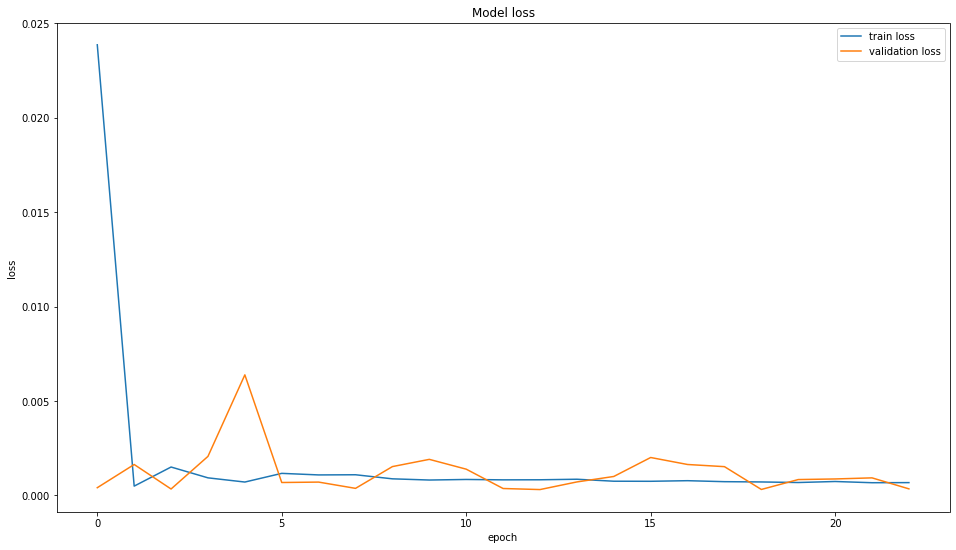

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM_lag, y_test_LSTM_lag)

16/16 [==============================] - 1s 6ms/step - loss: 3.4083e-04


0.00034082873025909066

In [ ]:
y_pred_LSTM_lag = model.predict(X_test_LSTM_lag)
pred_Inverse_LSTM_lag = Y_scaler_lag.inverse_transform(np.reshape(y_pred_LSTM_lag, (y_pred_LSTM_lag.shape[0], y_pred_LSTM_lag.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates_lag, y=y_test_lag, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates_lag, y=pred_Inverse_LSTM_lag.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### Multistep

In [ ]:
target_var = 'DEXCAUS'

In [ ]:
# split a multivariate sequence into samples
def split_sequences_lag(sequences, date_list, n_steps_in, n_steps_out):
 X, y, dates = list(), list(), list()
 for i in range(len(sequences)):
  # find the end of this pattern
  end_ix = i + n_steps_in
  out_end_ix = end_ix + n_steps_out-1
  # check if we are beyond the dataset
  if out_end_ix > len(sequences):
   break
  # gather input and output parts of the pattern
  seq_x, seq_y, seq_d = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1], date_list[end_ix-1:out_end_ix]
  X.append(seq_x)
  y.append(seq_y)
  dates.append(seq_d)
 return np.array(X), np.array(y), np.array(dates)

In [ ]:
def prep_data_lag(model, X_test, y_test, pos, sc):
  test_X_new = X_test[pos]
  test_X_new = test_X_new.reshape(1,n_past,n_features)
  # print(test_X_new.shape)

  y_pred = model.predict(test_X_new)
  y_pred_inv = sc.inverse_transform(y_pred)
  # print(y_pred.shape, y_pred_inv.shape)
  
  return y_pred_inv

#### 5 Step

In [ ]:
df_lag_5step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_5step.columns:
  df_lag_5step[col] = scaler.fit_transform(df_lag_5step[col].values.reshape(-1,1))

df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_5step = df_lag['DATE']
dates_5step.shape

(3248,)

In [ ]:
n_past = 15
n_future = 5 
n_features = 5

X_5step, y_5step, dates_5step = split_sequences_lag(np.array(df_lag_5step), dates_5step, n_past, n_future)
X_5step.shape, y_5step.shape

((3230, 15, 5), (3230, 5))

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
test_dates_5step = dates_5step[split_point:]
test_dates_5step.shape

(485, 5)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2745, 15, 5), (2745, 5), (485, 15, 5), (485, 5))

In [ ]:
model = Sequential()
model.add(LSTM(500, activation='relu', return_sequences=True, input_shape=(n_past,n_features)))
model.add(LSTM(250, activation='relu', return_sequences=True))
model.add(LSTM(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 15, 500)           1012000   
                                                                 
 lstm_1 (LSTM)               (None, 15, 250)           751000    
                                                                 
 lstm_2 (LSTM)               (None, 125)               188000    
                                                                 
 dense (Dense)               (None, 5)                 630       
                                                                 
Total params: 1,951,630
Trainable params: 1,951,630
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_Multivariate_With_Lag_5step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 0.1117WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


11/11 [==============================] - 9s 298ms/step - loss: 0.1117 - val_loss: 0.0933
Epoch 2/100
11/11 [==============================] - 3s 269ms/step - loss: 0.0302
Epoch 3/100
11/11 [==============================] - 2s 186ms/step - loss: 0.0071
Epoch 4/100
11/11 [==============================] - 2s 216ms/step - loss: 0.0027
Epoch 5/100
11/11 [==============================] - 2s 186ms/step - loss: 0.0018
Epoch 6/100
11/11 [==============================] - 3s 241ms/step - loss: 0.0016
Epoch 7/100
11/11 [==============================] - 3s 293ms/step - loss: 0.0015
Epoch 8/100
11/11 [==============================] - 3s 277ms/step - loss: 0.0015
Epoch 9/100
11/11 [==============================] - 3s 247ms/step - loss: 0.0015
Epoch 10/100
11/11 [==============================] - 3s 287ms/step - loss: 0.0014
Epoch 11/100
11/11 [==============================] - 2s 229ms/step - loss: 0.0014
Epoch 12/100
11/11 [==============================] - 2s 225ms/step - loss: 0.0014
Epoch 

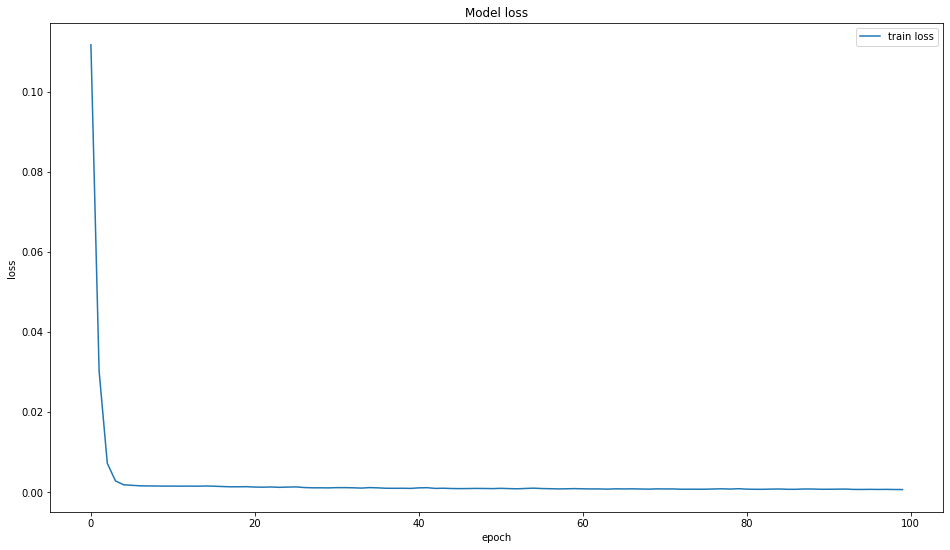

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lag_preds_5step = []
lag_actual_5step = []
for i in range(len(test_X)):
  lag_preds_5step.append(prep_data_lag(model, test_X, test_y, i, scaler))
  lag_actual_5step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lag_preds_5step), len(lag_actual_5step)

(485, 485)

In [ ]:
Mape_5step = []
Mae_5step= []
Rmse_5step = []
Nrmse_5step = []

for pred,actual in zip(lag_preds_5step, lag_actual_5step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_5step.append(mape)
  Mae_5step.append(mae)
  Rmse_5step.append(rmse)
  Nrmse_5step.append(nrmse)

In [ ]:
return_metrics(Mape_5step, Mae_5step, Rmse_5step, Nrmse_5step)

('0.008 +- 0.006', '0.011 +- 0.008', '0.011 +- 0.008', '0.008 +- 0.006')

#### 10 Step

In [ ]:
df_lag_10step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_10step.columns:
  df_lag_10step[col] = scaler.fit_transform(df_lag_10step[col].values.reshape(-1,1))

df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_10step = df_lag['DATE']
dates_10step.shape

(3248,)

In [ ]:
n_past = 30
n_future = 10 
n_features = 5

X_10step, y_10step, dates_10step = split_sequences_lag(np.array(df_lag_10step), dates_10step, n_past, n_future)
X_10step.shape, y_10step.shape

((3210, 30, 5), (3210, 10))

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
test_dates_10step = dates_10step[split_point:]
test_dates_10step.shape

(482, 10)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2728, 30, 5), (2728, 10), (482, 30, 5), (482, 10))

In [ ]:
model = Sequential()
model.add(LSTM(500, activation='relu', return_sequences=True, input_shape=(n_past,n_features)))
model.add(LSTM(250, activation='relu', return_sequences=True))
model.add(LSTM(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 30, 500)           1012000   
                                                                 
 lstm_4 (LSTM)               (None, 30, 250)           751000    
                                                                 
 lstm_5 (LSTM)               (None, 125)               188000    
                                                                 
 dense_1 (Dense)             (None, 10)                1260      
                                                                 
Total params: 1,952,260
Trainable params: 1,952,260
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_Multivariate_With_Lag_10step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 0.1449WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


11/11 [==============================] - 6s 241ms/step - loss: 0.1449 - val_loss: 0.2253
Epoch 2/100
11/11 [==============================] - 3s 327ms/step - loss: 0.0708
Epoch 3/100
11/11 [==============================] - 5s 451ms/step - loss: 0.0108
Epoch 4/100
11/11 [==============================] - 4s 351ms/step - loss: 0.0044
Epoch 5/100
11/11 [==============================] - 4s 408ms/step - loss: 0.0026
Epoch 6/100
11/11 [==============================] - 4s 365ms/step - loss: 0.0023
Epoch 7/100
11/11 [==============================] - 4s 345ms/step - loss: 0.0022
Epoch 8/100
11/11 [==============================] - 4s 385ms/step - loss: 0.0022
Epoch 9/100
11/11 [==============================] - 4s 369ms/step - loss: 0.0021
Epoch 10/100
11/11 [==============================] - 4s 332ms/step - loss: 0.0021
Epoch 11/100
11/11 [==============================] - 4s 383ms/step - loss: 0.0020
Epoch 12/100
11/11 [==============================] - 4s 331ms/step - loss: 0.0019
Epoch 

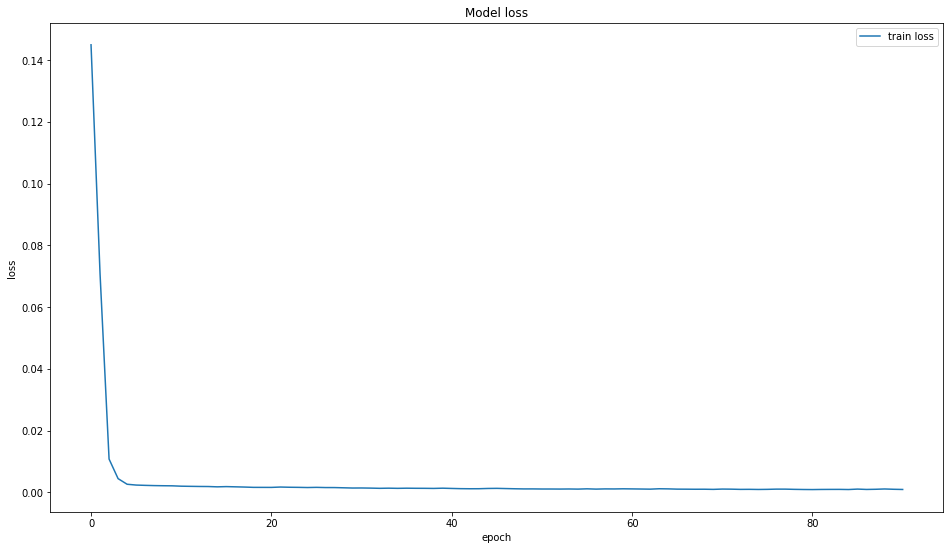

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lag_preds_10step = []
lag_actual_10step = []
for i in range(len(test_X)):
  lag_preds_10step.append(prep_data_lag(model, test_X, test_y, i, scaler))
  lag_actual_10step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lag_preds_10step), len(lag_actual_10step)

(482, 482)

In [ ]:
Mape_10step = []
Mae_10step= []
Rmse_10step = []
Nrmse_10step = []

for pred,actual in zip(lag_preds_10step, lag_actual_10step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_10step.append(mape)
  Mae_10step.append(mae)
  Rmse_10step.append(rmse)
  Nrmse_10step.append(nrmse)

In [ ]:
return_metrics(Mape_10step, Mae_10step, Rmse_10step, Nrmse_10step)

('0.01 +- 0.007', '0.013 +- 0.01', '0.013 +- 0.01', '0.01 +- 0.007')

## GRU

### 1 Step

In [ ]:
model = Sequential()
model.add(GRU(1000, activation='relu', return_sequences=True, input_shape=(X_train_LSTM_lag.shape[1],X_train_LSTM_lag.shape[2])))
model.add(GRU(500, activation='relu', return_sequences=True))
model.add(GRU(250, activation='relu', return_sequences=True))
model.add(GRU(125, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 18, 1000)          3009000   
                                                                 
 gru_1 (GRU)                 (None, 18, 500)           2253000   
                                                                 
 gru_2 (GRU)                 (None, 18, 250)           564000    
                                                                 
 gru_3 (GRU)                 (None, 125)               141375    
                                                                 
 dense_1 (Dense)             (None, 1)                 126       
                                                                 
Total params: 5,967,501
Trainable params: 5,967,501
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'GRU_Multivariate_With_Lag.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data_lag,epochs=100,steps_per_epoch=100,validation_data=val_data_lag,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 30s 258ms/step - loss: 0.0507 - val_loss: 0.0017
Epoch 2/100
100/100 [==============================] - 35s 354ms/step - loss: 0.0020 - val_loss: 9.7126e-04
Epoch 3/100
100/100 [==============================] - 40s 399ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 4/100
100/100 [==============================] - 32s 320ms/step - loss: 7.4028e-04 - val_loss: 0.0039
Epoch 5/100
100/100 [==============================] - 42s 421ms/step - loss: 0.0012 - val_loss: 0.0053
Epoch 6/100
100/100 [==============================] - 28s 275ms/step - loss: 0.0034 - val_loss: 0.0011
Epoch 7/100
100/100 [==============================] - 20s 203ms/step - loss: 6.3701e-04 - val_loss: 6.6882e-04
Epoch 8/100
100/100 [==============================] - 20s 201ms/step - loss: 9.6819e-04 - val_loss: 5.6996e-04
Epoch 9/100
100/100 [==============================] - 20s 203ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 10/100
100/100 [==================

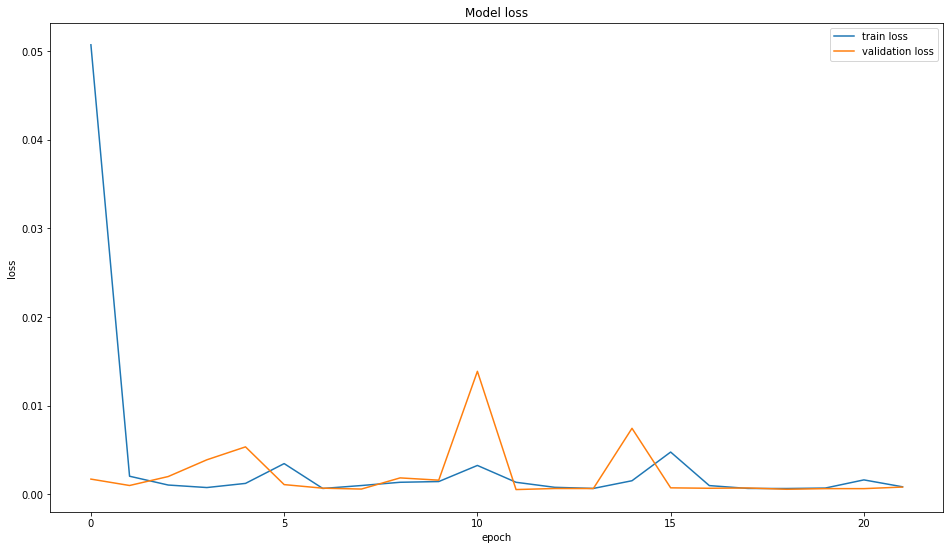

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM_lag, y_test_LSTM_lag)

16/16 [==============================] - 1s 19ms/step - loss: 7.9440e-04


0.0007944031967781484

In [ ]:
y_pred_GRU_lag = model.predict(X_test_LSTM_lag)
pred_Inverse_GRU_lag = Y_scaler_lag.inverse_transform(np.reshape(y_pred_GRU_lag, (y_pred_GRU_lag.shape[0], y_pred_GRU_lag.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates_lag, y=y_test_lag, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates_lag, y=pred_Inverse_GRU_lag.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### 1 Step - Just Lag Values

In [ ]:
X_train_LSTM_lag.shape

(2760, 5, 1)

In [ ]:
model = Sequential()
model.add(GRU(1000, activation='relu', return_sequences=True, input_shape=(X_train_LSTM_lag.shape[1],X_train_LSTM_lag.shape[2])))
model.add(GRU(500, activation='relu', return_sequences=True))
model.add(GRU(250, activation='relu', return_sequences=True))
model.add(GRU(125, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_9 (GRU)                 (None, 5, 1000)           3009000   
                                                                 
 gru_10 (GRU)                (None, 5, 500)            2253000   
                                                                 
 gru_11 (GRU)                (None, 5, 250)            564000    
                                                                 
 gru_12 (GRU)                (None, 125)               141375    
                                                                 
 dense_4 (Dense)             (None, 1)                 126       
                                                                 
Total params: 5,967,501
Trainable params: 5,967,501
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'GRU_Multivariate_With_Lag_Only.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data_lag,epochs=100,steps_per_epoch=100,validation_data=val_data_lag,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 13s 78ms/step - loss: 0.0247 - val_loss: 0.0150
Epoch 2/100
100/100 [==============================] - 7s 70ms/step - loss: 0.0025 - val_loss: 7.8230e-04
Epoch 3/100
100/100 [==============================] - 7s 70ms/step - loss: 7.0837e-04 - val_loss: 4.7020e-04
Epoch 4/100
100/100 [==============================] - 7s 68ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 5/100
100/100 [==============================] - 8s 83ms/step - loss: 0.0017 - val_loss: 8.3632e-04
Epoch 6/100
100/100 [==============================] - 8s 77ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 7/100
100/100 [==============================] - 7s 67ms/step - loss: 0.0017 - val_loss: 7.1896e-04
Epoch 8/100
100/100 [==============================] - 7s 68ms/step - loss: 0.0017 - val_loss: 8.1557e-04
Epoch 9/100
100/100 [==============================] - 7s 68ms/step - loss: 0.0017 - val_loss: 9.4240e-04
Epoch 10/100
100/100 [==============================]

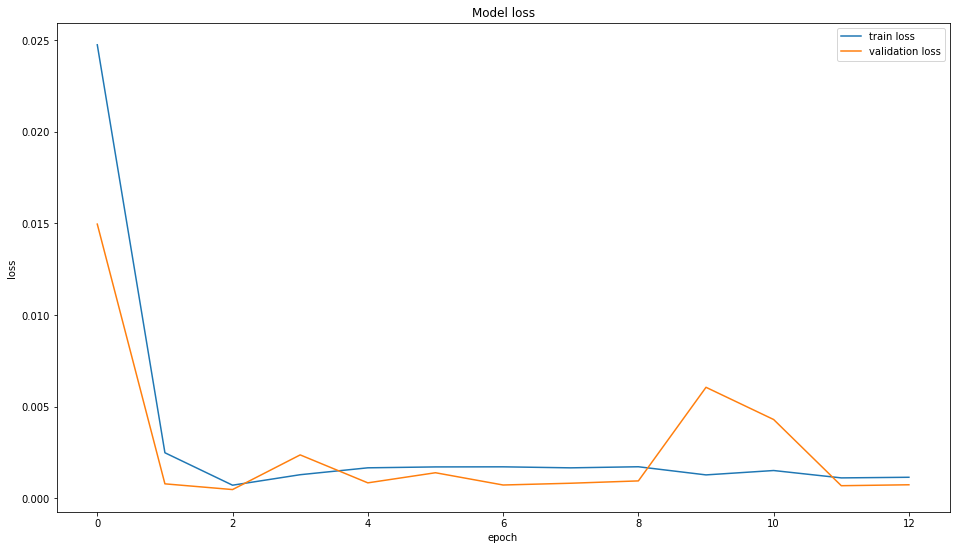

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM_lag, y_test_LSTM_lag)

16/16 [==============================] - 1s 8ms/step - loss: 7.3137e-04


0.000731371867004782

In [ ]:
y_pred_GRU_lag = model.predict(X_test_LSTM_lag)
pred_Inverse_GRU_lag = Y_scaler_lag.inverse_transform(np.reshape(y_pred_GRU_lag, (y_pred_GRU_lag.shape[0], y_pred_GRU_lag.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates_lag, y=y_test_lag, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates_lag, y=pred_Inverse_GRU_lag.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### Multistep

In [ ]:
target_var = 'DEXCAUS'

In [ ]:
# split a multivariate sequence into samples
def split_sequences_lag(sequences, date_list, n_steps_in, n_steps_out):
 X, y, dates = list(), list(), list()
 for i in range(len(sequences)):
  # find the end of this pattern
  end_ix = i + n_steps_in
  out_end_ix = end_ix + n_steps_out-1
  # check if we are beyond the dataset
  if out_end_ix > len(sequences):
   break
  # gather input and output parts of the pattern
  seq_x, seq_y, seq_d = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1], date_list[end_ix-1:out_end_ix]
  X.append(seq_x)
  y.append(seq_y)
  dates.append(seq_d)
 return np.array(X), np.array(y), np.array(dates)

In [ ]:
def prep_data_lag(model, X_test, y_test, pos, sc):
  test_X_new = X_test[pos]
  test_X_new = test_X_new.reshape(1,n_past,n_features)
  # print(test_X_new.shape)

  y_pred = model.predict(test_X_new)
  y_pred_inv = sc.inverse_transform(y_pred)
  # print(y_pred.shape, y_pred_inv.shape)
  
  return y_pred_inv

#### 5 Step

In [ ]:
df_lag_5step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_5step.columns:
  df_lag_5step[col] = scaler.fit_transform(df_lag_5step[col].values.reshape(-1,1))

df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_5step = df_lag['DATE']
dates_5step.shape

(3248,)

In [ ]:
n_past = 15
n_future = 5 
n_features = 5

X_5step, y_5step, dates_5step = split_sequences_lag(np.array(df_lag_5step), dates_5step, n_past, n_future)
X_5step.shape, y_5step.shape

((3230, 15, 5), (3230, 5))

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
test_dates_5step = dates_5step[split_point:]
test_dates_5step.shape

(485, 5)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2745, 15, 5), (2745, 5), (485, 15, 5), (485, 5))

In [ ]:
model = Sequential()
model.add(GRU(1000, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(GRU(500, activation='relu', return_sequences=True))
model.add(GRU(250, activation='relu', return_sequences=True))
model.add(GRU(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 15, 1000)          3021000   
                                                                 
 gru_1 (GRU)                 (None, 15, 500)           2253000   
                                                                 
 gru_2 (GRU)                 (None, 15, 250)           564000    
                                                                 
 gru_3 (GRU)                 (None, 125)               141375    
                                                                 
 dense_2 (Dense)             (None, 5)                 630       
                                                                 
Total params: 5,980,005
Trainable params: 5,980,005
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'GRU_Multivariate_With_Lag_5step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 0.0919WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


11/11 [==============================] - 12s 415ms/step - loss: 0.0919 - val_loss: 0.0212
Epoch 2/100
11/11 [==============================] - 4s 332ms/step - loss: 0.0066
Epoch 3/100
11/11 [==============================] - 2s 181ms/step - loss: 0.0021
Epoch 4/100
11/11 [==============================] - 2s 174ms/step - loss: 0.0013
Epoch 5/100
11/11 [==============================] - 2s 179ms/step - loss: 0.0012
Epoch 6/100
11/11 [==============================] - 2s 181ms/step - loss: 0.0012
Epoch 7/100
11/11 [==============================] - 2s 175ms/step - loss: 0.0011
Epoch 8/100
11/11 [==============================] - 4s 359ms/step - loss: 0.0011
Epoch 9/100
11/11 [==============================] - 4s 330ms/step - loss: 0.0011
Epoch 10/100
11/11 [==============================] - 4s 343ms/step - loss: 0.0011
Epoch 11/100
11/11 [==============================] - 4s 367ms/step - loss: 0.0011
Epoch 12/100
11/11 [==============================] - 4s 379ms/step - loss: 0.0010
Epoch

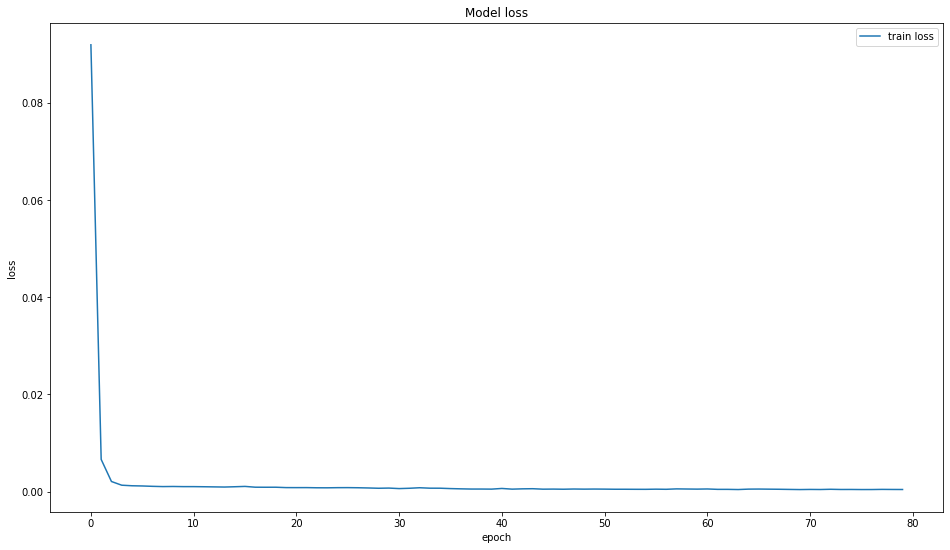

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lag_preds_5step = []
lag_actual_5step = []
for i in range(len(test_X)):
  lag_preds_5step.append(prep_data_lag(model, test_X, test_y, i, scaler))
  lag_actual_5step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lag_preds_5step), len(lag_actual_5step)

(485, 485)

In [ ]:
Mape_5step = []
Mae_5step= []
Rmse_5step = []
Nrmse_5step = []

for pred,actual in zip(lag_preds_5step, lag_actual_5step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_5step.append(mape)
  Mae_5step.append(mae)
  Rmse_5step.append(rmse)
  Nrmse_5step.append(nrmse)

In [ ]:
return_metrics(Mape_5step, Mae_5step, Rmse_5step, Nrmse_5step)

('0.009 +- 0.006', '0.012 +- 0.008', '0.012 +- 0.008', '0.009 +- 0.006')

#### 10 Step

In [ ]:
df_lag_10step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_10step.columns:
  df_lag_10step[col] = scaler.fit_transform(df_lag_10step[col].values.reshape(-1,1))

df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_10step = df_lag['DATE']
dates_10step.shape

(3248,)

In [ ]:
n_past = 30
n_future = 10 
n_features = 5

X_10step, y_10step, dates_10step = split_sequences_lag(np.array(df_lag_10step), dates_10step, n_past, n_future)
X_10step.shape, y_10step.shape

((3210, 30, 5), (3210, 10))

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
test_dates_10step = dates_10step[split_point:]
test_dates_10step.shape

(482, 10)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2728, 30, 5), (2728, 10), (482, 30, 5), (482, 10))

In [ ]:
model = Sequential()
model.add(GRU(1000, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(GRU(500, activation='relu', return_sequences=True))
model.add(GRU(250, activation='relu', return_sequences=True))
model.add(GRU(125, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 30, 1000)          3021000   
                                                                 
 gru_5 (GRU)                 (None, 30, 500)           2253000   
                                                                 
 gru_6 (GRU)                 (None, 30, 250)           564000    
                                                                 
 gru_7 (GRU)                 (None, 125)               141375    
                                                                 
 dense_3 (Dense)             (None, 10)                1260      
                                                                 
Total params: 5,980,635
Trainable params: 5,980,635
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'GRU_Multivariate_With_Lag_10step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 0.1247WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


11/11 [==============================] - 9s 411ms/step - loss: 0.1247 - val_loss: 0.1648
Epoch 2/100
11/11 [==============================] - 4s 325ms/step - loss: 0.0404
Epoch 3/100
11/11 [==============================] - 4s 328ms/step - loss: 0.0076
Epoch 4/100
11/11 [==============================] - 4s 321ms/step - loss: 0.0026
Epoch 5/100
11/11 [==============================] - 4s 397ms/step - loss: 0.0018
Epoch 6/100
11/11 [==============================] - 4s 374ms/step - loss: 0.0015
Epoch 7/100
11/11 [==============================] - 4s 333ms/step - loss: 0.0014
Epoch 8/100
11/11 [==============================] - 4s 329ms/step - loss: 0.0014
Epoch 9/100
11/11 [==============================] - 4s 331ms/step - loss: 0.0013
Epoch 10/100
11/11 [==============================] - 4s 327ms/step - loss: 0.0013
Epoch 11/100
11/11 [==============================] - 4s 328ms/step - loss: 0.0013
Epoch 12/100
11/11 [==============================] - 3s 307ms/step - loss: 0.0013
Epoch 

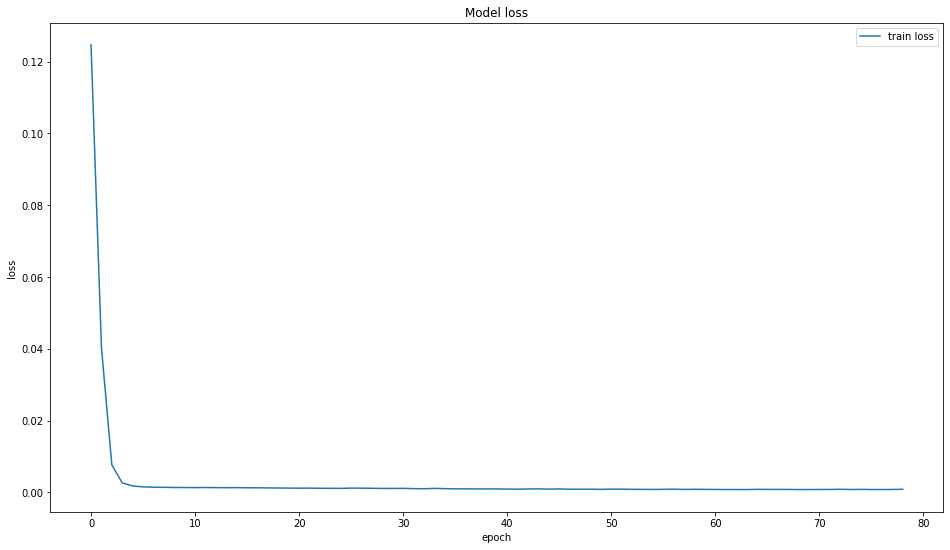

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lag_preds_10step = []
lag_actual_10step = []
for i in range(len(test_X)):
  lag_preds_10step.append(prep_data_lag(model, test_X, test_y, i, scaler))
  lag_actual_10step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lag_preds_10step), len(lag_actual_10step)

(482, 482)

In [ ]:
Mape_10step = []
Mae_10step= []
Rmse_10step = []
Nrmse_10step = []

for pred,actual in zip(lag_preds_10step, lag_actual_10step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_10step.append(mape)
  Mae_10step.append(mae)
  Rmse_10step.append(rmse)
  Nrmse_10step.append(nrmse)

In [ ]:
return_metrics(Mape_10step, Mae_10step, Rmse_10step, Nrmse_10step)

('0.008 +- 0.006', '0.011 +- 0.009', '0.011 +- 0.009', '0.008 +- 0.006')

## GRU-LSTM

### 1 Step

In [ ]:
model = Sequential()
model.add(GRU(512, activation='relu', return_sequences=True, input_shape=(X_train_LSTM_lag.shape[1],X_train_LSTM_lag.shape[2])))
model.add(LSTM(256, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 18, 512)           791040    
                                                                 
 lstm_3 (LSTM)               (None, 256)               787456    
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 1,578,753
Trainable params: 1,578,753
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_GRU_Multivariate_With_Lag.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data_lag,epochs=100,steps_per_epoch=100,validation_data=val_data_lag,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 12s 92ms/step - loss: 0.0272 - val_loss: 8.7565e-04
Epoch 2/100
100/100 [==============================] - 9s 87ms/step - loss: 0.0011 - val_loss: 5.4300e-04
Epoch 3/100
100/100 [==============================] - 9s 87ms/step - loss: 7.6062e-04 - val_loss: 0.0013
Epoch 4/100
100/100 [==============================] - 9s 87ms/step - loss: 5.4538e-04 - val_loss: 4.9054e-04
Epoch 5/100
100/100 [==============================] - 9s 86ms/step - loss: 5.2699e-04 - val_loss: 0.0014
Epoch 6/100
100/100 [==============================] - 9s 86ms/step - loss: 0.0011 - val_loss: 0.0027
Epoch 7/100
100/100 [==============================] - 9s 87ms/step - loss: 5.3739e-04 - val_loss: 4.6775e-04
Epoch 8/100
100/100 [==============================] - 9s 88ms/step - loss: 5.8303e-04 - val_loss: 4.6368e-04
Epoch 9/100
100/100 [==============================] - 9s 87ms/step - loss: 0.0020 - val_loss: 5.1782e-04
Epoch 10/100
100/100 [===============

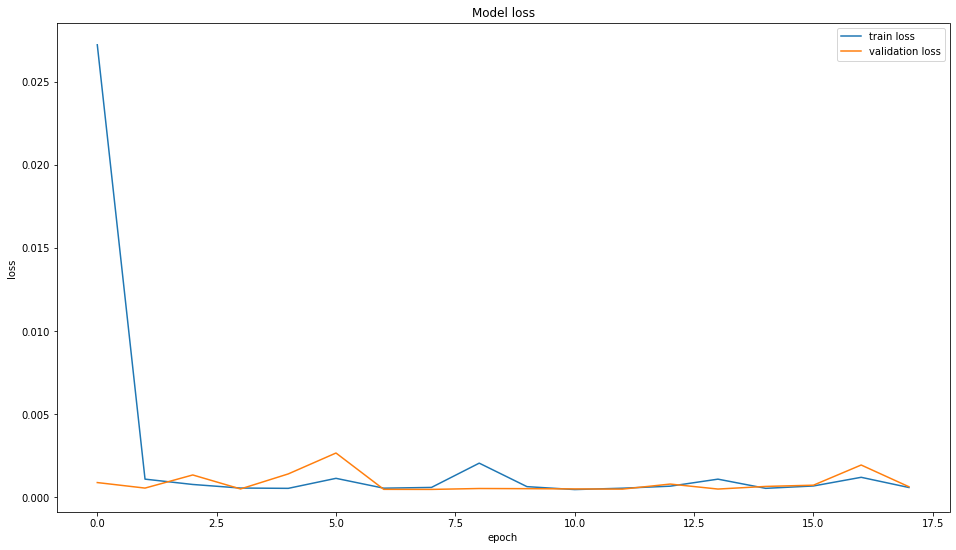

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM_lag, y_test_LSTM_lag)

16/16 [==============================] - 0s 9ms/step - loss: 6.2372e-04


0.0006237238994799554

In [ ]:
y_pred_LSTM_GRU_lag = model.predict(X_test_LSTM_lag)
pred_Inverse_LSTM_GRU_lag = Y_scaler_lag.inverse_transform(np.reshape(y_pred_LSTM_GRU_lag, (y_pred_LSTM_GRU_lag.shape[0], y_pred_LSTM_GRU_lag.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates_lag, y=y_test_lag, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates_lag, y=pred_Inverse_LSTM_GRU_lag.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### 1 Step - Just Lag Values

In [ ]:
X_train_LSTM_lag.shape

(2760, 5, 1)

In [ ]:
model = Sequential()
model.add(GRU(512, activation='relu', return_sequences=True, input_shape=(X_train_LSTM_lag.shape[1],X_train_LSTM_lag.shape[2])))
model.add(LSTM(256, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 5, 512)            791040    
                                                                 
 lstm_3 (LSTM)               (None, 256)               787456    
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 1,578,753
Trainable params: 1,578,753
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_GRU_Multivariate_With_Lag_Only.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_data_lag,epochs=100,steps_per_epoch=100,validation_data=val_data_lag,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/100
100/100 [==============================] - 6s 37ms/step - loss: 0.0104 - val_loss: 3.0037e-04
Epoch 2/100
100/100 [==============================] - 4s 40ms/step - loss: 6.8986e-04 - val_loss: 4.9211e-04
Epoch 3/100
100/100 [==============================] - 3s 33ms/step - loss: 7.1391e-04 - val_loss: 0.0012
Epoch 4/100
100/100 [==============================] - 3s 33ms/step - loss: 0.0013 - val_loss: 8.4353e-04
Epoch 5/100
100/100 [==============================] - 4s 42ms/step - loss: 0.0011 - val_loss: 8.9065e-04
Epoch 6/100
100/100 [==============================] - 4s 40ms/step - loss: 8.7643e-04 - val_loss: 0.0054
Epoch 7/100
100/100 [==============================] - 3s 32ms/step - loss: 9.4369e-04 - val_loss: 0.0021
Epoch 8/100
100/100 [==============================] - 3s 32ms/step - loss: 7.9758e-04 - val_loss: 3.2719e-04
Epoch 9/100
100/100 [==============================] - 3s 31ms/step - loss: 8.2528e-04 - val_loss: 6.4837e-04
Epoch 10/100
100/100 [============

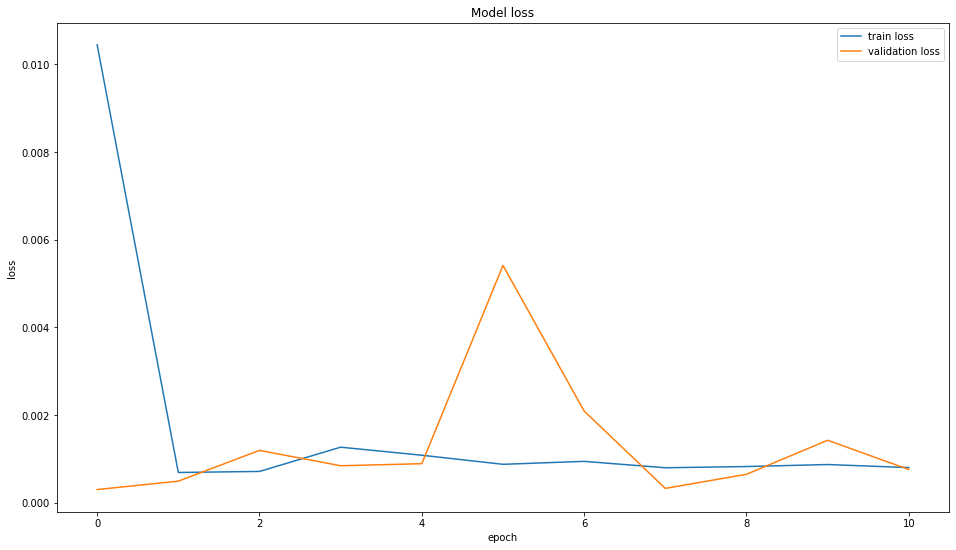

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show() 

In [ ]:
model.evaluate(X_test_LSTM_lag, y_test_LSTM_lag)

16/16 [==============================] - 0s 5ms/step - loss: 7.5836e-04


0.0007583571714349091

In [ ]:
y_pred_LSTM_GRU_lag = model.predict(X_test_LSTM_lag)
pred_Inverse_LSTM_GRU_lag = Y_scaler_lag.inverse_transform(np.reshape(y_pred_LSTM_GRU_lag, (y_pred_LSTM_GRU_lag.shape[0], y_pred_LSTM_GRU_lag.shape[1])))

In [ ]:
# plot of predictions and actual values
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_dates_lag, y=y_test_lag, line_shape='linear', 
              name = 'Ground Truth'))
fig.add_trace(go.Scatter(x=test_dates_lag, y=pred_Inverse_LSTM_GRU_lag.flatten(), line_shape='linear', 
              name = 'Prediction'))
fig.show()    

### Multistep

In [ ]:
target_var = 'DEXCAUS'

In [ ]:
# split a multivariate sequence into samples
def split_sequences_lag(sequences, date_list, n_steps_in, n_steps_out):
 X, y, dates = list(), list(), list()
 for i in range(len(sequences)):
  # find the end of this pattern
  end_ix = i + n_steps_in
  out_end_ix = end_ix + n_steps_out-1
  # check if we are beyond the dataset
  if out_end_ix > len(sequences):
   break
  # gather input and output parts of the pattern
  seq_x, seq_y, seq_d = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1], date_list[end_ix-1:out_end_ix]
  X.append(seq_x)
  y.append(seq_y)
  dates.append(seq_d)
 return np.array(X), np.array(y), np.array(dates)

In [ ]:
def prep_data_lag(model, X_test, y_test, pos, sc):
  test_X_new = X_test[pos]
  test_X_new = test_X_new.reshape(1,n_past,n_features)
  # print(test_X_new.shape)

  y_pred = model.predict(test_X_new)
  y_pred_inv = sc.inverse_transform(y_pred)
  # print(y_pred.shape, y_pred_inv.shape)
  
  return y_pred_inv

#### 5 Step

In [ ]:
df_lag_5step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_5step.columns:
  df_lag_5step[col] = scaler.fit_transform(df_lag_5step[col].values.reshape(-1,1))

df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_5step = df_lag['DATE']
dates_5step.shape

(3248,)

In [ ]:
n_past = 15
n_future = 5 
n_features = 5

X_5step, y_5step, dates_5step = split_sequences_lag(np.array(df_lag_5step), dates_5step, n_past, n_future)
X_5step.shape, y_5step.shape

((3230, 15, 5), (3230, 5))

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
test_dates_5step = dates_5step[split_point:]
test_dates_5step.shape

(485, 5)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2745, 15, 5), (2745, 5), (485, 15, 5), (485, 5))

In [ ]:
model = Sequential()
model.add(GRU(512, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(LSTM(256, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_8 (GRU)                 (None, 15, 512)           797184    
                                                                 
 lstm_6 (LSTM)               (None, 256)               787456    
                                                                 
 dense_4 (Dense)             (None, 5)                 1285      
                                                                 
Total params: 1,585,925
Trainable params: 1,585,925
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_GRU_Multivariate_With_Lag_5step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 0.0759WARNING:tensorflow:5 out of the last 9 calls to <function Model.make_test_function.<locals>.test_function at 0x7fe0c7d37c20> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


11/11 [==============================] - 4s 128ms/step - loss: 0.0759 - val_loss: 0.0433
Epoch 2/100
11/11 [==============================] - 1s 81ms/step - loss: 0.0097
Epoch 3/100
11/11 [==============================] - 1s 79ms/step - loss: 0.0025
Epoch 4/100
11/11 [==============================] - 1s 82ms/step - loss: 0.0013
Epoch 5/100
11/11 [==============================] - 1s 79ms/step - loss: 0.0011
Epoch 6/100
11/11 [==============================] - 1s 79ms/step - loss: 0.0011
Epoch 7/100
11/11 [==============================] - 1s 78ms/step - loss: 0.0011
Epoch 8/100
11/11 [==============================] - 1s 79ms/step - loss: 0.0010
Epoch 9/100
11/11 [==============================] - 1s 77ms/step - loss: 0.0010
Epoch 10/100
11/11 [==============================] - 1s 79ms/step - loss: 0.0010
Epoch 11/100
11/11 [==============================] - 1s 79ms/step - loss: 0.0010
Epoch 12/100
11/11 [==============================] - 1s 78ms/step - loss: 0.0010
Epoch 13/100
11/1

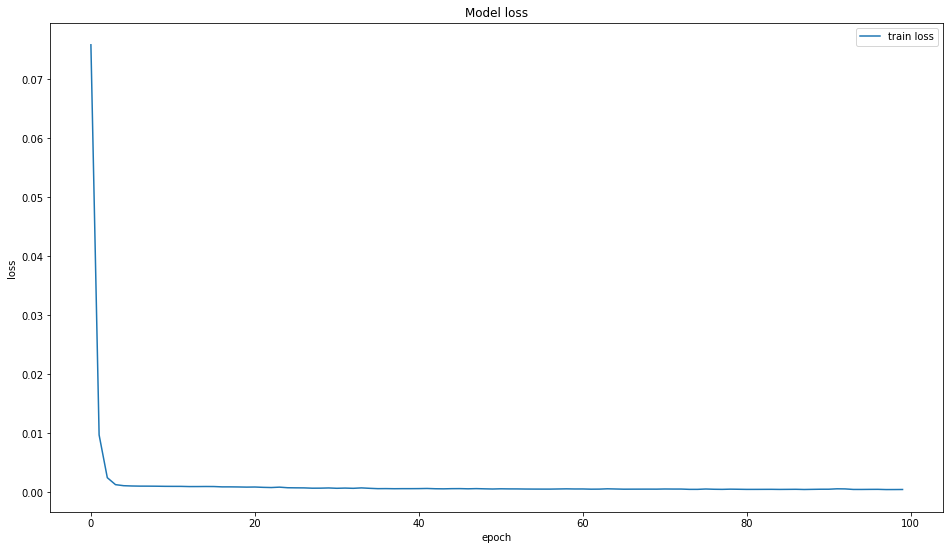

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lag_preds_5step = []
lag_actual_5step = []
for i in range(len(test_X)):
  lag_preds_5step.append(prep_data_lag(model, test_X, test_y, i, scaler))
  lag_actual_5step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lag_preds_5step), len(lag_actual_5step)

(485, 485)

In [ ]:
Mape_5step = []
Mae_5step= []
Rmse_5step = []
Nrmse_5step = []

for pred,actual in zip(lag_preds_5step, lag_actual_5step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_5step.append(mape)
  Mae_5step.append(mae)
  Rmse_5step.append(rmse)
  Nrmse_5step.append(nrmse)

In [ ]:
return_metrics(Mape_5step, Mae_5step, Rmse_5step, Nrmse_5step)

('0.006 +- 0.005', '0.008 +- 0.007', '0.008 +- 0.007', '0.006 +- 0.005')

#### 10 Step

In [ ]:
df_lag_10step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_10step.columns:
  df_lag_10step[col] = scaler.fit_transform(df_lag_10step[col].values.reshape(-1,1))

df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_10step = df_lag['DATE']
dates_10step.shape

(3248,)

In [ ]:
n_past = 30
n_future = 10 
n_features = 5

X_10step, y_10step, dates_10step = split_sequences_lag(np.array(df_lag_10step), dates_10step, n_past, n_future)
X_10step.shape, y_10step.shape

((3210, 30, 5), (3210, 10))

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
test_dates_10step = dates_10step[split_point:]
test_dates_10step.shape

(482, 10)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2728, 30, 5), (2728, 10), (482, 30, 5), (482, 10))

In [ ]:
model = Sequential()
model.add(GRU(512, activation='relu', return_sequences=True, input_shape=(n_past, n_features)))
model.add(LSTM(256, activation='relu'))
model.add(Dense(n_future))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_9 (GRU)                 (None, 30, 512)           797184    
                                                                 
 lstm_7 (LSTM)               (None, 256)               787456    
                                                                 
 dense_5 (Dense)             (None, 10)                2570      
                                                                 
Total params: 1,587,210
Trainable params: 1,587,210
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_path = 'LSTM_GRU_Multivariate_With_Lag_10step.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint] 
history = model.fit(train_X, train_y, epochs=100, batch_size = 256, validation_data=(test_X, test_y), validation_steps=50, verbose=1, callbacks=callbacks)

Epoch 1/100
11/11 [==============================] - ETA: 0s - loss: 0.1010WARNING:tensorflow:6 out of the last 11 calls to <function Model.make_test_function.<locals>.test_function at 0x7fe0c7556950> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


11/11 [==============================] - 4s 175ms/step - loss: 0.1010 - val_loss: 0.0395
Epoch 2/100
11/11 [==============================] - 2s 136ms/step - loss: 0.0111
Epoch 3/100
11/11 [==============================] - 1s 135ms/step - loss: 0.0027
Epoch 4/100
11/11 [==============================] - 2s 140ms/step - loss: 0.0016
Epoch 5/100
11/11 [==============================] - 2s 138ms/step - loss: 0.0015
Epoch 6/100
11/11 [==============================] - 2s 136ms/step - loss: 0.0015
Epoch 7/100
11/11 [==============================] - 2s 138ms/step - loss: 0.0014
Epoch 8/100
11/11 [==============================] - 1s 129ms/step - loss: 0.0014
Epoch 9/100
11/11 [==============================] - 1s 137ms/step - loss: 0.0014
Epoch 10/100
11/11 [==============================] - 2s 139ms/step - loss: 0.0014
Epoch 11/100
11/11 [==============================] - 1s 134ms/step - loss: 0.0013
Epoch 12/100
11/11 [==============================] - 2s 138ms/step - loss: 0.0013
Epoch 

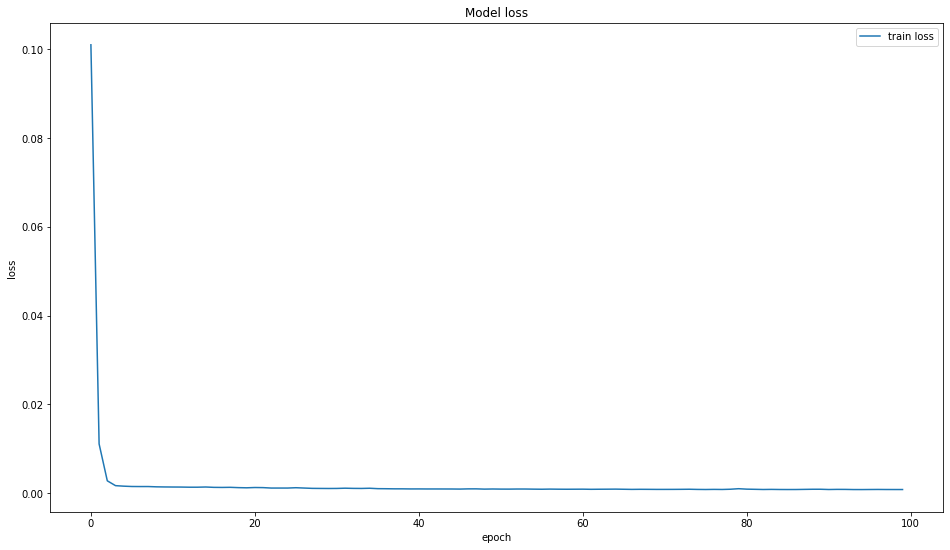

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss'])
plt.show() 

In [ ]:
lag_preds_10step = []
lag_actual_10step = []
for i in range(len(test_X)):
  lag_preds_10step.append(prep_data_lag(model, test_X, test_y, i, scaler))
  lag_actual_10step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lag_preds_10step), len(lag_actual_10step)

(482, 482)

In [ ]:
Mape_10step = []
Mae_10step= []
Rmse_10step = []
Nrmse_10step = []

for pred,actual in zip(lag_preds_10step, lag_actual_10step): 
  mae, mape, rmse, nrmse = calc_metrics(actual, pred)
  Mape_10step.append(mape)
  Mae_10step.append(mae)
  Rmse_10step.append(rmse)
  Nrmse_10step.append(nrmse)

In [ ]:
return_metrics(Mape_10step, Mae_10step, Rmse_10step, Nrmse_10step)

('0.009 +- 0.006', '0.012 +- 0.008', '0.012 +- 0.008', '0.009 +- 0.006')

## Load Models

In [ ]:
# lstm_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_With_Lag.h5')
# gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_With_Lag.h5')
# lstm_gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_With_Lag.h5')

lstm_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_With_Lag_Only.h5')
gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_With_Lag_Only.h5')
lstm_gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_With_Lag_Only.h5')

lstm_model_5step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_With_Lag_5step.h5')
gru_model_5step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_With_Lag_5step.h5')
lstm_gru_model_5step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_With_Lag_5step.h5')

lstm_model_10step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_With_Lag_10step.h5')
gru_model_10step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_With_Lag_10step.h5')
lstm_gru_model_10step = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_With_Lag_10step.h5')

### 1 Step

In [ ]:
X_lag =  df_lag.loc[:, list(df_lag.columns[-lag:])]
# X_lag = df_lag.loc[:, lag_columns]
X_lag.shape

(3248, 5)

In [ ]:
X_scaler_lag = MinMaxScaler()
Y_scaler_lag = MinMaxScaler()
X_data_lag = X_scaler_lag.fit_transform(X_lag)
Y_data_lag = Y_scaler_lag.fit_transform(y_lag.to_numpy().reshape(-1,1))

In [ ]:
X_train_LSTM_lag = X_data_lag[:-n_test_lag]
y_train_LSTM_lag = Y_data_lag[:-n_test_lag]

# creating target and features for test set
X_test_LSTM_lag = X_data_lag[-n_test_lag:]
y_test_LSTM_lag = Y_data_lag[-n_test_lag:]

In [ ]:
X_train_LSTM_lag = X_train_LSTM_lag.reshape(X_train_LSTM_lag.shape[0], X_train_LSTM_lag.shape[1], 1)
X_train_LSTM_lag.shape

(2760, 5, 1)

In [ ]:
X_test_LSTM_lag = X_test_LSTM_lag.reshape(X_test_LSTM_lag.shape[0], X_test_LSTM_lag.shape[1], 1)
X_test_LSTM_lag.shape

(488, 5, 1)

In [ ]:
y_pred_LSTM = lstm_model.predict(X_test_LSTM_lag)
pred_Inverse_LSTM = Y_scaler_lag.inverse_transform(np.reshape(y_pred_LSTM, (y_pred_LSTM.shape[0], y_pred_LSTM.shape[1])))

In [ ]:
y_pred_GRU = gru_model.predict(X_test_LSTM_lag)
pred_Inverse_GRU = Y_scaler_lag.inverse_transform(np.reshape(y_pred_GRU, (y_pred_GRU.shape[0], y_pred_GRU.shape[1])))

In [ ]:
y_pred_LSTM_GRU = lstm_gru_model.predict(X_test_LSTM_lag)
pred_Inverse_LSTM_GRU = Y_scaler_lag.inverse_transform(np.reshape(y_pred_LSTM_GRU, (y_pred_LSTM_GRU.shape[0], y_pred_LSTM_GRU.shape[1])))

### Multistep

In [ ]:
# split a multivariate sequence into samples
def split_sequences_lag(sequences, date_list, n_steps_in, n_steps_out):
 X, y, dates = list(), list(), list()
 for i in range(len(sequences)):
  # find the end of this pattern
  end_ix = i + n_steps_in
  out_end_ix = end_ix + n_steps_out-1
  # check if we are beyond the dataset
  if out_end_ix > len(sequences):
   break
  # gather input and output parts of the pattern
  seq_x, seq_y, seq_d = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1], date_list[end_ix-1:out_end_ix]
  X.append(seq_x)
  y.append(seq_y)
  dates.append(seq_d)
 return np.array(X), np.array(y), np.array(dates)

In [ ]:
def prep_data_lag(model, X_test, y_test, pos, sc):
  test_X_new = X_test[pos]
  test_X_new = test_X_new.reshape(1,n_past,n_features)
  # print(test_X_new.shape)

  y_pred = model.predict(test_X_new)
  y_pred_inv = sc.inverse_transform(y_pred)
  # print(y_pred.shape, y_pred_inv.shape)
  
  return y_pred_inv

In [ ]:
target_var = 'DEXCAUS'

#### 5 Step

In [ ]:
df_lag_5step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_5step.columns:
  df_lag_5step[col] = scaler.fit_transform(df_lag_5step[col].values.reshape(-1,1))

df_lag_5step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_5step = df_lag['DATE']
dates_5step.shape

(3248,)

In [ ]:
n_past = 15
n_future = 5 
n_features = 5

X_5step, y_5step, dates_5step = split_sequences_lag(np.array(df_lag_5step), dates_5step, n_past, n_future)
X_5step.shape, y_5step.shape

((3230, 15, 5), (3230, 5))

In [ ]:
split_point = int(data_split * X_5step.shape[0])
train_X , train_y = X_5step[:split_point, :] , y_5step[:split_point, :]
test_X , test_y = X_5step[split_point:, :] , y_5step[split_point:, :]

In [ ]:
test_dates_5step = dates_5step[split_point:]
test_dates_5step.shape

(485, 5)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2745, 15, 5), (2745, 5), (485, 15, 5), (485, 5))

In [ ]:
actual_5step = []

lstm_preds_5step = []
gru_preds_5step = []
lstm_gru_preds_5step = []

for i in range(len(test_X)):
  lstm_preds_5step.append(prep_data_lag(lstm_model_5step, test_X, test_y, i, scaler))
  gru_preds_5step.append(prep_data_lag(gru_model_5step, test_X, test_y, i, scaler))
  lstm_gru_preds_5step.append(prep_data_lag(lstm_gru_model_5step, test_X, test_y, i, scaler))
  actual_5step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lstm_preds_5step), len(gru_preds_5step), len(lstm_gru_preds_5step), len(actual_5step)

(485, 485, 485, 485)

#### 10 Step

In [ ]:
df_lag_10step = df_lag.loc[:, list(df_lag.columns[-lag:]) + ['DEXCAUS']]
df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,1.1890,1.1850,1.1822,1.1920,1.2101,1.1920
1,1.1920,1.1890,1.1850,1.1822,1.1920,1.2075
2,1.2075,1.1920,1.1890,1.1850,1.1822,1.2255
3,1.2255,1.2075,1.1920,1.1890,1.1850,1.2373
4,1.2373,1.2255,1.2075,1.1920,1.1890,1.2623


In [ ]:
scaler = MinMaxScaler()

for col in df_lag_10step.columns:
  df_lag_10step[col] = scaler.fit_transform(df_lag_10step[col].values.reshape(-1,1))

df_lag_10step.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,DEXCAUS
0,0.474728,0.466952,0.461509,0.480560,0.515747,0.480560
1,0.480560,0.474728,0.466952,0.461509,0.480560,0.510692
2,0.510692,0.480560,0.474728,0.466952,0.461509,0.545684
3,0.545684,0.510692,0.480560,0.474728,0.466952,0.568624
4,0.568624,0.545684,0.510692,0.480560,0.474728,0.617224


In [ ]:
dates_10step = df_lag['DATE']
dates_10step.shape

(3248,)

In [ ]:
n_past = 30
n_future = 10 
n_features = 5

X_10step, y_10step, dates_10step = split_sequences_lag(np.array(df_lag_10step), dates_10step, n_past, n_future)
X_10step.shape, y_10step.shape

((3210, 30, 5), (3210, 10))

In [ ]:
split_point = int(data_split * X_10step.shape[0])
train_X , train_y = X_10step[:split_point, :] , y_10step[:split_point, :]
test_X , test_y = X_10step[split_point:, :] , y_10step[split_point:, :]

In [ ]:
test_dates_10step = dates_10step[split_point:]
test_dates_10step.shape

(482, 10)

In [ ]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((2728, 30, 5), (2728, 10), (482, 30, 5), (482, 10))

In [ ]:
actual_10step = []

lstm_preds_10step = []
gru_preds_10step = []
lstm_gru_preds_10step = []

for i in range(len(test_X)):
  lstm_preds_10step.append(prep_data_lag(lstm_model_10step, test_X, test_y, i, scaler))
  gru_preds_10step.append(prep_data_lag(gru_model_10step, test_X, test_y, i, scaler))
  lstm_gru_preds_10step.append(prep_data_lag(lstm_gru_model_10step, test_X, test_y, i, scaler))
  actual_10step.append(scaler.inverse_transform(test_y[i].reshape(1,n_future)))

In [ ]:
len(lstm_preds_10step), len(gru_preds_10step), len(lstm_gru_preds_10step), len(actual_10step)

(482, 482, 482, 482)

# Lag Metrics

In [ ]:
df_res = pd.DataFrame(columns=['Model', 'Day(s)', 'MAE', 'ND', 'RMSE', 'NRMSE'])
df_res = df_res.astype(dtype= {"Model":"string",
        "Day(s)":"int","ND":"string", "MAE":"string", "RMSE":"string", "NRMSE":"string"})
pred_days = [1,5,10]

for days in pred_days:
  for model_name in ['LSTM', 'GRU', 'GRU-LSTM']:
    Mape = []
    Mae = []
    Rmse = []
    Nrmse = []
    
    val_set = generateValSet(len(y_test_lag), days)
    ground_truth = y_test_lag

    if model_name == 'LSTM':
      if days==1:
        holdout = pred_Inverse_LSTM.flatten()
      elif days==5:
        for pred,actual in zip(lstm_preds_5step, actual_5step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue
      elif days==10:
        for pred,actual in zip(lstm_preds_10step, actual_10step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue

    elif model_name == 'GRU':
      if days==1:
        holdout = pred_Inverse_GRU.flatten()
      elif days==5:
        for pred,actual in zip(gru_preds_5step, actual_5step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue
      elif days==10:
        for pred,actual in zip(gru_preds_10step, actual_10step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue

    elif model_name == 'GRU-LSTM':
      if days==1:
        holdout = pred_Inverse_LSTM_GRU.flatten()
      elif days==5:
        for pred,actual in zip(lstm_gru_preds_5step, actual_5step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue
      elif days==10:
        for pred,actual in zip(lstm_gru_preds_10step, actual_10step): 
          mae, mape, rmse, nrmse = calc_metrics(actual, pred)
          Mape.append(mape)
          Mae.append(mae)
          Rmse.append(rmse)
          Nrmse.append(nrmse)

        metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
        df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)
        continue

    else:
      break
  
    for val in val_set:
      forecast = holdout[:val]
      pred = forecast[-days:]
      true = ground_truth[:val]
      actual = true[-days:]
      mae, mape, rmse, nrmse = calc_metrics(actual, pred)
      Mape.append(mape)
      Mae.append(mae)
      Rmse.append(rmse)
      Nrmse.append(nrmse)
      
    metrics = return_metrics(Mape, Mae, Rmse, Nrmse)
    df_res = df_res.append({'Model':model_name, 'Day(s)': days, 'ND': metrics[0], 'MAE': metrics[1], 'RMSE': metrics[2], 'NRMSE': metrics[3]}, ignore_index=True)

In [ ]:
df_res

,Model,Day(s),MAE,ND,RMSE,NRMSE
0,LSTM,1,0.00639 +- 0.00628,0.00485 +- 0.00452,0.00639 +- 0.00628,0.00485 +- 0.00452
1,GRU,1,0.00772 +- 0.00805,0.00581 +- 0.00573,0.00772 +- 0.00805,0.00581 +- 0.00573
2,GRU-LSTM,1,0.00654 +- 0.00606,0.00499 +- 0.00444,0.00654 +- 0.00606,0.00499 +- 0.00444
3,LSTM,5,0.01079 +- 0.00786,0.00829 +- 0.00577,0.01079 +- 0.00786,0.00829 +- 0.00578
4,GRU,5,0.00792 +- 0.00681,0.00602 +- 0.00486,0.00792 +- 0.00681,0.00603 +- 0.00487
5,GRU-LSTM,5,0.0089 +- 0.00738,0.00676 +- 0.00527,0.0089 +- 0.00738,0.00677 +- 0.00528
6,LSTM,10,0.01293 +- 0.01101,0.00979 +- 0.00778,0.01293 +- 0.01101,0.00981 +- 0.00782
7,GRU,10,0.01036 +- 0.00818,0.0079 +- 0.00586,0.01036 +- 0.00818,0.00791 +- 0.0059
8,GRU-LSTM,10,0.0108 +- 0.00872,0.0082 +- 0.0062,0.0108 +- 0.00872,0.00821 +- 0.00625


In [ ]:
df_res.to_csv('only_lag_results.csv', index=False)

In [ ]:
df_res

,Model,Day(s),MAE,ND,RMSE,NRMSE
0,LSTM,1,0.00761 +- 0.00704,0.0058 +- 0.00515,0.00761 +- 0.00704,0.0058 +- 0.00515
1,GRU,1,0.00846 +- 0.008,0.00646 +- 0.00582,0.00846 +- 0.008,0.00646 +- 0.00582
2,GRU-LSTM,1,0.00808 +- 0.00758,0.00615 +- 0.00553,0.00808 +- 0.00758,0.00615 +- 0.00553


In [ ]:
df_res.to_csv('with_lag_results.csv', index=False)

# Saving Results

In [ ]:
def get_sample_dict(total_len, multistep_val):
  res = {}
  num_samp = total_len // multistep_val if total_len % multistep_val == 0 else total_len // (multistep_val-1)

  c = 0
  for i in range(total_len):
    if c <= num_samp:
      if i % multistep_val == 0:
        c += 1
      res[i] = c

  return res

In [ ]:
def save_results_lag(model_name, dates, actual, preds, multistep_val=0):
  assert len(dates) == len(actual) == len(preds)

  if not multistep_val:
    df_res = pd.DataFrame(columns=['Date', 'Actual', 'Predicted'])

    for d,a,p in zip(dates, actual, preds):
      df_res = df_res.append({'Date':d, 'Actual':a, 'Predicted':p}, ignore_index=True)

    df_res.to_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_lag_results.csv', index=False)
    # return df_res

  else:
    df_res = pd.DataFrame(columns=['Sample', 'Date', 'Actual', 'Predicted'])
    
    if model_name not in ['LSTM', 'GRU', 'GRU-LSTM']:
      s_dict = get_sample_dict(len(actual), multistep_val)
      for i, (d,a,p) in enumerate(zip(dates, actual, preds)):
        df_res = df_res.append({'Sample': s_dict[i], 'Date':d, 'Actual':a, 'Predicted':p}, ignore_index=True)
    else:
      for i, (d,a,p) in enumerate(zip(dates, actual, preds)):
        for j, (d1,a1,p1) in enumerate(zip(d,a[0],p[0])):
          df_res = df_res.append({'Sample': i+1, 'Date':d1, 'Actual':a1, 'Predicted':p1}, ignore_index=True)
    
    df_res.to_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_'+str(multistep_val)+'step_lag_results.csv', index=False)
    # return df_res

In [ ]:
save_results_lag('LSTM', test_dates_lag, y_test_lag, pred_Inverse_LSTM.flatten())
save_results_lag('LSTM', test_dates_5step, actual_5step, lstm_preds_5step, 5)
save_results_lag('LSTM', test_dates_10step, actual_10step, lstm_preds_10step, 10)

In [ ]:
save_results_lag('GRU', test_dates_lag, y_test_lag, pred_Inverse_GRU.flatten())
save_results_lag('GRU', test_dates_5step, actual_5step, gru_preds_5step, 5)
save_results_lag('GRU', test_dates_10step, actual_10step, gru_preds_10step, 10)

In [ ]:
save_results_lag('GRU-LSTM', test_dates_lag, y_test_lag, pred_Inverse_LSTM_GRU.flatten())
save_results_lag('GRU-LSTM', test_dates_5step, actual_5step, lstm_gru_preds_5step, 5)
save_results_lag('GRU-LSTM', test_dates_10step, actual_10step, lstm_gru_preds_10step, 10)

# Plots

## 1 Step

In [ ]:
def plot_single_step_forecast_lag(model_name, sample_size, save=False):
  if model_name != 'All':
    data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_lag_results.csv')

    true = data['Actual'][:sample_size]
    preds = data['Predicted'][:sample_size]
    dates = data['Date'][:sample_size]

    # fig = go.Figure()
    # fig.add_trace(go.Scatter(x=dates, y=true, mode='lines', line=dict(color='green'),
    #               name = 'Ground Truth'))
    # fig.add_trace(go.Scatter(x=dates, y=preds, mode='lines', line=dict(color='blue'),
    #               name = model_name))
    
    # fig.show()

  else:
    models = ['LSTM', 'GRU', 'GRU-LSTM']
    colors = ['blue', 'yellow', 'red']

    data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+models[0]+'_lag_results.csv')
    true = data['Actual'][:sample_size]
    dates = data['Date'][:sample_size]

  #   fig = go.Figure()
  #   fig.add_trace(go.Scatter(x=dates, y=true, mode='lines', line=dict(color='green'),
  #                 name = 'Ground Truth'))
  #   for m,c in zip(models, colors):
  #     fig.add_trace(go.Scatter(x=dates, y=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+m+'_lag_results.csv')['Predicted'][:sample_size], mode='lines', line=dict(color=c),
  #                 name = m))
    
  #   fig.show()
    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    yearsFmt = mdates.DateFormatter('%m-%Y')
    fig, ax = plt.subplots(figsize=(80,30))
    ax.plot(pd.to_datetime(dates), true, color='green', label = 'Ground Truth', linewidth=4.0)
    for m,c in zip(models, colors):
      ax.plot(pd.to_datetime(dates), pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+m+'_lag_results.csv')['Predicted'][:sample_size], color=c, label = m, linewidth=4.0)
    
    # format the ticks
    # ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    ax.xaxis.set_minor_locator(months)
    # datemin = datetime.date(min(pd.to_datetime(dates)))
    # datemax = datetime.date(max(pd.to_datetime(dates)))
    # ax.set_xlim(datemin, datemax)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    ax.grid(True)

    # rotates and right aligns the x labels, and moves the bottom of the
    # axes up to make room for them
    fig.autofmt_xdate()
    plt.legend(loc='upper right')
    if save:
      plt.savefig("/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/"+model_name+"_lag.pdf")
    plt.show()
  # fig.write_image("/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/"+model_name+"_lag.pdf", engine="kaleido", width=1000)

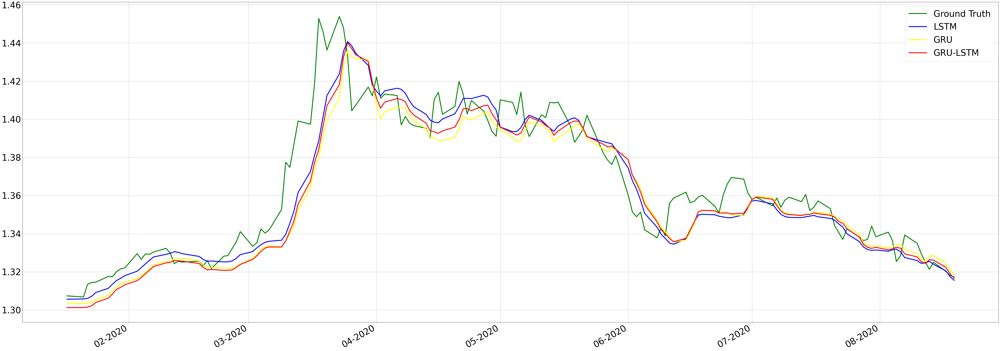

In [ ]:
plot_single_step_forecast_lag('All', 150, save=True)

In [ ]:
plot_single_step_forecast_lag('GRU', 150)

In [ ]:
plot_single_step_forecast_lag('GRU-LSTM', 150)

In [ ]:
plot_single_step_forecast_lag('All', 150)

## Multistep

In [ ]:
def get_best_plots_lag(model_name, multistep_val):
  data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_'+str(multistep_val)+'step_lag_results.csv')
  
  errors = {}

  for sample in data['Sample'].unique():
    true = data[data['Sample'] == sample]['Actual']
    preds = data[data['Sample'] == sample]['Predicted']
    errors[sample] = mean_squared_error(true, preds, squared=False)

  return sorted(errors, key=errors.get)[:5]

In [ ]:
def plot_multistep_forecast_lag(model_name, sample_num, multistep_val, save=False):

  data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MRP/results/'+model_name+'_'+str(multistep_val)+'step_lag_results.csv')
  true = data[data['Sample'] == sample_num]['Actual']
  preds = data[data['Sample'] == sample_num]['Predicted']
  dates = data[data['Sample'] == sample_num]['Date']

  plt.figure(figsize=(50,12))
  plt.plot(dates, true, color='green', label = 'Ground Truth')
  plt.plot(dates, preds, color='blue', label = model_name)
  plt.legend(loc="upper right")
  if save:
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/"+model_name+'_'+str(multistep_val)+"_lag.pdf")
  plt.show()

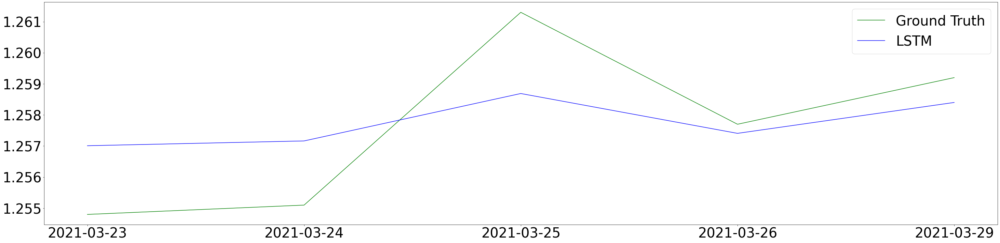

In [ ]:
plot_multistep_forecast_lag('LSTM', 294, 5, save=True)

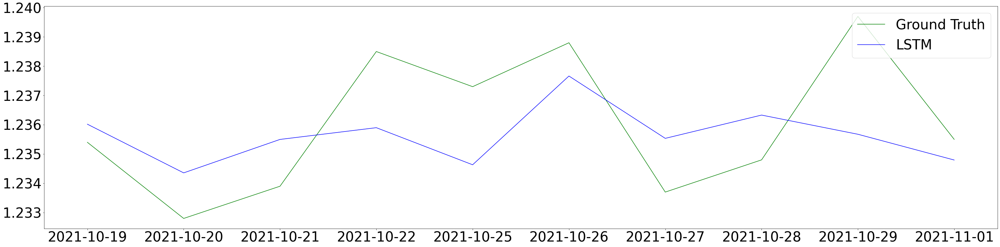

In [ ]:
plot_multistep_forecast_lag('LSTM', 442, 10, save=True)

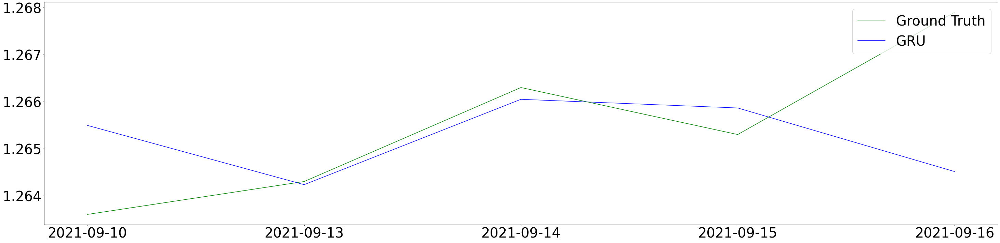

In [ ]:
plot_multistep_forecast_lag('GRU', 414, 5, save=True)

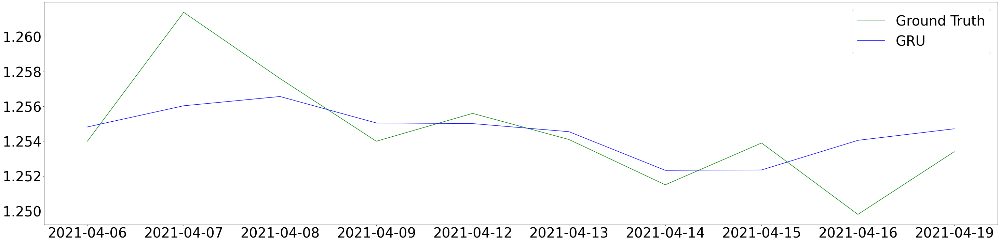

In [ ]:
plot_multistep_forecast_lag('GRU', 306, 10, save=True)

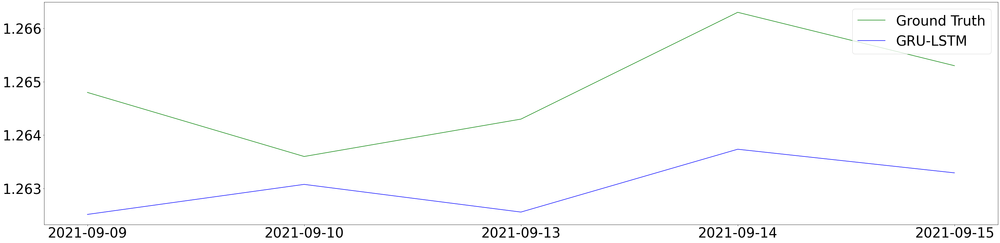

In [ ]:
plot_multistep_forecast_lag('GRU-LSTM', 413, 5, save=True)

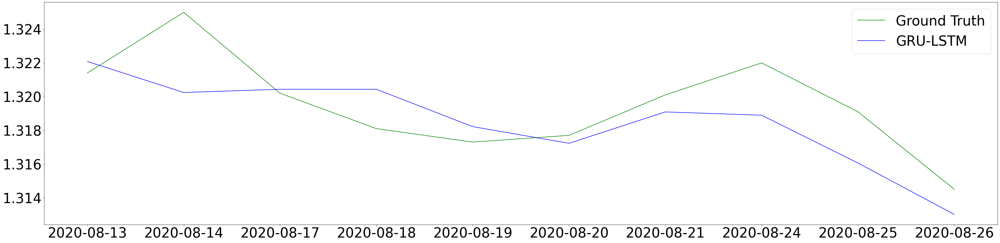

In [ ]:
plot_multistep_forecast_lag('GRU-LSTM', 149, 10, save=True)

# Model Interpretations

In [ ]:
import shap
tf.compat.v1.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


## Model Coefficients

### Ridge

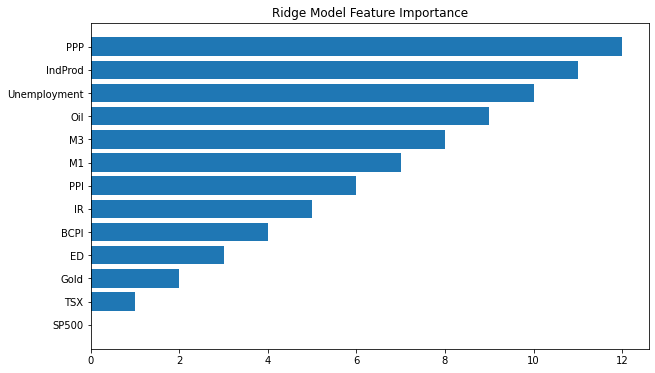

In [ ]:
importance = abs(ridge.coef_)
plt.figure(figsize=(10,6))
plt.barh(columns, [x for x in range(len(importance))])
plt.title('Ridge Model Feature Importance')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/Ridge_feat_imp.pdf')
plt.show()

### Lasso

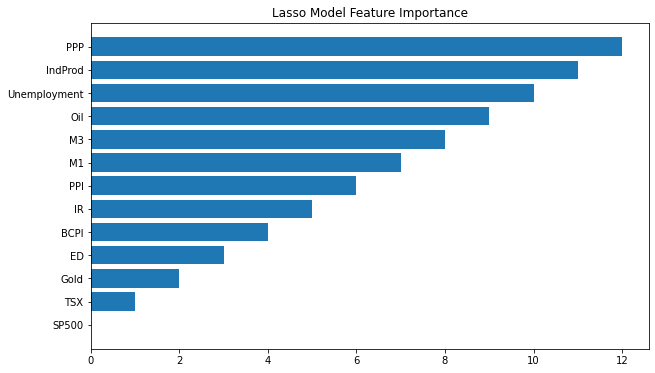

In [ ]:
importance = abs(lasso.coef_)
plt.figure(figsize=(10,6))
plt.barh(columns, [x for x in range(len(importance))])
plt.title('Lasso Model Feature Importance')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/Lasso_feat_imp.pdf')
plt.show()

### SVR

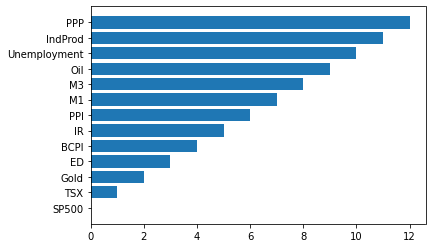

In [ ]:
# get importance
importance = abs(svr.coef_[0])
# summarize feature importance
# for imp, col in zip(importance, columns):
# 	print(f'Feature: {col}, Importance: {imp}')
plt.barh(columns, [x for x in range(len(importance))])
plt.show()

## Tree SHAP

### RF

In [ ]:
explainer = shap.TreeExplainer(model=rgr,
                               data=None,
                               model_output='raw',
                               feature_perturbation='tree_path_dependent')

In [ ]:
shap_values = explainer.shap_values(X_test)

In [ ]:
print(f'Shape of test dataset: {X_test.shape}')
print(f'Type of shap_values: {type(shap_values)}. Length of the list: {len(shap_values)}')
print(f'Shape of shap_values: {np.array(shap_values).shape}')

Shape of test dataset: (488, 13)
Type of shap_values: <class 'numpy.ndarray'>. Length of the list: 488
Shape of shap_values: (488, 13)


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], features=X_test[0,:], feature_names=columns)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:100], features=X_test[:100,:], feature_names=columns)

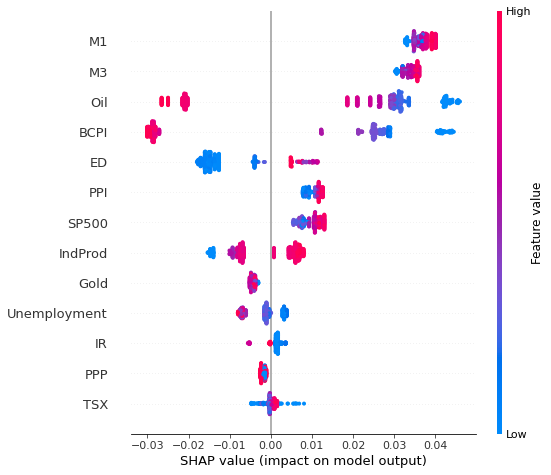

In [ ]:
shap.summary_plot(shap_values, features=X_test, feature_names=columns)

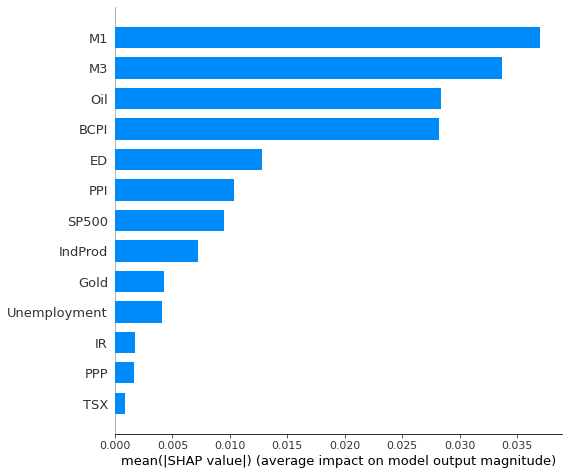

In [ ]:
shap.summary_plot(shap_values, features=X_test, feature_names=columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/RF_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

### ExtraTrees

In [ ]:
explainer = shap.TreeExplainer(model=etr,
                               data=None,
                               model_output='raw',
                               feature_perturbation='tree_path_dependent')

In [ ]:
shap_values = explainer.shap_values(X_test)

In [ ]:
print(f'Shape of test dataset: {X_test.shape}')
print(f'Type of shap_values: {type(shap_values)}. Length of the list: {len(shap_values)}')
print(f'Shape of shap_values: {np.array(shap_values).shape}')

Shape of test dataset: (488, 13)
Type of shap_values: <class 'numpy.ndarray'>. Length of the list: 488
Shape of shap_values: (488, 13)


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], features=X_test[0,:], feature_names=columns)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:100], features=X_test[:100,:], feature_names=columns)

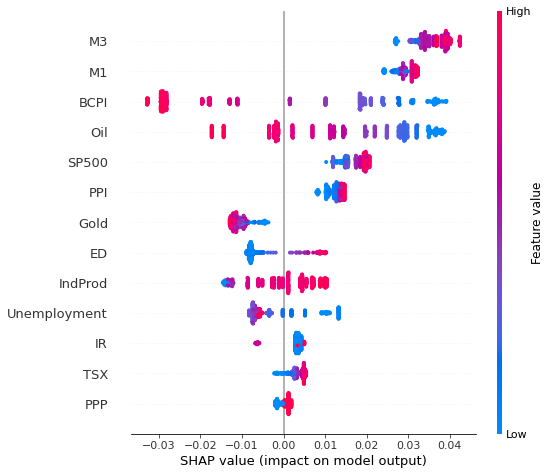

In [ ]:
shap.summary_plot(shap_values, features=X_test, feature_names=columns)

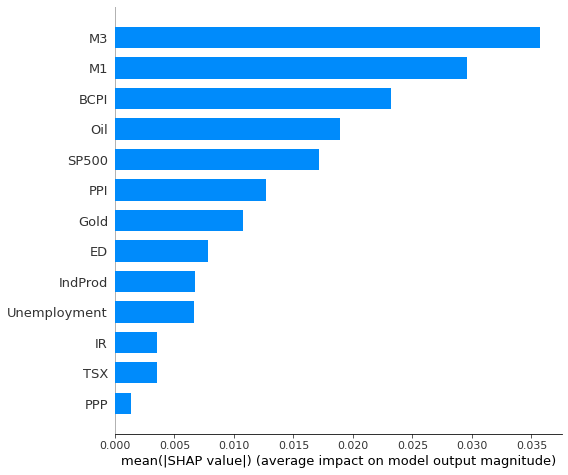

In [ ]:
shap.summary_plot(shap_values, features=X_test, feature_names=columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/ET_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

### XGBoost

In [ ]:
explainer = shap.TreeExplainer(model=xgbr,
                               data=None,
                               model_output='raw',
                               feature_perturbation='tree_path_dependent')

In [ ]:
shap_values = explainer.shap_values(X_test)

In [ ]:
print(f'Shape of test dataset: {X_test.shape}')
print(f'Type of shap_values: {type(shap_values)}. Length of the list: {len(shap_values)}')
print(f'Shape of shap_values: {np.array(shap_values).shape}')

Shape of test dataset: (488, 13)
Type of shap_values: <class 'numpy.ndarray'>. Length of the list: 488
Shape of shap_values: (488, 13)


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], features=X_test[0,:], feature_names=columns)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:100], features=X_test[:100,:], feature_names=columns)

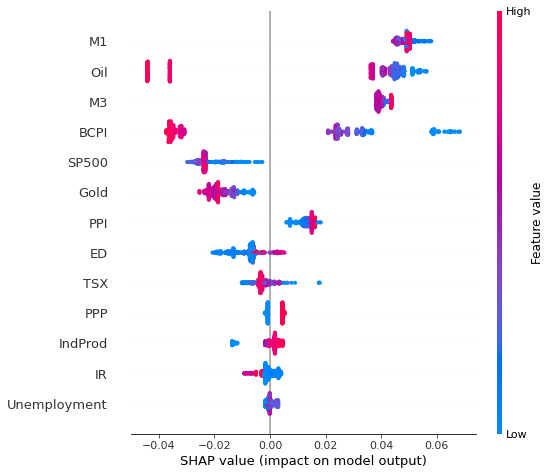

In [ ]:
shap.summary_plot(shap_values, features=X_test, feature_names=columns)

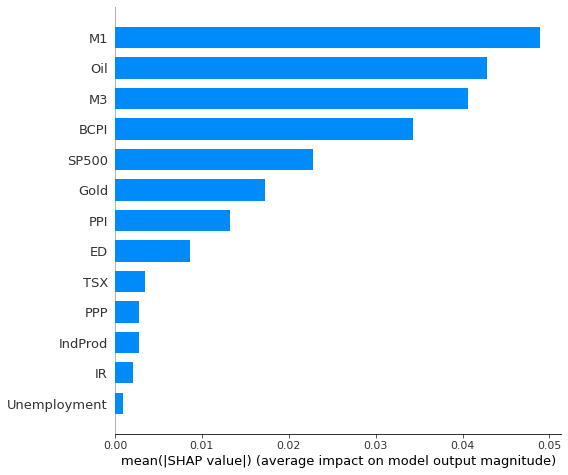

In [ ]:
shap.summary_plot(shap_values, features=X_test, feature_names=columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/XGB_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

## Deep SHAP

### Without Lag

In [ ]:
lstm_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_No_Lag.h5')
gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_No_Lag.h5')
lstm_gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_No_Lag.h5')

#### LSTM

In [ ]:
X_train_LSTM.shape

(2765, 13, 1)

In [ ]:
explainer = shap.DeepExplainer(lstm_model, X_train_LSTM[:1000])
shap_values = explainer.shap_values(X_test_LSTM[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM[:100]
X_test_sample = X_test_sample.reshape(100,len(columns))
shap_v = shap_v.reshape(100,len(columns))

X_test_sample.shape, shap_v.shape

((100, 13), (100, 13))

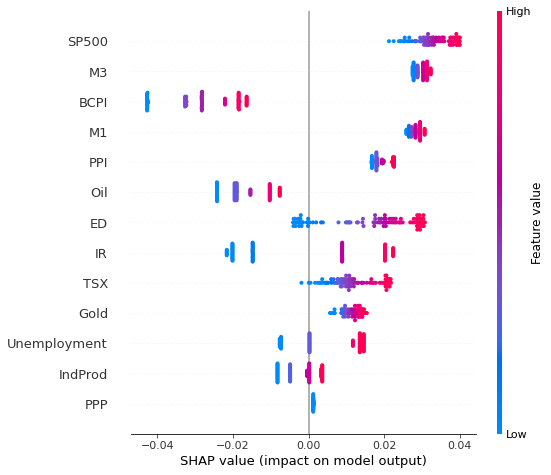

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=columns)

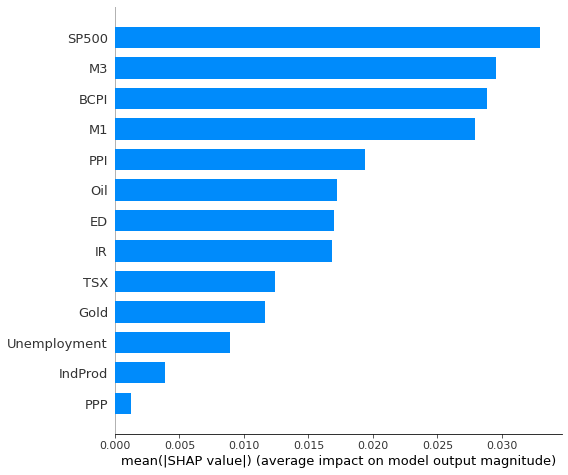

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/LSTM_no_lag_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

#### GRU

In [ ]:
explainer = shap.DeepExplainer(gru_model, X_train_LSTM[:1000])
shap_values = explainer.shap_values(X_test_LSTM[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM[:100]
X_test_sample = X_test_sample.reshape(100,len(columns))
shap_v = shap_v.reshape(100,len(columns))

X_test_sample.shape, shap_v.shape

((100, 13), (100, 13))

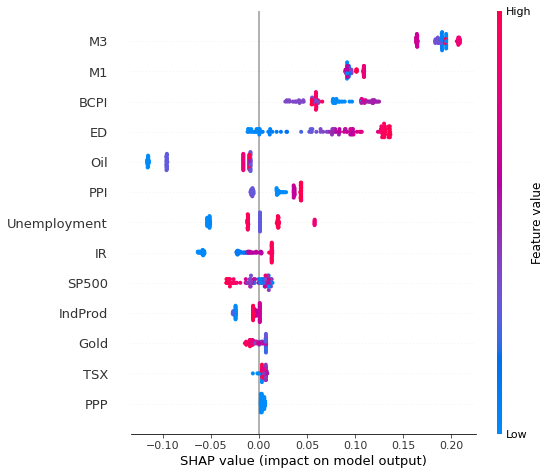

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=columns)

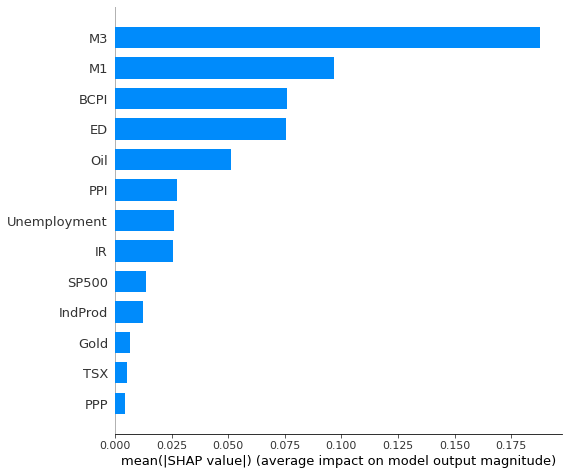

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/GRU_no_lag_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

#### GRU-LSTM

In [ ]:
explainer = shap.DeepExplainer(lstm_gru_model, X_train_LSTM[:1000])
shap_values = explainer.shap_values(X_test_LSTM[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM[:100]
X_test_sample = X_test_sample.reshape(100,len(columns))
shap_v = shap_v.reshape(100,len(columns))

X_test_sample.shape, shap_v.shape

((100, 13), (100, 13))

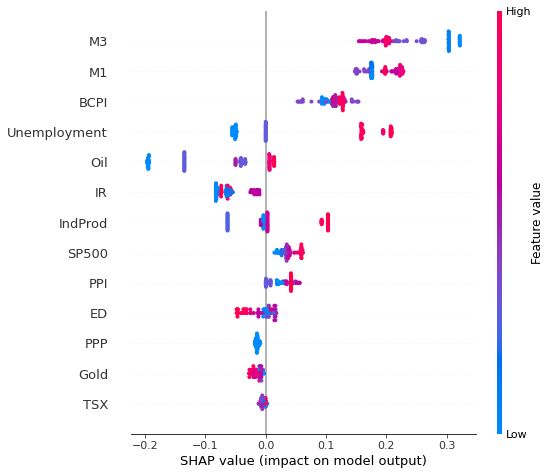

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=columns)

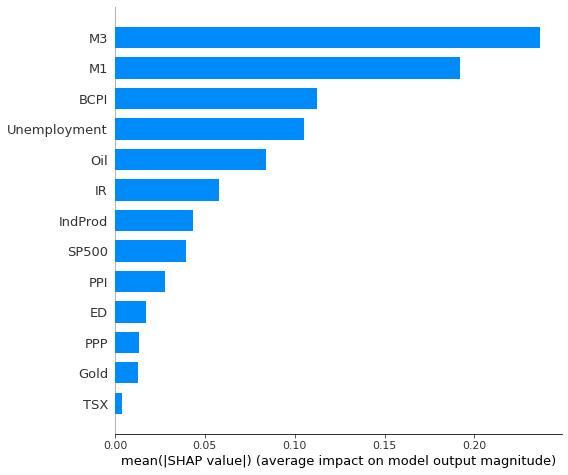

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/GRU_LSTM_no_lag_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

### With Lag + Features

In [ ]:
lstm_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_With_Lag.h5')
gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_With_Lag.h5')
lstm_gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_With_Lag.h5')

#### LSTM

In [ ]:
explainer = shap.DeepExplainer(lstm_model, X_train_LSTM_lag[:1000])
shap_values = explainer.shap_values(X_test_LSTM_lag[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM_lag[:100]
X_test_sample = X_test_sample.reshape(100,len(lag_columns))
shap_v = shap_v.reshape(100,len(lag_columns))

X_test_sample.shape, shap_v.shape

((100, 18), (100, 18))

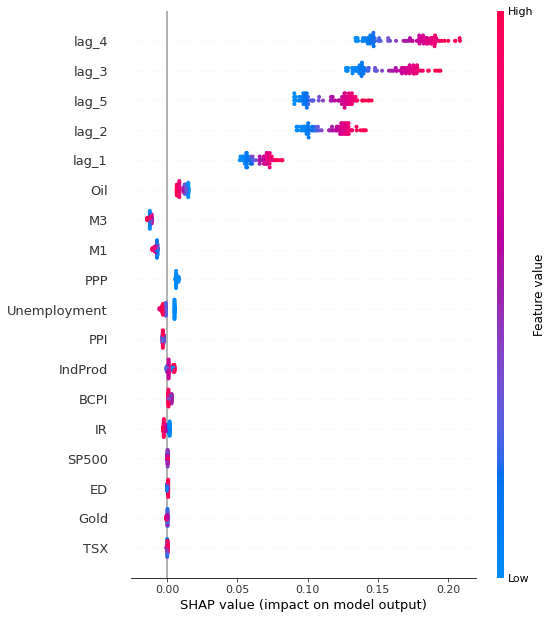

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns)

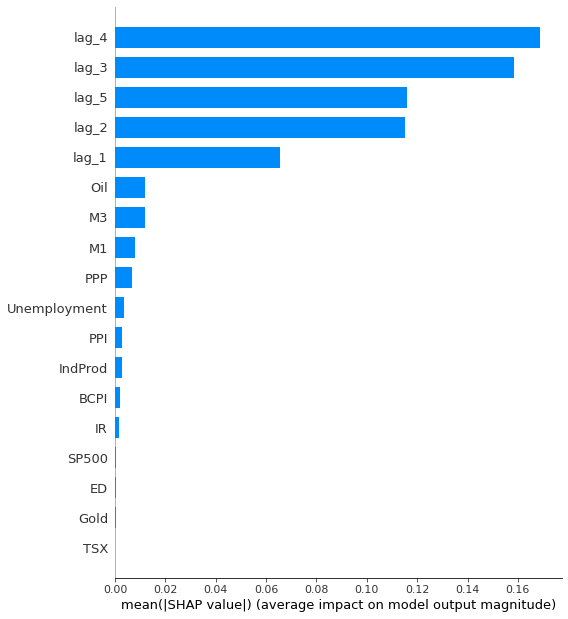

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/LSTM_lag_feat_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

#### GRU

In [ ]:
explainer = shap.DeepExplainer(gru_model, X_train_LSTM_lag[:1000])
shap_values = explainer.shap_values(X_test_LSTM_lag[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM_lag[:100]
X_test_sample = X_test_sample.reshape(100,len(lag_columns))
shap_v = shap_v.reshape(100,len(lag_columns))

X_test_sample.shape, shap_v.shape

((100, 18), (100, 18))

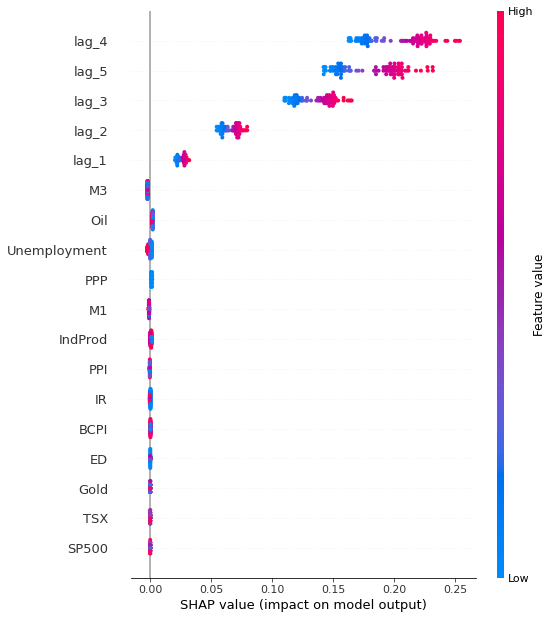

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns)

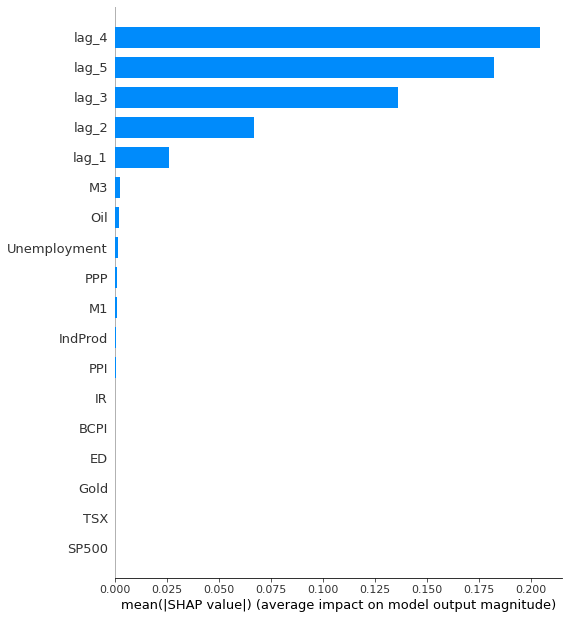

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/GRU_lag_feat_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

#### GRU-LSTM

In [ ]:
explainer = shap.DeepExplainer(lstm_gru_model, X_train_LSTM_lag[:1000])
shap_values = explainer.shap_values(X_test_LSTM_lag[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM_lag[:100]
X_test_sample = X_test_sample.reshape(100,len(lag_columns))
shap_v = shap_v.reshape(100,len(lag_columns))

X_test_sample.shape, shap_v.shape

((100, 18), (100, 18))

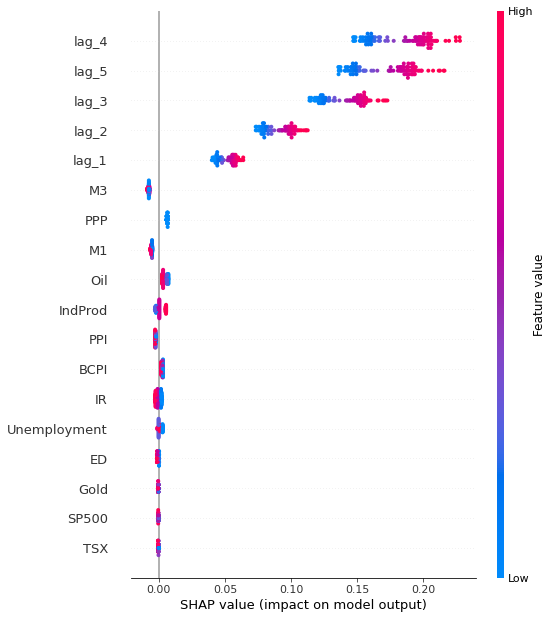

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns)

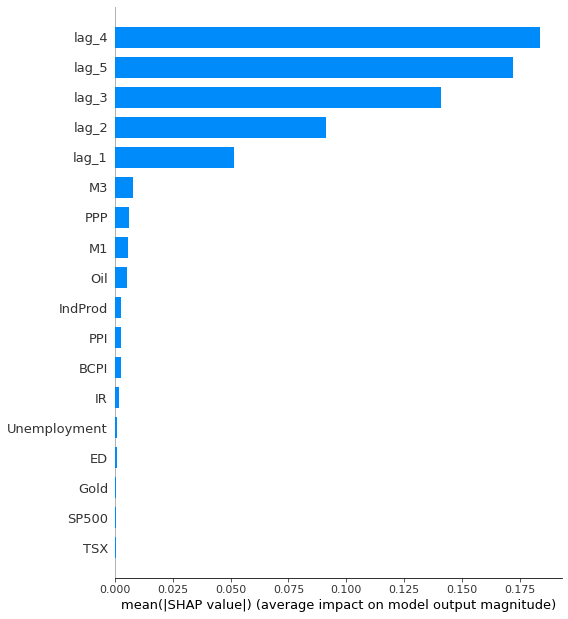

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns, plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/GRU_LSTM_lag_feat_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

### With Lag - Only

In [ ]:
lstm_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_Multivariate_With_Lag_Only.h5')
gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/GRU_Multivariate_With_Lag_Only.h5')
lstm_gru_model = load_model('/content/drive/MyDrive/Colab Notebooks/MRP/models/LSTM_GRU_Multivariate_With_Lag_Only.h5')

#### LSTM

In [ ]:
X_train_LSTM_lag.shape

(2760, 5, 1)

In [ ]:
explainer = shap.DeepExplainer(lstm_model, X_train_LSTM_lag[:1000])
shap_values = explainer.shap_values(X_test_LSTM_lag[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM_lag[:100]
X_test_sample = X_test_sample.reshape(100,lag)
shap_v = shap_v.reshape(100,lag)

X_test_sample.shape, shap_v.shape

((100, 5), (100, 5))

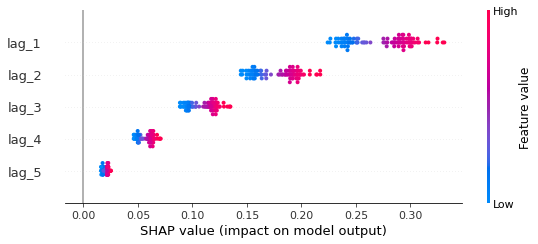

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns[-5:])

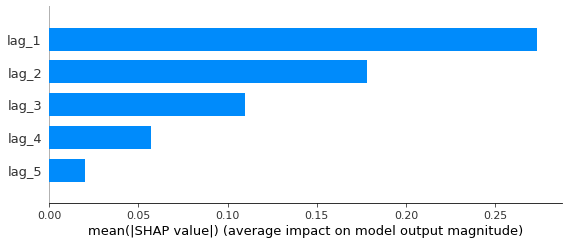

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns[-5:], plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/LSTM_lag_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

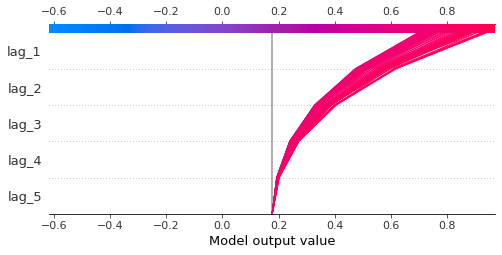

In [ ]:
shap.decision_plot(explainer.expected_value, shap_v, lag_columns[-5:])

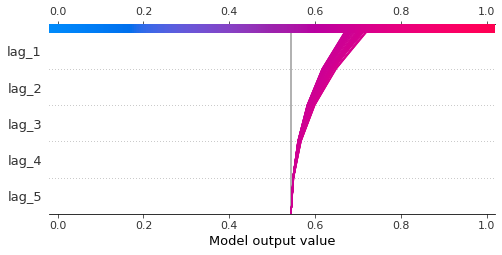

In [ ]:
shap.decision_plot(explainer.expected_value, shap_v, lag_columns[-5:], link='logit')

#### GRU

In [ ]:
explainer = shap.DeepExplainer(gru_model, X_train_LSTM_lag[:1000])
shap_values = explainer.shap_values(X_test_LSTM_lag[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM_lag[:100]
X_test_sample = X_test_sample.reshape(100,lag)
shap_v = shap_v.reshape(100,lag)

X_test_sample.shape, shap_v.shape

((100, 5), (100, 5))

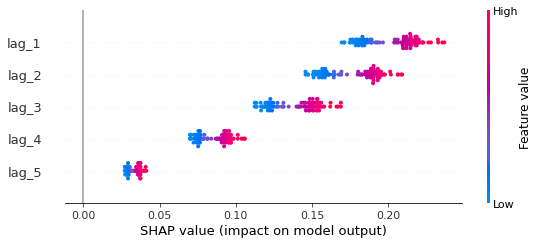

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns[-5:])

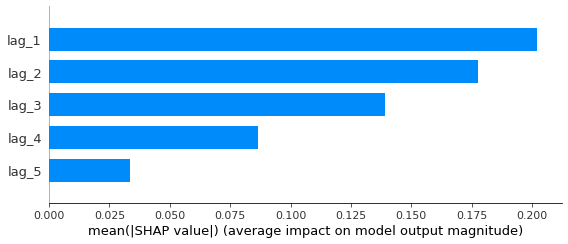

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns[-5:], plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/GRU_lag_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

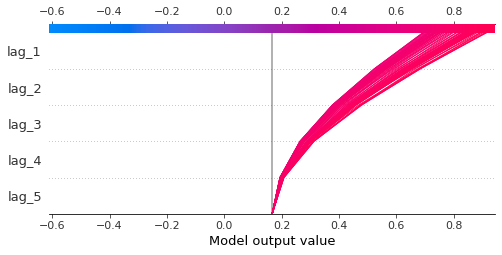

In [ ]:
shap.decision_plot(explainer.expected_value, shap_v, lag_columns[-5:])

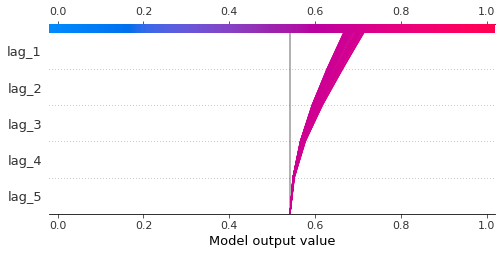

In [ ]:
shap.decision_plot(explainer.expected_value, shap_v, lag_columns[-5:], link='logit')

#### GRU-LSTM

In [ ]:
explainer = shap.DeepExplainer(lstm_gru_model, X_train_LSTM_lag[:1000])
shap_values = explainer.shap_values(X_test_LSTM_lag[:100], check_additivity=False)

In [ ]:
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0])

In [ ]:
shap_v = shap_values[0]
shap_v = np.array(shap_v)

X_test_sample = X_test_LSTM_lag[:100]
X_test_sample = X_test_sample.reshape(100,lag)
shap_v = shap_v.reshape(100,lag)

X_test_sample.shape, shap_v.shape

((100, 5), (100, 5))

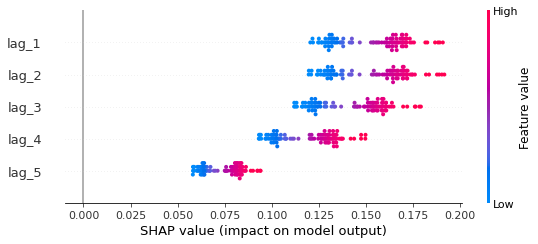

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns[-5:])

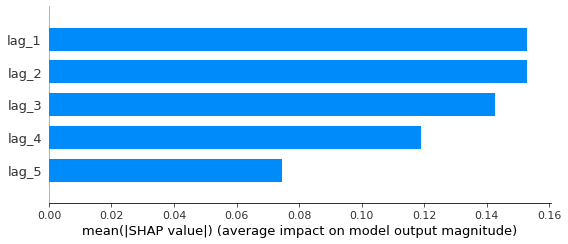

In [ ]:
shap.summary_plot(shap_v, X_test_sample, feature_names=lag_columns[-5:], plot_type='bar', show=False)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MRP/results/plots/GRU_LSTM_lag_shap.pdf', format='pdf', dpi=600, bbox_inches='tight')
plt.show()

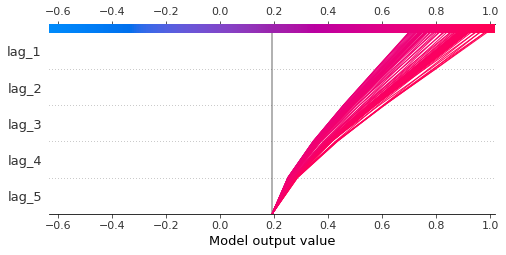

In [ ]:
shap.decision_plot(explainer.expected_value, shap_v, lag_columns[-5:])

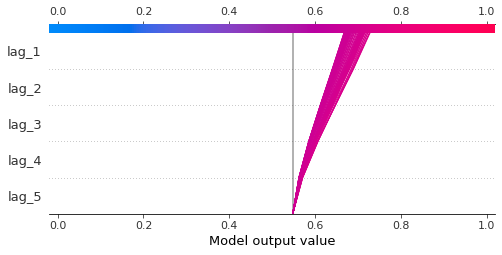

In [ ]:
shap.decision_plot(explainer.expected_value, shap_v, lag_columns[-5:], link='logit')